## IMPORT

In [1]:
# What version of Python do you have?
import sys
import pandas as pd
import numpy as np
import math
from PIL import Image, ImageOps
from scipy import stats
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
from skimage import exposure

from tqdm import tqdm

import gc
import copy
import cv2

# import sklearn as sk
import tensorflow as tf
from tensorflow import keras
from pathlib import Path

In [2]:
from keras.preprocessing.image import load_img, img_to_array, smart_resize, ImageDataGenerator
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.utils import get_file, plot_model, to_categorical

In [3]:
#IMPORT ALL LAYERS AND KERAS/TENSORFLOW PARAMS
from keras import layers
from keras.layers import StringLookup, CategoryEncoding, GlobalMaxPooling2D, Rescaling, SeparableConv2D, BatchNormalization, Conv2D, MaxPool2D, Activation, Dropout, Dense, Flatten, Input, Concatenate, Add, AveragePooling2D, GlobalAveragePooling2D, AveragePooling1D, Reshape
from keras.models import Sequential, Model
from keras.activations import relu,leaky_relu
from keras.initializers import RandomNormal
from keras.regularizers import l2, l1, l1_l2
import keras_ocr 

In [4]:
# Import Library.
# import pydicom
# from pydicom.pixel_data_handlers.util import apply_voi_lut

In [5]:
print(f"Python {sys.version}")
print(f"Tensor Flow Version: {tf.__version__}")
print(f"Keras Version: {keras.__version__}")
print(f"Pandas {pd.__version__}")
print(f"Keras Version: {np.__version__}")
print()
gpu = len(tf.config.list_physical_devices('GPU'))>0
print("GPU is", "available" if gpu else "NOT AVAILABLE")

Python 3.9.7 (default, Sep 16 2021, 16:59:28) [MSC v.1916 64 bit (AMD64)]
Tensor Flow Version: 2.8.0
Keras Version: 2.8.0
Pandas 1.3.5
Keras Version: 1.22.3

GPU is available


In [6]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(physical_devices)
tf.config.experimental.set_memory_growth(physical_devices[0], True)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [7]:
!nvidia-smi

Thu Mar 17 19:35:46 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 511.65       Driver Version: 511.65       CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0  On |                  N/A |
|  0%   50C    P8    39W / 350W |   1920MiB / 12288MiB |     41%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Dempster shafer layers import

In [8]:
sys.path.append('E-CNN-classifier-main/libs')
import ds_layer #Dempster-Shafer layer
import utility_layer_train #Utility layer for training
import utility_layer_test #Utility layer for training
import AU_imprecision #Metric average utility for set-valued classification

## UTILS

### UTILS PATHS

In [9]:
checkpointPath = Path('MultilayerFusion/Data_ONLY/OUTPUTS/CHECKPOINTS/')
graphPath = Path('MultilayerFusion/Data_ONLY/OUTPUTS/GRAPHS/')
pathSavedModel = Path('MultilayerFusion/Data_ONLY/OUTPUTS/MODELS-PB/')
plotpath = Path('MultilayerFusion/Data_ONLY/OUTPUTS/PLTS/')
databasePath = Path('COVIDARCHIVEdicom/')
databasePathIMAGES = Path('COVIDARCHIVEdicom/images/')

In [10]:
checkpointPath.mkdir(parents=True, exist_ok=True)
graphPath.mkdir(parents=True, exist_ok=True)
pathSavedModel.mkdir(parents=True, exist_ok=True)
plotpath.mkdir(parents=True, exist_ok=True)

### RANDOM NUMBER

In [11]:
random_seed = 42

### GLOBAL VARIABLES

In [12]:
IMAGE_SIZE = [224,224]
CLASS_NAMES = ['MILD', 'SEVERE']

### FUNCTIONS

In [13]:
def printAndSaveGraphs(pathWsave,nameOfModelGraph, history, Metrics, saveit = True, dpi = 300):

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model '+nameOfModelGraph+ ' loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation-HKonly'], loc='upper left')
    if saveit:
        plt.savefig(Path(pathWsave) / Path(nameOfModelGraph + '_loss.png'),dpi=dpi)
    plt.show()

    for met in Metrics:
        # summarize history for accuracy
        plt.plot(history.history[met.name])
        plt.plot(history.history['val_'+met.name])
        plt.title('model '+nameOfModelGraph+ met.name)
        plt.ylabel(met.name)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        if saveit:
            plt.savefig(Path(pathWsave) / Path(nameOfModelGraph + met.name + '.png'),dpi=dpi)
        plt.show()

In [14]:
METRICS = [
    tf.keras.metrics.BinaryAccuracy(name='binary_accuracy'),
    # tf.keras.metrics.Accuracy(name='accuracy'),
    tf.keras.metrics.Precision(name="precision"),
    tf.keras.metrics.Recall(name="recall"),
    tf.keras.metrics.TruePositives(name="True_Positives"),
    tf.keras.metrics.TrueNegatives(name="True_Negatives"),
    tf.keras.metrics.FalsePositives(name="False_Positives"),
    tf.keras.metrics.FalseNegatives(name="False_Negatives"),
]

In [15]:
# read in all our data
COVID19_dataHK = pd.read_csv(databasePath / 'es_dump_data.csv')
#take only y and filepath
# COVID19_dataHK = pd.DataFrame(COVID19_dataHK[['ImageFile','Prognosis','sha256']])
COVID19_dataHK['ImageFile'] = COVID19_dataHK['sha256'] + '-' + COVID19_dataHK['ImageFile']
COVID19_dataHK = COVID19_dataHK.drop(columns=['sha256'])
print(COVID19_dataHK.shape)

(1103, 46)


In [16]:
COVID19_dataHK.head()

,Row_number,ImageFile,Hospital,Age,Sex,Positivity at admission,Temp_C,DaysFever,Cough,DifficultyInBreathing,...,Diabetes,Dementia,BPCO,Cancer,Chronic Kidney disease,RespiratoryFailure,Obesity,Position,Prognosis,Death
0,969,a987bf874b9bf185714a47a3ca526cde01909f182db0a8...,F,46.0,1,1.0,NaN,3.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,MILD,0
1,977,d0b85929c67c0cc4c9ec1b575fd38528fc54866ef40c66...,F,69.0,0,1.0,37.7,NaN,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,NaN,1.0,MILD,0
2,973,32015df154187a5a5544f8f863eacbf61fbfe12d130dd8...,F,47.0,1,1.0,NaN,2.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.0,MILD,0
3,965,f4fbdd06f358873f3c5a2bf3c3144c6f406e46ba8f6dbc...,F,68.0,1,1.0,39.8,1.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,NaN,1.0,MILD,0
4,971,8918c72266726a30ce36d65bc774b0e188a2dc48584af0...,F,70.0,1,1.0,38.5,4.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,NaN,1.0,SEVERE,0


In [17]:
print(COVID19_dataHK.isna().sum().sum())
print(COVID19_dataHK.size)

print('percentage= '+str((COVID19_dataHK.isna().sum().sum()/COVID19_dataHK.size)*100))


9469
50738
percentage= 18.662540896369585


In [18]:
mapping = {}
for x in range(len(CLASS_NAMES)):
    mapping[CLASS_NAMES[x]] = x



takename = copy.deepcopy(COVID19_dataHK['Prognosis'])
for x in range(len(takename)):
    takename[x] = mapping[takename[x]]


one_h_enc = to_categorical(takename)

COVID19_dataHK['MILD'] = one_h_enc[:,0]
COVID19_dataHK['SEVERE'] = one_h_enc[:,1]

In [19]:
#one hot encoder Hospitals
HOSPITAL_NAMES= ['A','B','C','D','E','F']

mapping = {}
for x in range(len(HOSPITAL_NAMES)):
    mapping[HOSPITAL_NAMES[x]] = x

takename = copy.deepcopy(COVID19_dataHK['Hospital'])
for x in range(len(takename)):
    takename[x] = mapping[takename[x]]


one_h_enc = to_categorical(takename)
COVID19_dataHK['Hospital-A'] = one_h_enc[:,0]
COVID19_dataHK['Hospital-B'] = one_h_enc[:,1]
COVID19_dataHK['Hospital-C'] = one_h_enc[:,2]
COVID19_dataHK['Hospital-D'] = one_h_enc[:,3]
COVID19_dataHK['Hospital-E'] = one_h_enc[:,4]
COVID19_dataHK['Hospital-F'] = one_h_enc[:,5]

In [20]:
COVID19_dataHK.head()

,Row_number,ImageFile,Hospital,Age,Sex,Positivity at admission,Temp_C,DaysFever,Cough,DifficultyInBreathing,...,Prognosis,Death,MILD,SEVERE,Hospital-A,Hospital-B,Hospital-C,Hospital-D,Hospital-E,Hospital-F
0,969,a987bf874b9bf185714a47a3ca526cde01909f182db0a8...,F,46.0,1,1.0,NaN,3.0,1.0,1.0,...,MILD,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,977,d0b85929c67c0cc4c9ec1b575fd38528fc54866ef40c66...,F,69.0,0,1.0,37.7,NaN,0.0,0.0,...,MILD,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,973,32015df154187a5a5544f8f863eacbf61fbfe12d130dd8...,F,47.0,1,1.0,NaN,2.0,1.0,0.0,...,MILD,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,965,f4fbdd06f358873f3c5a2bf3c3144c6f406e46ba8f6dbc...,F,68.0,1,1.0,39.8,1.0,1.0,0.0,...,MILD,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,971,8918c72266726a30ce36d65bc774b0e188a2dc48584af0...,F,70.0,1,1.0,38.5,4.0,0.0,0.0,...,SEVERE,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [21]:
#CHECK PROGNOSIS
# X_full = pd.DataFrame(COVID19_dataHK[['ImageFile']])
X_full = pd.DataFrame(COVID19_dataHK.drop(['Row_number','Prognosis','MILD','SEVERE','Death','Hospital'], axis='columns'))
#without images:
Y_full = pd.DataFrame(COVID19_dataHK[['MILD','SEVERE']])

In [22]:
# #visit_concept: Emergency Room Visit = 0, Inpatient Visit = 1, Outpatient Visit = 2
# hospital = {'A': 0, 'B': 1,'C': 2, 'D': 3,'E': 4, 'F': 5}    #In newer version of the DB LIEVE is missing and there is only MILD
# X_full = X_full.replace({'Hospital': hospital})

In [23]:
X_train, X_val, Y_train, Y_val = train_test_split(X_full,Y_full, test_size=0.1,shuffle=True, random_state=random_seed)


print("Training set shape X : "+str(X_train.shape)+"   y : "+str(Y_train.shape))
print("Validation set shape X : "+str(X_val.shape)+"   y : "+str(Y_val.shape))

Training set shape X : (992, 48)   y : (992, 2)
Validation set shape X : (111, 48)   y : (111, 2)


## Data imputation for missing values

In [24]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, log_loss, confusion_matrix

In [25]:
# function to find the mean value of the column
def meanOfCol(db,col_names):
    for col in col_names:
        n = 0
        coln = pd.DataFrame(db[col])
        s = coln.sum().sum()
        n = len(coln)-coln.isnull().sum().sum()
        m = s/n
        db[col] = db[col].fillna(m)
    return db

In [26]:
# search all feature that are numeric
nameColsNumber = list(X_full.select_dtypes(exclude=['string','object','bool','datetime']).columns)

# Generates the mean of the column and change NAN values with the mean of the column
X_train = meanOfCol(X_train,nameColsNumber)
X_val = meanOfCol(X_val,nameColsNumber)
# X_test = meanOfCol(X_test,nameColsNumber)     # only if testet is needed

## Normalization of the values

If don't care is needed this has to be done before the don't care value setting only to the present values

In [27]:
# if Image paths are still used there can not be a normalization so drop the path col and add it later
X_tr_dr_Im = X_train['ImageFile']
X_vl_dr_Im = X_val['ImageFile']
# X_ts_dr_Im = X_test['ImageFile']   # only if testet is needed

X_train = X_train.drop('ImageFile', axis='columns')
X_val = X_val.drop('ImageFile', axis='columns')
# X_test = X_test.drop('ImageFile', axis='columns')   # only if testet is needed

In [28]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns,index=X_train.index)
X_val = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns,index=X_val.index)
# X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns,index=X_test.index)    # only if testset is needed

In [29]:
X_train['ImageFile'] = X_tr_dr_Im
X_val['ImageFile'] = X_vl_dr_Im
# X_test['ImageFile'] = X_ts_dr_Im   # only if testet is needed

# MLP

In [30]:
def create_mlp(dim, regression=False):
    #model definition
    model = Sequential()
    model.add(Dense(32,input_dim=dim,activation='relu'))
    # model.add(Dropout(0.7))
    model.add(Dense(16,activation='relu'))
    # model.add(Dropout(0.8))
    model.add(Dense(8,activation='relu'))
    # model.add(Dropout(0.8))
    model.add(Dense(4,activation='relu'))
    # model.add(Dropout(0.5))
    #can continue the model

    if regression:
        model.add(Dense(2,activation='sigmoid'))
    # else:
        # model.add(Flatten())

    return model

In [31]:
def create_mlp_winner_hack(dim, regression=False):
    #model definition
    model = Sequential()
    model.add(Dense(64,input_dim=dim,activation='relu'))
    # model.add(Dropout(0.7))
    model.add(Dense(64,activation='relu'))
    # model.add(Dropout(0.8))
    model.add(Dense(32,activation='relu'))

    if regression:
        model.add(Dense(2,activation='sigmoid'))
    # else:
        # model.add(Flatten())

    return model

In [32]:
mlpOnly = create_mlp(X_train.drop('ImageFile', axis='columns').shape[1], regression=True)

In [33]:
mlpOnly.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                1536      
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 8)                 136       
                                                                 
 dense_3 (Dense)             (None, 4)                 36        
                                                                 
 dense_4 (Dense)             (None, 2)                 10        
                                                                 
Total params: 2,246
Trainable params: 2,246
Non-trainable params: 0
_________________________________________________________________


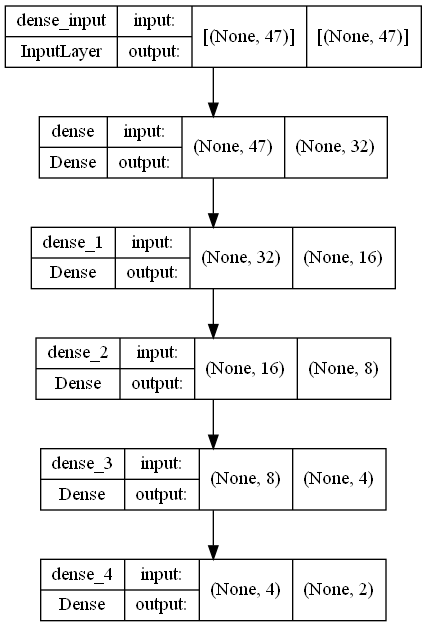

In [34]:
plot_model(mlpOnly, show_shapes=True, show_layer_names=True)

In [35]:

mlpOnly.compile(
        # optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
        optimizer=tf.keras.optimizers.Adam(),
        # optimizer=tf.keras.optimizers.Adam(learning_rate = 1e-3, decay=1e-5),
        loss="binary_crossentropy",
        metrics=METRICS,
)

# CREATE CALLBACKS
checkpoint = tf.keras.callbacks.ModelCheckpoint(
						'MultilayerFusion/Data_ONLY/callbacks/MLP', 
						monitor='val_binary_accuracy', verbose=1, 
						save_best_only=True, mode='max')
# checkpoint = tf.keras.callbacks.ModelCheckpoint(
# 						'MultilayerFusion/callbacks/model_DS_callback_DS', 
# 						monitor='val_binary_accuracy', verbose=1, 
# 						save_best_only=True, mode='max')
callbacks_list = [checkpoint]

history = mlpOnly.fit(
        x = X_train.drop(['ImageFile'],axis='columns'),
        y = Y_train,
        epochs = 100,
        validation_data = [X_val.drop(['ImageFile'],axis='columns'),Y_val],
        callbacks = callbacks_list,    #some problems with DS layers and callbacks
)
# history = model.fit(
#         x = train_data_generator,
#         epochs = 200,
#         validation_data = valid_data_generator,
#         callbacks = callbacks_list,    #some problems with DS layers and callbacks
# )

Epoch 1/100
24/31 [======================>.......] - ETA: 0s - loss: 0.7078 - binary_accuracy: 0.5000 - precision: 0.5000 - recall: 0.9857 - True_Positives: 757.0000 - True_Negatives: 11.0000 - False_Positives: 757.0000 - False_Negatives: 11.0000     
Epoch 1: val_binary_accuracy improved from -inf to 0.49550, saving model to MultilayerFusion/Data_ONLY/callbacks\MLP
INFO:tensorflow:Assets written to: MultilayerFusion/Data_ONLY/callbacks\MLP\assets
31/31 [==============================] - 2s 23ms/step - loss: 0.7044 - binary_accuracy: 0.4990 - precision: 0.4995 - recall: 0.9516 - True_Positives: 944.0000 - True_Negatives: 46.0000 - False_Positives: 946.0000 - False_Negatives: 48.0000 - val_loss: 0.6924 - val_binary_accuracy: 0.4955 - val_precision: 0.4974 - val_recall: 0.8559 - val_True_Positives: 95.0000 - val_True_Negatives: 15.0000 - val_False_Positives: 96.0000 - val_False_Negatives: 16.0000
Epoch 2/100
26/31 [========================>.....] - ETA: 0s - loss: 0.6920 - binary_accurac

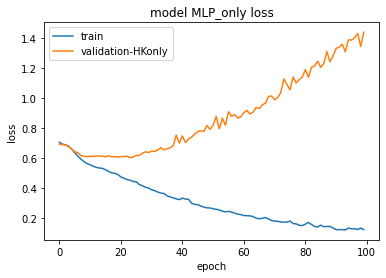

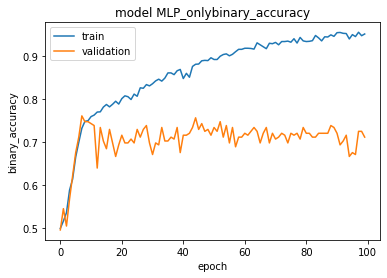

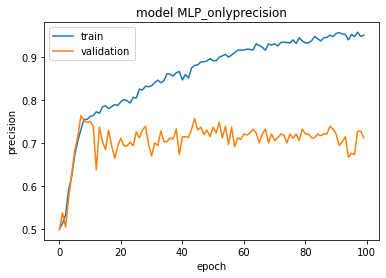

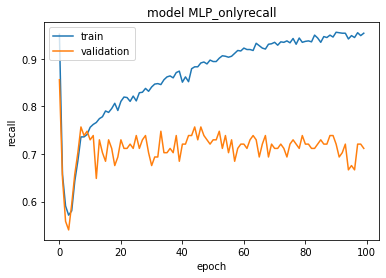

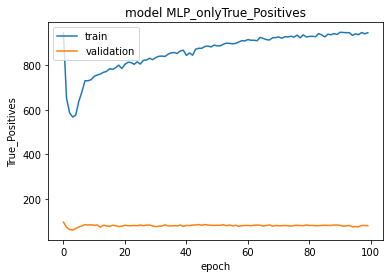

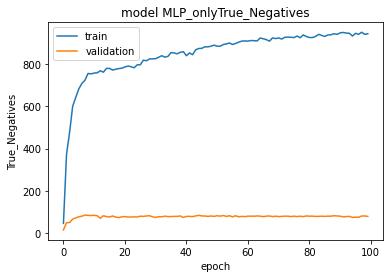

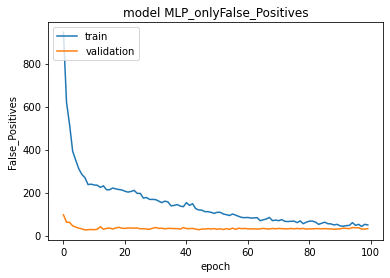

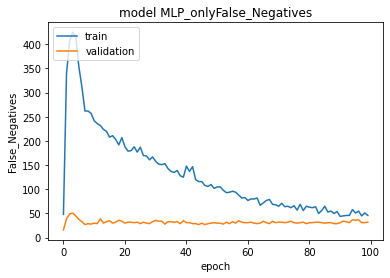

In [36]:
printAndSaveGraphs(graphPath,'MLP_only',history=history, Metrics=METRICS)
hist_df = pd.DataFrame(history.history)

# save to csv: 
hist_csv_file = graphPath / Path('MLP_only.csv')
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [37]:
bestPt = 'MultilayerFusion/Data_ONLY/callbacks/MLP'
model = tf.keras.models.load_model(bestPt)

evaluation = model.evaluate(x = X_val.drop(['ImageFile'],axis='columns'), y = Y_val)

prediction = model.predict(X_val.drop(['ImageFile'],axis='columns'))

ypreds = np.argmax(prediction, axis=1)
yground = np.argmax(Y_val.to_numpy(), axis=1)

score = accuracy_score(yground, ypreds)
print('accuracy: ', score)

loss = log_loss(yground, ypreds)
print('log_loss: ', loss)

precision = precision_score(yground, ypreds)
print('precision: ', precision)

recall = recall_score(yground, ypreds)
print('recall: ', recall)

cmatrix = confusion_matrix(yground, ypreds)
print(cmatrix)

evaluation = dict(zip(model.metrics_names,evaluation))
print(evaluation)
with open('Multilayer/OUPUT EVALUATIONS/MLP_90_10.txt', 'w') as f:
    f.write('MLP TR: 90 VAL: 10'+'\n\n')
    for k, v in evaluation.items():
        f.write(str(k) + ' >>> '+ str(v) + '\n\n')
    f.write('MLP TR: 90 VAL: 10'+'\n\n')
    f.write('SKLEARN METRICS:')
    f.write(str('Loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('Accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('Precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('Recall') + ' >>> '+ str(recall) + '\n\n')
    f.write(str('Confusion Matrix') + ' >>> '+ str(cmatrix) + '\n\n')

4/4 [==============================] - 0s 3ms/step - loss: 0.6166 - binary_accuracy: 0.7613 - precision: 0.7636 - recall: 0.7568 - True_Positives: 84.0000 - True_Negatives: 85.0000 - False_Positives: 26.0000 - False_Negatives: 27.0000
accuracy:  0.7567567567567568
log_loss:  8.40143204165803
precision:  0.75
recall:  0.7894736842105263
[[39 15]
 [12 45]]
{'loss': 0.6165801882743835, 'binary_accuracy': 0.7612612843513489, 'precision': 0.7636363506317139, 'recall': 0.7567567825317383, 'True_Positives': 84.0, 'True_Negatives': 85.0, 'False_Positives': 26.0, 'False_Negatives': 27.0}


In [38]:
mlpOnly = create_mlp_winner_hack(X_train.drop('ImageFile', axis='columns').shape[1], regression=True)

In [39]:
mlpOnly.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 64)                3072      
                                                                 
 dense_6 (Dense)             (None, 64)                4160      
                                                                 
 dense_7 (Dense)             (None, 32)                2080      
                                                                 
 dense_8 (Dense)             (None, 2)                 66        
                                                                 
Total params: 9,378
Trainable params: 9,378
Non-trainable params: 0
_________________________________________________________________


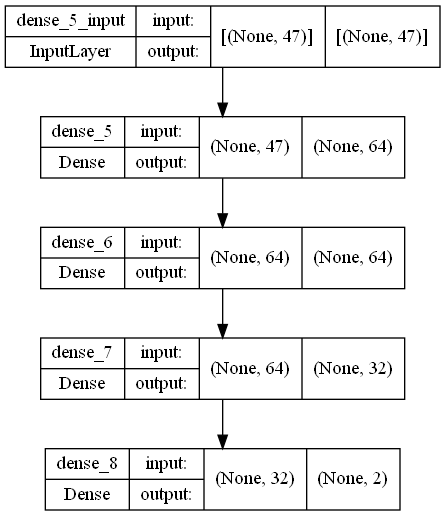

In [40]:
plot_model(mlpOnly, show_shapes=True, show_layer_names=True)

In [41]:

mlpOnly.compile(
        # optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
        optimizer=tf.keras.optimizers.Adam(),
        # optimizer=tf.keras.optimizers.Adam(learning_rate = 1e-3, decay=1e-5),
        loss="binary_crossentropy",
        metrics=METRICS,
)

# CREATE CALLBACKS
checkpoint = tf.keras.callbacks.ModelCheckpoint(
						'MultilayerFusion/Data_ONLY/callbacks/MLP_hack', 
						monitor='val_binary_accuracy', verbose=1, 
						save_best_only=True, mode='max')
# checkpoint = tf.keras.callbacks.ModelCheckpoint(
# 						'MultilayerFusion/callbacks/model_DS_callback_DS', 
# 						monitor='val_binary_accuracy', verbose=1, 
# 						save_best_only=True, mode='max')
callbacks_list = [checkpoint]

history = mlpOnly.fit(
        x = X_train.drop(['ImageFile'],axis='columns'),
        y = Y_train,
        epochs = 100,
        validation_data = [X_val.drop(['ImageFile'],axis='columns'),Y_val],
        callbacks = callbacks_list,    #some problems with DS layers and callbacks
)
# history = model.fit(
#         x = train_data_generator,
#         epochs = 200,
#         validation_data = valid_data_generator,
#         callbacks = callbacks_list,    #some problems with DS layers and callbacks
# )

Epoch 1/100
27/31 [=========================>....] - ETA: 0s - loss: 0.6853 - binary_accuracy: 0.6041 - precision: 0.5902 - recall: 0.6810 - True_Positives: 664.0000 - True_Negatives: 514.0000 - False_Positives: 461.0000 - False_Negatives: 311.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.69820, saving model to MultilayerFusion/Data_ONLY/callbacks\MLP_hack
INFO:tensorflow:Assets written to: MultilayerFusion/Data_ONLY/callbacks\MLP_hack\assets
31/31 [==============================] - 1s 21ms/step - loss: 0.6829 - binary_accuracy: 0.6056 - precision: 0.5939 - recall: 0.6682 - True_Positives: 737.0000 - True_Negatives: 599.0000 - False_Positives: 504.0000 - False_Negatives: 366.0000 - val_loss: 0.6616 - val_binary_accuracy: 0.6982 - val_precision: 0.7115 - val_recall: 0.6667 - val_True_Positives: 74.0000 - val_True_Negatives: 81.0000 - val_False_Positives: 30.0000 - val_False_Negatives: 37.0000
Epoch 2/100
17/31 [===============>..............] - ETA: 0s - loss: 0.6484 - binar

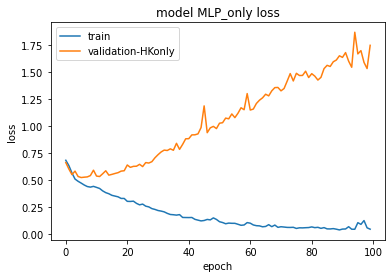

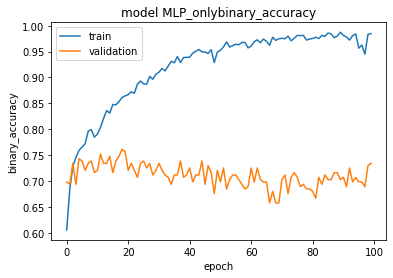

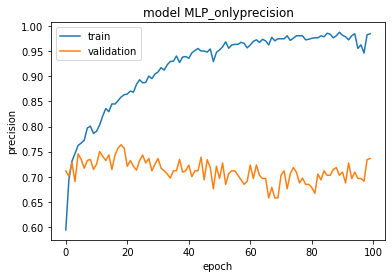

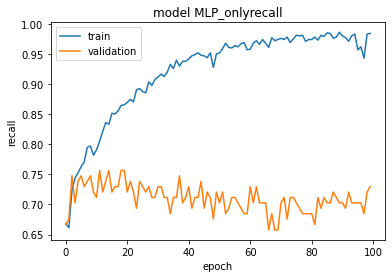

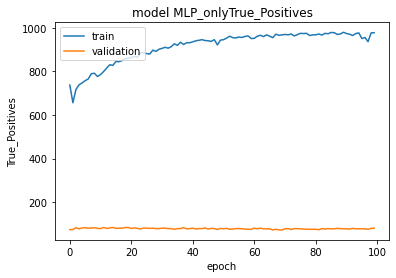

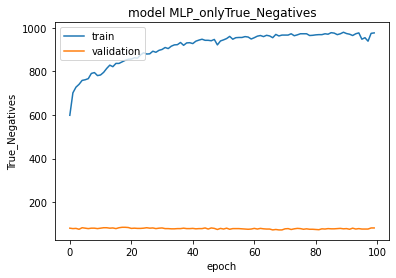

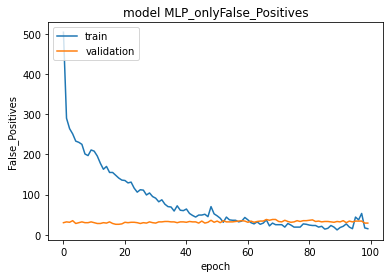

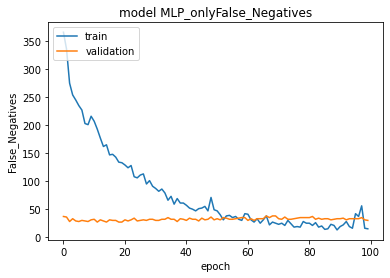

In [42]:
printAndSaveGraphs(graphPath,'MLP_only',history=history, Metrics=METRICS)
hist_df = pd.DataFrame(history.history)

# save to csv: 
hist_csv_file = graphPath / Path('MLP_only.csv')
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [43]:
bestPt = 'MultilayerFusion/Data_ONLY/callbacks/MLP_hack'
model = tf.keras.models.load_model(bestPt)

evaluation = model.evaluate(x = X_val.drop(['ImageFile'],axis='columns'), y = Y_val)

evaluation = dict(zip(model.metrics_names,evaluation))
print(evaluation)
with open('Multilayer/OUPUT EVALUATIONS/MLP_HACKATHON_90_10.txt', 'w') as f:
    f.write('MLP WINNER OF HACKATHON 2022 TR: 90 VAL: 10'+'\n\n')
    for k, v in evaluation.items():
        f.write(str(k) + ' >>> '+ str(v) + '\n\n')

4/4 [==============================] - 0s 3ms/step - loss: 0.5826 - binary_accuracy: 0.7613 - precision: 0.7636 - recall: 0.7568 - True_Positives: 84.0000 - True_Negatives: 85.0000 - False_Positives: 26.0000 - False_Negatives: 27.0000
{'loss': 0.5826295018196106, 'binary_accuracy': 0.7612612843513489, 'precision': 0.7636363506317139, 'recall': 0.7567567825317383, 'True_Positives': 84.0, 'True_Negatives': 85.0, 'False_Positives': 26.0, 'False_Negatives': 27.0}


# XGBOOST

In [44]:
from xgboost import XGBClassifier
import xgboost as xgb

In [45]:
X_full_XGBOOST = pd.DataFrame(COVID19_dataHK.drop(['Row_number','Prognosis','MILD','SEVERE','Death','Hospital'], axis='columns'))
Y_full_XGBOOST = pd.DataFrame(COVID19_dataHK[['Prognosis']])

In [46]:
#visit_concept: Emergency Room Visit = 0, Inpatient Visit = 1, Outpatient Visit = 2
prog = {'MILD': 0, 'SEVERE': 1}    #In newer version of the DB LIEVE is missing and there is only MILD
Y_full_XGBOOST = Y_full_XGBOOST.replace({'Prognosis': prog})

In [47]:
X_trainXG, X_valXG, Y_trainXG, Y_valXG = train_test_split(X_full_XGBOOST,Y_full_XGBOOST, test_size=0.1,shuffle=True, random_state=random_seed)


print("Training set shape X : "+str(X_trainXG.shape)+"   y : "+str(Y_trainXG.shape))
print("Validation set shape X : "+str(X_valXG.shape)+"   y : "+str(Y_valXG.shape))

Training set shape X : (992, 48)   y : (992, 1)
Validation set shape X : (111, 48)   y : (111, 1)


In [48]:
# search all feature that are numeric
nameColsNumber = list(X_trainXG.select_dtypes(exclude=['string','object','bool','datetime']).columns)

# Generates the mean of the column and change NAN values with the mean of the column
X_trainXG = meanOfCol(X_trainXG,nameColsNumber)
X_valXG = meanOfCol(X_valXG,nameColsNumber)
# X_test = meanOfCol(X_test,nameColsNumber)     # only if testet is needed

In [49]:
# if Image paths are still used there can not be a normalization so drop the path col and add it later
X_tr_dr_Im = X_trainXG['ImageFile']
X_vl_dr_Im = X_valXG['ImageFile']
# X_ts_dr_Im = X_test['ImageFile']   # only if testet is needed

X_trainXG = X_trainXG.drop('ImageFile', axis='columns')
X_valXG = X_valXG.drop('ImageFile', axis='columns')
# X_test = X_test.drop('ImageFile', axis='columns')   # only if testet is needed

In [50]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_trainXG = pd.DataFrame(scaler.fit_transform(X_trainXG), columns=X_trainXG.columns,index=X_trainXG.index)
X_valXG = pd.DataFrame(scaler.transform(X_valXG), columns=X_valXG.columns,index=X_valXG.index)
# X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns,index=X_test.index)    # only if testset is needed

In [51]:
X_trainXG['ImageFile'] = X_tr_dr_Im
X_valXG['ImageFile'] = X_vl_dr_Im
# X_test['ImageFile'] = X_ts_dr_Im   # only if testet is needed

[0]	validation_0-logloss:0.67869	validation_1-logloss:0.68200
[1]	validation_0-logloss:0.66241	validation_1-logloss:0.66293
[2]	validation_0-logloss:0.64958	validation_1-logloss:0.65472
[3]	validation_0-logloss:0.63849	validation_1-logloss:0.64806
[4]	validation_0-logloss:0.63004	validation_1-logloss:0.63910
[5]	validation_0-logloss:0.61945	validation_1-logloss:0.63065
[6]	validation_0-logloss:0.61146	validation_1-logloss:0.61946
[7]	validation_0-logloss:0.60191	validation_1-logloss:0.61497
[8]	validation_0-logloss:0.59329	validation_1-logloss:0.60872
[9]	validation_0-logloss:0.58587	validation_1-logloss:0.60595
[10]	validation_0-logloss:0.57992	validation_1-logloss:0.60394
[11]	validation_0-logloss:0.57397	validation_1-logloss:0.59841
[12]	validation_0-logloss:0.56754	validation_1-logloss:0.59506
[13]	validation_0-logloss:0.56327	validation_1-logloss:0.59235
[14]	validation_0-logloss:0.55895	validation_1-logloss:0.59038
[15]	validation_0-logloss:0.55530	validation_1-logloss:0.58586
[1

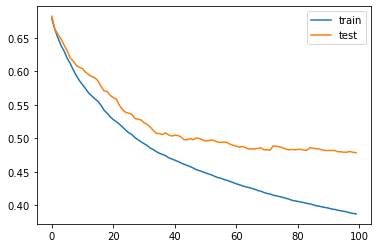

In [52]:
model = XGBClassifier(
    max_depth=2,
    learning_rate= 0.1,
    n_estimators=100,
    use_label_encoder=False,
    # silent=True,
    objective='binary:logistic',
    booster='gbtree',
    n_jobs=1,
    nthread=None,
    gamma=0,
    min_child_weight=1,
    max_delta_step=0,
    # subsample=1,
    # colsample_bytree=1,
    colsample_bylevel=1,
    reg_alpha=0,
    reg_lambda=1,
    scale_pos_weight=1,
    base_score=0.5,
    random_state=0,
    seed=None,
    missing=1,
    eta=0.05,
    subsample=0.7,
    colsample_bytree=0.5,
)

# define the datasets to evaluate each iteration
evalset = [(X_trainXG.drop('ImageFile', axis='columns'), Y_trainXG), (X_valXG.drop('ImageFile', axis='columns'),Y_valXG)]
# fit the model
model.fit(X_trainXG.drop('ImageFile', axis='columns'), Y_trainXG, eval_metric='logloss', eval_set=evalset)
# evaluate performance
yhat = model.predict(X_valXG.drop('ImageFile', axis='columns'))
score = accuracy_score(Y_valXG, yhat)
print('Accuracy: %.3f' % score)

score = accuracy_score(Y_valXG, yhat)
print('accuracy: ', score)

loss = log_loss(Y_valXG, yhat)
print('log_loss: ', loss)

precision = precision_score(Y_valXG, yhat)
print('precision: ', precision)

recall = recall_score(Y_valXG, yhat)
print('recall: ', recall)

confusion = confusion_matrix(Y_valXG, yhat)

with open('Multilayer/OUPUT EVALUATIONS/XGBOOST_90_10.txt', 'w') as f:
    f.write('XGBOOST DECISION TREE TR: 90 VAL: 10'+'\n\n')
    f.write(str('log_loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('recall') + ' >>> '+ str(recall) + '\n\n')
    f.write(str('confusion matrix') + ' >>> '+ str(confusion) + '\n\n')



# retrieve performance metrics
results = model.evals_result()
# plot learning curves
plt.plot(results['validation_0']['logloss'], label='train')
plt.plot(results['validation_1']['logloss'], label='test')
# show the legend
plt.legend()
# show the plot
plt.show()

## 10 fold val on XGBOOST

In [53]:
from sklearn.model_selection import KFold, StratifiedKFold

In [54]:
kf = KFold(n_splits = 10)
                         
skf = StratifiedKFold(n_splits = 10, random_state = 42, shuffle = True) 

In [55]:
VALIDATION_ACCURACY = []
VALIDATION_LOSS = []
VALIDATION_RECALL = []
VALIDATION_PRECISION = []

save_dir = 'MultilayerFusion/saved_models/XGB/'
fold_var = 1



for train_index, val_index in kf.split(X_full_XGBOOST,Y_full_XGBOOST):
# for train_index, val_index in kf.split(np.zeros(50),Y_full[:50]):

	training_data_X = X_full_XGBOOST.iloc[train_index]
	training_data_Y = Y_full_XGBOOST.iloc[train_index]
	validation_data_X = X_full_XGBOOST.iloc[val_index]
	validation_data_Y = Y_full_XGBOOST.iloc[val_index]

	# search all feature that are numeric
	nameColsNumber = list(training_data_X.select_dtypes(exclude=['string','object','bool','datetime']).columns)
	
	# Generates the mean of the column and change NAN values with the mean of the column
	training_data_X = meanOfCol(training_data_X,nameColsNumber)
	validation_data_X = meanOfCol(validation_data_X,nameColsNumber)


	# if Image paths are still used there can not be a normalization so drop the path col and add it later
	X_tr_dr_Im = training_data_X['ImageFile']
	X_vl_dr_Im = validation_data_X['ImageFile']
	
	training_data_X = training_data_X.drop('ImageFile', axis='columns')
	validation_data_X = validation_data_X.drop('ImageFile', axis='columns')

	scaler = MinMaxScaler()
	training_data_X = pd.DataFrame(scaler.fit_transform(training_data_X), columns=training_data_X.columns,index=training_data_X.index)
	validation_data_X = pd.DataFrame(scaler.transform(validation_data_X), columns=validation_data_X.columns,index=validation_data_X.index)

	training_data_X['ImageFile'] = X_tr_dr_Im
	validation_data_X['ImageFile'] = X_vl_dr_Im

	model = XGBClassifier(
    	max_depth=2,
    	learning_rate= 0.11,
    	n_estimators=200,
    	use_label_encoder=False,
    	# silent=True,
    	objective='binary:logistic',
    	booster='gbtree',
    	n_jobs=1,
    	nthread=None,
    	gamma=0,
    	min_child_weight=1,
    	max_delta_step=0,
    	# subsample=1,
    	# colsample_bytree=1,
    	colsample_bylevel=1,
    	reg_alpha=0,
    	reg_lambda=1,
    	scale_pos_weight=1,
    	base_score=0.5,
    	# random_state=0,
    	seed=None,
    	missing=1,
    	eta=0.05,
    	subsample=0.6,
    	colsample_bytree=0.5
	)

	# define the datasets to evaluate each iteration
	evalset = [(training_data_X.drop('ImageFile', axis='columns'), training_data_Y), (validation_data_X.drop('ImageFile', axis='columns'),validation_data_Y)]
	# fit the model
	model.fit(training_data_X.drop('ImageFile', axis='columns'), training_data_Y, eval_metric='logloss', eval_set=evalset, verbose=False)
	# evaluate performance
	yhat = model.predict(validation_data_X.drop('ImageFile', axis='columns'))
	score = accuracy_score(validation_data_Y, yhat)

	loss = log_loss(validation_data_Y, yhat)

	precision = precision_score(validation_data_Y, yhat)

	recall = recall_score(validation_data_Y, yhat)
	# print('Accuracy: %.3f' % score)
	# # retrieve performance metrics
	# results = model.evals_result()
	# # plot learning curves
	# plt.plot(results['validation_0']['logloss'], label='train')
	# plt.plot(results['validation_1']['logloss'], label='test')
	# # show the legend
	# plt.legend()
	# # show the plot
	# plt.show()
	
	VALIDATION_ACCURACY.append(score)
	VALIDATION_LOSS.append(loss)
	VALIDATION_RECALL.append(recall)
	VALIDATION_PRECISION.append(precision)
	
	tf.keras.backend.clear_session()

C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)
C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)
C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [56]:
print(np.mean(VALIDATION_ACCURACY))
print(np.mean(VALIDATION_LOSS))
print(np.mean(VALIDATION_RECALL))
print(np.mean(VALIDATION_PRECISION))

0.7733660933660934
7.82776364533041
0.811414509420975
0.7577797981109162


In [57]:
from statistics import mean

In [58]:
lines = ['MULTI LAYER FUSION WITH CONCATENATION','','Evaluation of the model in 10 fold cross validation: ','loss:',str(VALIDATION_LOSS),'accuracy:',str(VALIDATION_ACCURACY),'recall:',str(VALIDATION_RECALL),'precision:',str(VALIDATION_PRECISION),
        '','MEANS: ','loss:',str(mean(VALIDATION_LOSS)),'accuracy:',str(mean(VALIDATION_ACCURACY)),'recall:',str(mean(VALIDATION_RECALL)),'precision:',str(mean(VALIDATION_PRECISION))]
with open('XGBclassifierEVALUATION.txt', 'w') as f:
    for line in lines:
        f.write(line)
        f.write('\n')

## FIND RELEVANT

In [59]:
from xgboost import plot_importance
import statistics

43
['Positivity at admission', 'Cough', 'Therapy_anti-inflammatory ', 'CardiovascularDisease', 'HeartFailure', 'Ictus', 'HighBloodPressure', 'Cancer', 'Chronic Kidney disease', 'Obesity', 'Position', 'Hospital-D', 'Hospital-F']


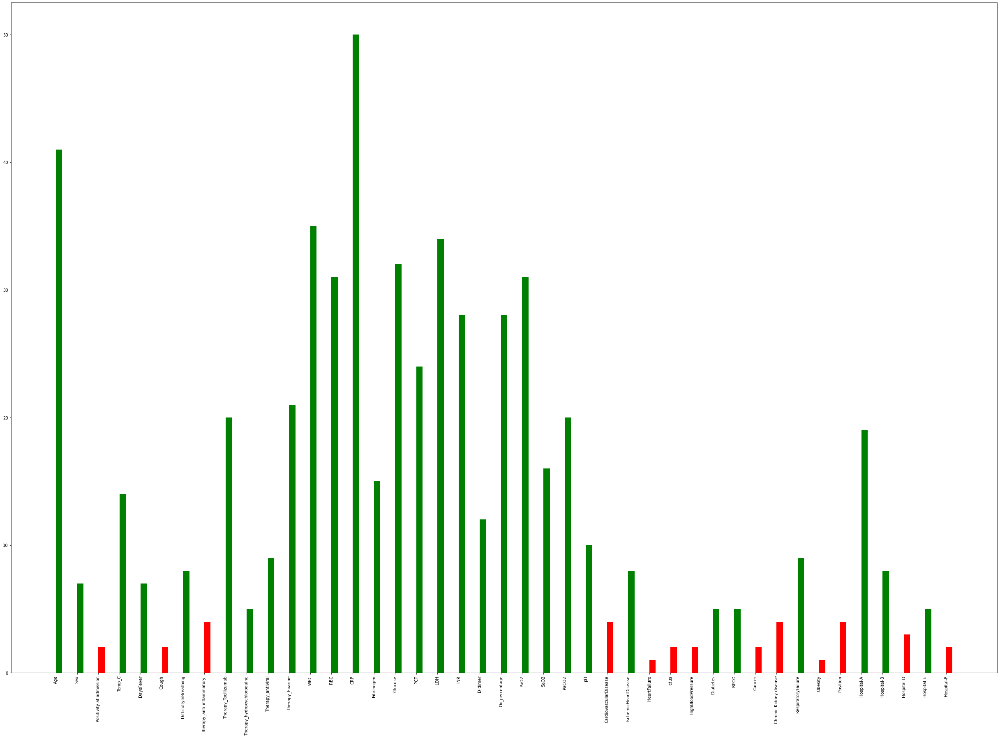

In [60]:
feature_important = model.get_booster().get_score(importance_type='weight')
key = feature_important.keys()
val = feature_important.values()
print(len(key))

median = statistics.harmonic_mean(val)

col = []
notRelevantValues = []


for v,k in zip(val,key):
    if v <median:
        col.append('red')
        notRelevantValues.append(k)
    else:
        col.append('green')

print(notRelevantValues)

plt.figure(figsize=(len(key), 30))
plt.xticks(rotation='vertical')
plt.bar(key,val,color=col, align='edge', width=0.3)
plt.show()


In [61]:
# #Drop hospital in notRelevantValues cause one of the hospital is relevant
# #THIS USES HOSPITAL AS FINAL VARIABLE
# notRelevantValues.pop()
# notRelevantValues.pop()
# notRelevantValues.pop()
# notRelevantValues.pop()
# notRelevantValues.pop()
# print(notRelevantValues)

In [62]:
#Drop hospital in notRelevantValues cause one of the hospital is relevant
#THIS DON'T USES HOSPITAL AS FINAL VARIABLE
# notRelevantValues.append('Hospital-A')
print(notRelevantValues)

['Positivity at admission', 'Cough', 'Therapy_anti-inflammatory ', 'CardiovascularDisease', 'HeartFailure', 'Ictus', 'HighBloodPressure', 'Cancer', 'Chronic Kidney disease', 'Obesity', 'Position', 'Hospital-D', 'Hospital-F']


In [63]:
# notRelevantValues.pop()

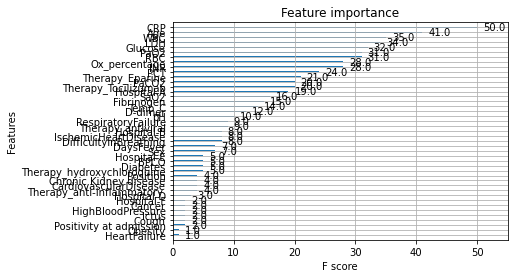

In [64]:
plot_importance(model)
plt.show()

## Delete col not relevant

In [65]:
X_trainDROPPED = X_trainXG.drop(notRelevantValues, axis='columns')
X_valDROPPED = X_valXG.drop(notRelevantValues, axis='columns')

[0]	validation_0-logloss:0.68394	validation_1-logloss:0.68319
[1]	validation_0-logloss:0.67656	validation_1-logloss:0.67670
[2]	validation_0-logloss:0.66971	validation_1-logloss:0.66948
[3]	validation_0-logloss:0.66314	validation_1-logloss:0.66223
[4]	validation_0-logloss:0.65652	validation_1-logloss:0.65754
[5]	validation_0-logloss:0.65044	validation_1-logloss:0.65332
[6]	validation_0-logloss:0.64366	validation_1-logloss:0.64623
[7]	validation_0-logloss:0.63790	validation_1-logloss:0.63994
[8]	validation_0-logloss:0.63269	validation_1-logloss:0.63458
[9]	validation_0-logloss:0.62769	validation_1-logloss:0.62789
[10]	validation_0-logloss:0.62193	validation_1-logloss:0.62198
[11]	validation_0-logloss:0.61739	validation_1-logloss:0.61598
[12]	validation_0-logloss:0.61358	validation_1-logloss:0.61423
[13]	validation_0-logloss:0.60833	validation_1-logloss:0.61116
[14]	validation_0-logloss:0.60482	validation_1-logloss:0.60759
[15]	validation_0-logloss:0.60035	validation_1-logloss:0.60223
[1

C:\Users\Michele\anaconda3\envs\tfGPU\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Michele\anaconda3\envs\tfGPU\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Michele\anaconda3\envs\tfGPU\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y

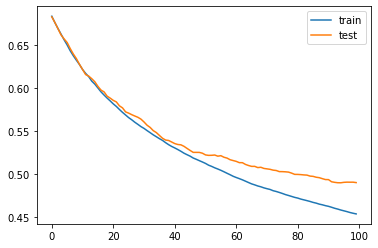

In [66]:
modelDropped = XGBClassifier(
    max_depth=2,
    learning_rate= 0.05,
    n_estimators=100,
    # silent=True,
    objective='binary:logistic',
    booster='gbtree',
    n_jobs=1,
    nthread=None,
    gamma=0,
    min_child_weight=1,
    max_delta_step=0,
    # subsample=1,
    # colsample_bytree=1,
    colsample_bylevel=1,
    reg_alpha=0,
    reg_lambda=1,
    scale_pos_weight=1,
    base_score=0.5,
    random_state=0,
    seed=None,
    missing=1,
    eta=0.5,
    subsample=0.9,
    colsample_bytree=0.5,
)

# define the datasets to evaluate each iteration
evalset = [(X_trainDROPPED.drop('ImageFile', axis='columns'), Y_trainXG), (X_valDROPPED.drop('ImageFile', axis='columns'),Y_valXG)]
# fit the model
modelDropped.fit(X_trainDROPPED.drop('ImageFile', axis='columns'), Y_trainXG, eval_metric='logloss', eval_set=evalset)
# evaluate performance
yhat = modelDropped.predict(X_valDROPPED.drop('ImageFile', axis='columns'))
score = accuracy_score(Y_valXG, yhat)
print('Accuracy: %.3f' % score)
# retrieve performance metrics
results = modelDropped.evals_result()
# plot learning curves
plt.plot(results['validation_0']['logloss'], label='train')
plt.plot(results['validation_1']['logloss'], label='test')
# show the legend
plt.legend()
# show the plot
plt.show()

In [67]:
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.metrics import mean_absolute_error

preds = model.predict(X_valXG.drop('ImageFile', axis='columns'))

print("Precision = {}".format(precision_score(Y_valXG, preds, average='macro')))
print("Recall = {}".format(recall_score(Y_valXG, preds, average='macro')))
print("Accuracy = {}".format(accuracy_score(Y_valXG, preds)))


print(mean_absolute_error(Y_valXG, preds))

Precision = 0.9231402238314681
Recall = 0.9176413255360624
Accuracy = 0.918918918918919
0.08108108108108109


In [68]:

preds = model.predict(X_valXG.drop('ImageFile', axis='columns'))
score = accuracy_score(Y_valXG, yhat)
loss = log_loss(Y_valXG, yhat)
precision = precision_score(Y_valXG, yhat)
recall = recall_score(Y_valXG, yhat)

In [69]:
with open('Multilayer/OUPUT EVALUATIONS/NON POSSIBILI.txt', 'w') as f:
    f.write('XGBOOST DECISION TREE TR: 90 VAL: 10'+'\n\n')
    f.write(str('log_loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('recall') + ' >>> '+ str(recall) + '\n\n')

In [70]:
print(preds)

[1 1 1 0 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 0 1 1 0 0 1 1 0 0
 1 0 1 1 1 0 0 1 0 0 1 1 0 1 0 1 1 1 1 1 0 0 1 1 1 0 0 0 0 1 1 1 0 1 1 0 0
 1 0 0 1 0 0 1 1 1 1 0 1 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 1 0 1 0 0 1 1 1 0]


In [71]:
ypredsGT = Y_valXG['Prognosis'].values.tolist()

In [72]:
TF = preds == ypredsGT

In [73]:
TF

array([ True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True, False,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True])

In [74]:
print(sum(TF))

102


In [75]:
acc = sum(TF)/len(TF)

In [76]:
print(acc)

0.918918918918919


# SKLEARN

In [77]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

In [78]:
forest_model = DecisionTreeRegressor(random_state=42)
forest_model.fit(X_trainXG.drop('ImageFile', axis='columns'), Y_trainXG)
melb_preds = forest_model.predict(X_valXG.drop('ImageFile', axis='columns'))
print(mean_absolute_error(Y_valXG, melb_preds))

print("Precision = {}".format(precision_score(Y_valXG, melb_preds, average='macro')))
print("Recall = {}".format(recall_score(Y_valXG, melb_preds, average='macro')))
print("Accuracy = {}".format(accuracy_score(Y_valXG, melb_preds)))

0.34234234234234234
Precision = 0.6574074074074074
Recall = 0.6574074074074074
Accuracy = 0.6576576576576577


# CNN + CLINICAL DATA OUTPUTS

## IMPORT IMGS

In [88]:
def loadPNGtoArray(paths,basePath, outSize = IMAGE_SIZE, resize = True):
    imgs = []
    for p in tqdm(paths):
        p = Path(p).stem + '.png'
        fullPath = basePath / p
        if resize:
            img = load_img(fullPath,target_size=(outSize[0],outSize[1]))
        else:
            img = load_img(fullPath)
        imgs.append(img)
    imgs = np.array([np.array(fname) for fname in imgs])  #transform each element of list in numpy array    
    return imgs

In [79]:
databasePathIMAGES = Path('Img_Full_Size_From_DICOM_EQ')

In [81]:
X_trainIMG = loadPNGtoArray(X_train['ImageFile'],basePath=databasePathIMAGES)
X_valIMG = loadPNGtoArray(X_val['ImageFile'],basePath=databasePathIMAGES)

100%|██████████| 111/111 [00:05<00:00, 19.96it/s]


## DEMPSTER SHAFER

In [80]:
def changeModelLayers(model, addname):
    for layer in model.layers:
        layer._name = layer.name + str(addname)
    return model

In [81]:
prototypes = 3
num_class = 2

In [82]:
def DSmassCalcLayer(lin):

    # print(lin.shape[1])

    ED = ds_layer.DS1(prototypes,lin.shape[1])(lin)
    ED_ac = ds_layer.DS1_activate(prototypes)(ED)
    mass_prototypes = ds_layer.DS2(prototypes, num_class)(ED_ac)
    mass_omega = ds_layer.DS2_omega(prototypes, num_class)(mass_prototypes)
    # mass_Dempster = ds_layer.DS3_Dempster(prototypes, num_class)(mass_omega)
    lout = ds_layer.DS3_Dempster(prototypes, num_class)(mass_omega)
    # lout = ds_layer.DS3_normalize()(mass_Dempster)

    return lout




## BEST MLP LOADING

In [85]:
mlpPath = 'MultilayerFusion/Data_ONLY/callbacks/MLP'
mlp = tf.keras.models.load_model(mlpPath)
mlp = changeModelLayers(mlp,'mlp')
mlp.trainable = False
mlp.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densemlp (Dense)            (None, 32)                1536      
                                                                 
 dense_1mlp (Dense)          (None, 16)                528       
                                                                 
 dense_2mlp (Dense)          (None, 8)                 136       
                                                                 
 dense_3mlp (Dense)          (None, 4)                 36        
                                                                 
 dense_4mlp (Dense)          (None, 2)                 10        
                                                                 
Total params: 2,246
Trainable params: 0
Non-trainable params: 2,246
_________________________________________________________________


## CNN LOADING

In [86]:
# cnnPath = 'MultilayerFusion/OUTPUTS/MODELS-PB/multiLayer_fusion_DS_new_300ep'
# cnnPath = 'MultilayerFusion/callbacks/model_DS_callback_DS_not_gen'
# cnnPath = 'MultilayerFusion/callbacks/model_DS_callback_DS'

#feature fusion
cnnPath = 'MultilayerFusion/callbacks/model_DS_callback_DS_ON_DENSE'
#decision fusion
# cnnPath = 'MultilayerFusion/callbacks/model_DS_DECISION_FUSION'
cnn = tf.keras.models.load_model(cnnPath)
cnn = changeModelLayers(cnn,'cnn')
cnn.trainable = False
cnn.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3cnn (InputLayer)        [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2cnn (Rescaling)     (None, 224, 224, 3)  0           ['input_3cnn[0][0]']             
                                                                                                  
 conv2d_32cnn (Conv2D)          (None, 112, 112, 16  1216        ['rescaling_2cnn[0][0]']         
                                )                                                                 
                                                                                            

## MLP and CNN evaluation

In [87]:
# MLP
mlpEval = mlp.evaluate(x = X_val.drop('ImageFile', axis='columns'), y = Y_val)

4/4 [==============================] - 0s 6ms/step - loss: 0.6436 - binary_accuracy: 0.7568 - precision: 0.7568 - recall: 0.7568 - True_Positives: 84.0000 - True_Negatives: 84.0000 - False_Positives: 27.0000 - False_Negatives: 27.0000


In [88]:
mlpEval = dict(zip(mlp.metrics_names,mlpEval))
print(mlpEval)

{'loss': 0.6435835361480713, 'binary_accuracy': 0.7567567825317383, 'precision': 0.7567567825317383, 'recall': 0.7567567825317383, 'True_Positives': 84.0, 'True_Negatives': 84.0, 'False_Positives': 27.0, 'False_Negatives': 27.0}


In [89]:
#CNN
cnnEval = cnn.evaluate(x = X_valIMG, y = Y_val)

4/4 [==============================] - 4s 57ms/step - loss: 0.7006 - binary_accuracy: 0.7117 - precision: 0.7117 - recall: 0.7117 - True_Positives: 79.0000 - True_Negatives: 79.0000 - False_Positives: 32.0000 - False_Negatives: 32.0000


In [90]:
cnnEval = dict(zip(cnn.metrics_names,cnnEval))
print(cnnEval)

{'loss': 0.7005930542945862, 'binary_accuracy': 0.7117117047309875, 'precision': 0.7117117047309875, 'recall': 0.7117117047309875, 'True_Positives': 79.0, 'True_Negatives': 79.0, 'False_Positives': 32.0, 'False_Negatives': 32.0}


## CNN + OUTPUT MLP (DS)

In [256]:
def createModelMLPoutPCNNDS(cnn,mlp):

    inputFromCNN = cnn.output
    inputFromCLINICAL = mlp.output

    massCNN = DSmassCalcLayer(inputFromCNN)
    massCLINICAL = DSmassCalcLayer(inputFromCLINICAL)

    massFusion = Concatenate()([massCNN,massCLINICAL])
    # print(massFusion)

    newNprot = (num_class+1)*2
    mass_prototypes = ds_layer.DS2(newNprot, num_class)(massFusion)
    mass_omega = ds_layer.DS2_omega(newNprot, num_class)(mass_prototypes)
    mass_Dempster = ds_layer.DS3_Dempster(newNprot, num_class)(mass_omega)
    mass_Dempster_normalize = ds_layer.DS3_normalize()(mass_Dempster)
    outputs = utility_layer_train.DM_pignistic(num_class)(mass_Dempster_normalize)
    
    model = Model(inputs=[cnn.inputs,mlp.inputs], outputs=outputs)
    
    return model

In [257]:
fusedCNNMLPDS = createModelMLPoutPCNNDS(cnn,mlp)


In [258]:
fusedCNNMLPDS.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3cnn (InputLayer)        [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2cnn (Rescaling)     (None, 224, 224, 3)  0           ['input_3cnn[0][0]']             
                                                                                                  
 conv2d_32cnn (Conv2D)          (None, 112, 112, 16  1216        ['rescaling_2cnn[0][0]']         
                                )                                                                 
                                                                                              

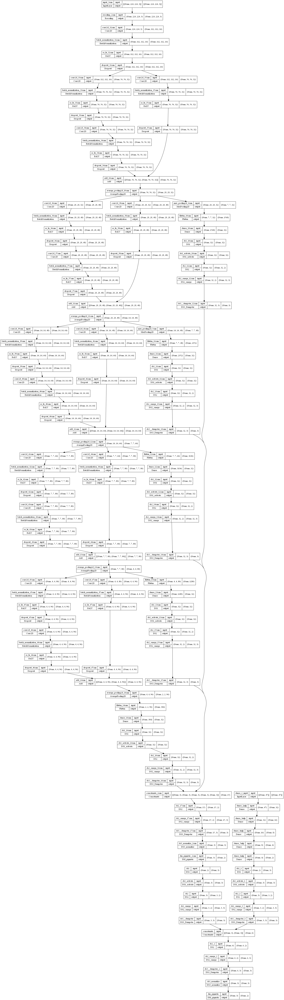

In [259]:
plot_model(fusedCNNMLPDS, show_shapes=True, show_layer_names=True)

### TEST-TRAIN

In [260]:
fusedCNNMLPDS.compile(
        optimizer=tf.keras.optimizers.Adam(),
        # optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
        loss="binary_crossentropy",
        metrics=METRICS,
)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
						'MultilayerFusion/MLP/mlp_cnn_DS', 
						monitor='val_binary_accuracy', verbose=1, 
						save_best_only=True, mode='max')
callbacks_list = [checkpoint]

history = fusedCNNMLPDS.fit(
        x = [X_trainIMG,X_train.drop('ImageFile', axis='columns')],
        y = Y_train,
        epochs = 200,
        validation_data = [[X_valIMG,X_val.drop('ImageFile', axis='columns')],Y_val],
        callbacks = callbacks_list,    #some problems with DS layers and callbacks
)

Epoch 1/200
30/31 [============================>.] - ETA: 0s - loss: 0.7860 - binary_accuracy: 0.5093 - precision: 0.5093 - recall: 0.5098 - True_Positives: 546.0000 - True_Negatives: 545.0000 - False_Positives: 526.0000 - False_Negatives: 525.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.48649, saving model to MultilayerFusion/MLP\mlp_cnn_DS
INFO:tensorflow:Assets written to: MultilayerFusion/MLP\mlp_cnn_DS\assets
31/31 [==============================] - 25s 356ms/step - loss: 0.7868 - binary_accuracy: 0.5045 - precision: 0.5045 - recall: 0.5050 - True_Positives: 557.0000 - True_Negatives: 556.0000 - False_Positives: 547.0000 - False_Negatives: 546.0000 - val_loss: 0.7841 - val_binary_accuracy: 0.4865 - val_precision: 0.4865 - val_recall: 0.4865 - val_True_Positives: 54.0000 - val_True_Negatives: 54.0000 - val_False_Positives: 57.0000 - val_False_Negatives: 57.0000
Epoch 2/200
31/31 [==============================] - ETA: 0s - loss: 0.7790 - binary_accuracy: 0.4990 - preci

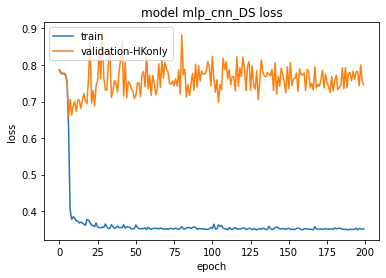

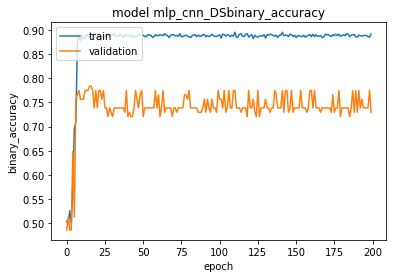

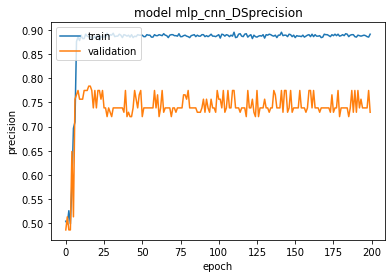

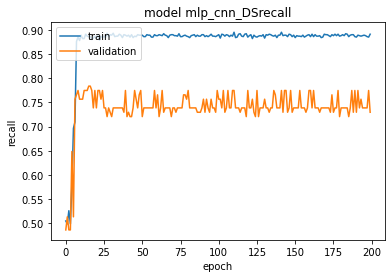

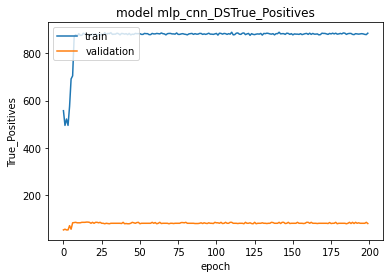

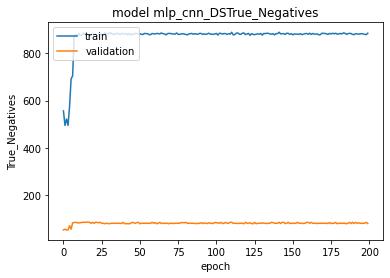

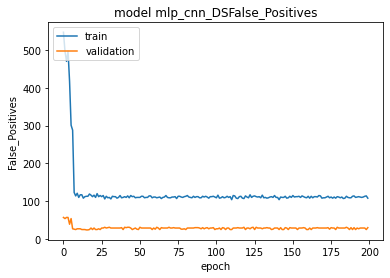

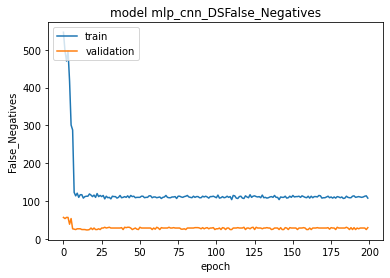

In [261]:
printAndSaveGraphs(graphPath,'mlp_cnn_DS',history=history, Metrics=METRICS)
hist_df = pd.DataFrame(history.history)
# or save to csv: 
hist_csv_file = graphPath / 'mlp_cnn_DS.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)
# model.save(pathSavedModel / 'mlp_cnn_DS')

In [93]:
bestPt = 'MultilayerFusion/MLP/mlp_cnn_DS'
model = tf.keras.models.load_model(bestPt)

prediction = model.predict([X_valIMG,X_val.drop('ImageFile', axis='columns')])

ypreds = np.argmax(prediction, axis=1)
yground = np.argmax(Y_val.to_numpy(), axis=1)

score = accuracy_score(yground, ypreds)
print('accuracy: ', score)

loss = log_loss(yground, ypreds)
print('log_loss: ', loss)

precision = precision_score(yground, ypreds)
print('precision: ', precision)

recall = recall_score(yground, ypreds)
print('recall: ', recall)

cmatrix = confusion_matrix(yground, ypreds)
print(cmatrix)


evaluation = model.evaluate(x = [X_valIMG,X_val.drop('ImageFile', axis='columns')], y = Y_val)

evaluation = dict(zip(model.metrics_names,evaluation))
print(evaluation)
with open('Multilayer/OUPUT EVALUATIONS/CNN_MLP_DS_FUSION_90_10.txt', 'w') as f:
    f.write('MLP AND CNN FUSION ON OUTPUT WITH DS TR: 90 VAL: 10'+'\n\n')
    for k, v in evaluation.items():
        f.write(str(k) + ' >>> '+ str(v) + '\n\n')
    f.write('MLP AND CNN FUSION ON OUTPUT WITH DS TR: 90 VAL: 10'+'\n\n')
    f.write('SKLEARN METRICS:')
    f.write(str('Loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('Accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('Precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('Recall') + ' >>> '+ str(recall) + '\n\n')
    f.write(str('Confusion Matrix') + ' >>> '+ str(cmatrix) + '\n\n')

accuracy:  0.7837837837837838
log_loss:  7.467922784230527
precision:  0.8
recall:  0.7719298245614035
[[43 11]
 [13 44]]
4/4 [==============================] - 2s 54ms/step - loss: 0.7032 - binary_accuracy: 0.7838 - precision: 0.7838 - recall: 0.7838 - True_Positives: 87.0000 - True_Negatives: 87.0000 - False_Positives: 24.0000 - False_Negatives: 24.0000
{'loss': 0.7031931281089783, 'binary_accuracy': 0.7837837934494019, 'precision': 0.7837837934494019, 'recall': 0.7837837934494019, 'True_Positives': 87.0, 'True_Negatives': 87.0, 'False_Positives': 24.0, 'False_Negatives': 24.0}


## CNN + OUTPUT MLP (CONCATENATE)

In [263]:
mlpPath = 'MultilayerFusion/Data_ONLY/callbacks/MLP'
mlp = tf.keras.models.load_model(mlpPath)
mlp = changeModelLayers(mlp,'mlp')
mlp.trainable = False

In [264]:
cnnPath = 'MultilayerFusion/callbacks/model_DS_callback_DS_ON_DENSE'
#decision fusion
# cnnPath = 'MultilayerFusion/callbacks/model_DS_DECISION_FUSION'
cnn = tf.keras.models.load_model(cnnPath)
cnn = changeModelLayers(cnn,'cnn')
cnn.trainable = False

In [96]:
def createModelMLPoutPCNNCONC(cnn,mlp):

    inputFromCNN = cnn.output
    inputFromCLINICAL = mlp.output

    # outputs = layers.Average()([inputFromCNN,inputFromCLINICAL])
    

    conc = Concatenate()([inputFromCNN,inputFromCLINICAL])
    # outputs = layers.Average()([inputFromCNN,inputFromCLINICAL])
    # outputs = Dense(16,activation='relu')(conc)
    # outputs = Dense(8,activation='relu')(outputs)
    # outputs = Dense(4,activation='relu')(outputs)
    outputs = Dense(2,activation='sigmoid')(conc)

    model = Model(inputs=[cnn.inputs,mlp.inputs], outputs=outputs)
    
    return model

In [266]:
fusedCNNMLPCONC = createModelMLPoutPCNNCONC(cnn,mlp)


In [267]:
fusedCNNMLPCONC.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3cnn (InputLayer)        [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2cnn (Rescaling)     (None, 224, 224, 3)  0           ['input_3cnn[0][0]']             
                                                                                                  
 conv2d_32cnn (Conv2D)          (None, 112, 112, 16  1216        ['rescaling_2cnn[0][0]']         
                                )                                                                 
                                                                                            

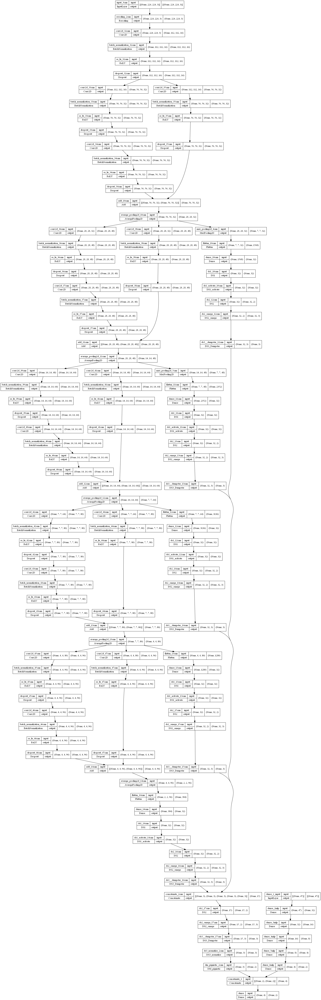

In [268]:
plot_model(fusedCNNMLPCONC, show_shapes=True, show_layer_names=True)

### TEST-TRAIN

In [269]:
fusedCNNMLPCONC.compile(
        optimizer=tf.keras.optimizers.Adam(),
        # optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
        loss="binary_crossentropy",
        metrics=METRICS,
)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
						'MultilayerFusion/MLP/mlp_cnn_CONCAT', 
						monitor='val_binary_accuracy', verbose=1, 
						save_best_only=True, mode='max')
callbacks_list = [checkpoint]

history = fusedCNNMLPCONC.fit(
        x = [X_trainIMG,X_train.drop('ImageFile', axis='columns')],
        y = Y_train,
        epochs = 200,
        validation_data = [[X_valIMG,X_val.drop('ImageFile', axis='columns')],Y_val],
        callbacks = callbacks_list,    #some problems with DS layers and callbacks
)

Epoch 1/200
29/31 [===========================>..] - ETA: 0s - loss: 0.7217 - binary_accuracy: 0.5380 - precision: 0.5302 - recall: 0.6679 - True_Positives: 694.0000 - True_Negatives: 424.0000 - False_Positives: 615.0000 - False_Negatives: 345.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.47748, saving model to MultilayerFusion/MLP\mlp_cnn_CONCAT
INFO:tensorflow:Assets written to: MultilayerFusion/MLP\mlp_cnn_CONCAT\assets
31/31 [==============================] - 21s 326ms/step - loss: 0.7219 - binary_accuracy: 0.5381 - precision: 0.5303 - recall: 0.6664 - True_Positives: 735.0000 - True_Negatives: 452.0000 - False_Positives: 651.0000 - False_Negatives: 368.0000 - val_loss: 0.7552 - val_binary_accuracy: 0.4775 - val_precision: 0.4818 - val_recall: 0.5946 - val_True_Positives: 66.0000 - val_True_Negatives: 40.0000 - val_False_Positives: 71.0000 - val_False_Negatives: 45.0000
Epoch 2/200
31/31 [==============================] - ETA: 0s - loss: 0.7126 - binary_accuracy: 0.5197

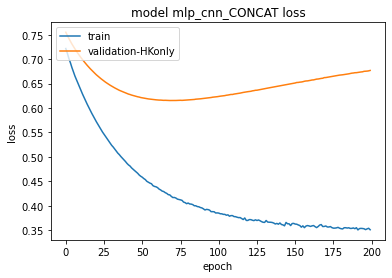

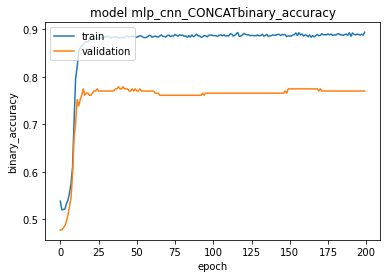

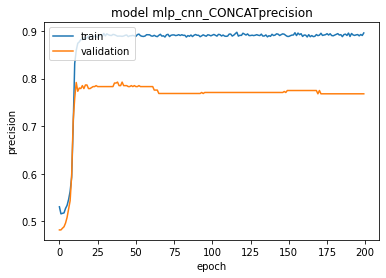

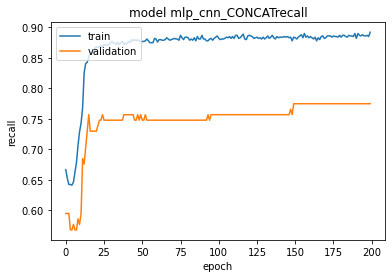

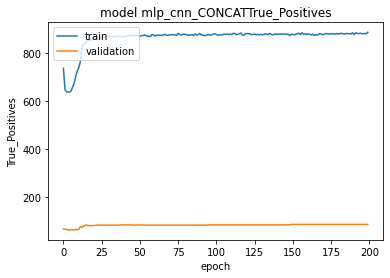

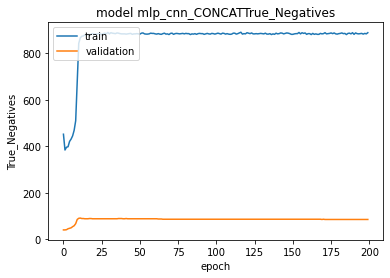

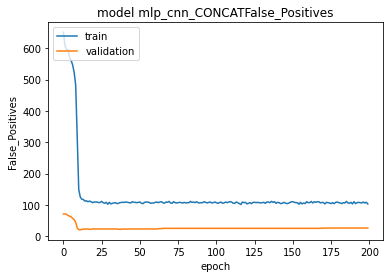

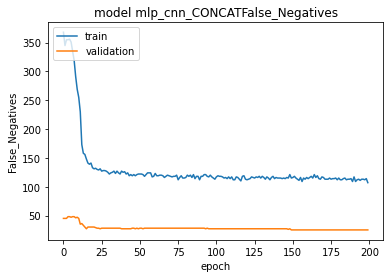

In [270]:
printAndSaveGraphs(graphPath,'mlp_cnn_CONCAT',history=history, Metrics=METRICS)
hist_df = pd.DataFrame(history.history)
# or save to csv: 
hist_csv_file = graphPath / 'mlp_cnn_CONCAT.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)
# model.save(pathSavedModel / 'mlp_cnn_CONCAT')

In [94]:
bestPt = 'MultilayerFusion/MLP/mlp_cnn_CONCAT'
model = tf.keras.models.load_model(bestPt)


evaluation = model.evaluate(x = [X_valIMG,X_val.drop('ImageFile', axis='columns')], y = Y_val)


prediction = model.predict([X_valIMG,X_val.drop('ImageFile', axis='columns')])

ypreds = np.argmax(prediction, axis=1)
yground = np.argmax(Y_val.to_numpy(), axis=1)

score = accuracy_score(yground, ypreds)
print('accuracy: ', score)

loss = log_loss(yground, ypreds)
print('log_loss: ', loss)

precision = precision_score(yground, ypreds)
print('precision: ', precision)

recall = recall_score(yground, ypreds)
print('recall: ', recall)

cmatrix = confusion_matrix(yground, ypreds)
print(cmatrix)


evaluation = dict(zip(model.metrics_names,evaluation))
print(evaluation)
with open('Multilayer/OUPUT EVALUATIONS/CNN_MLP_CONCATENATION_FUSION_90_10.txt', 'w') as f:
    f.write('MLP AND CNN FUSION ON OUTPUT WITH CONCATENATION AND DENSE TR: 90 VAL: 10'+'\n\n')
    for k, v in evaluation.items():
        f.write(str(k) + ' >>> '+ str(v) + '\n\n')
    f.write('MLP AND CNN FUSION ON OUTPUT WITH CONCATENATION AND DENSE TR: 90 VAL: 10'+'\n\n')
    f.write('SKLEARN METRICS:')
    f.write(str('Loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('Accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('Precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('Recall') + ' >>> '+ str(recall) + '\n\n')
    f.write(str('Confusion Matrix') + ' >>> '+ str(cmatrix) + '\n\n')

4/4 [==============================] - 2s 29ms/step - loss: 0.6323 - binary_accuracy: 0.7793 - precision: 0.7925 - recall: 0.7568 - True_Positives: 84.0000 - True_Negatives: 89.0000 - False_Positives: 22.0000 - False_Negatives: 27.0000
accuracy:  0.7837837837837838
log_loss:  7.467915580650076
precision:  0.8113207547169812
recall:  0.7543859649122807
[[44 10]
 [14 43]]
{'loss': 0.6322989463806152, 'binary_accuracy': 0.7792792916297913, 'precision': 0.7924528121948242, 'recall': 0.7567567825317383, 'True_Positives': 84.0, 'True_Negatives': 89.0, 'False_Positives': 22.0, 'False_Negatives': 27.0}


In [95]:
new = ypreds == yground

In [96]:
new

array([ True,  True,  True,  True,  True,  True,  True, False,  True,
        True,  True,  True,  True,  True, False,  True, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True, False, False,  True,  True,  True,  True,  True,
        True,  True, False, False,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True, False,  True,  True,  True,
       False, False,  True,  True, False,  True, False, False,  True,
        True, False,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True, False, False,  True,  True, False,  True,
       False,  True, False,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [98]:
n = new.sum()
print(n)

87


In [100]:
X_valIMG.shape[0]

111

In [99]:
acc = n/X_valIMG.shape[0]
print(acc)

0.7837837837837838


## CNN + MLP (MASS FUSION DS)

In [272]:
mlpPath = 'MultilayerFusion/Data_ONLY/callbacks/MLP'
mlp = tf.keras.models.load_model(mlpPath)
mlp = changeModelLayers(mlp,'mlp')
mlp.trainable = False


In [273]:
#feature fusion
cnnPath = 'MultilayerFusion/callbacks/model_DS_callback_DS_ON_DENSE'
#decision fusion
# cnnPath = 'MultilayerFusion/callbacks/model_DS_DECISION_FUSION'
cnn = tf.keras.models.load_model(cnnPath)
cnn = changeModelLayers(cnn,'cnn')
cnn.trainable = False

In [274]:
def createModelMLPoutPCNN_massfusion(cnn,mlp):

    inputFromCNN = cnn.layers[-6].output
    inputFromCLINICAL = mlp.layers[-1].output

    # massCNN = DSmassCalcLayer(inputFromCNN)
    massCLINICAL = DSmassCalcLayer(inputFromCLINICAL)

    # print(massCLINICAL.shape)
    # print(inputFromCNN.shape)

    massFusion = Concatenate()([inputFromCNN,massCLINICAL])
    # print(massFusion)

    newNprot = 18
    mass_prototypes = ds_layer.DS2(newNprot, num_class)(massFusion)
    mass_omega = ds_layer.DS2_omega(newNprot, num_class)(mass_prototypes)
    mass_Dempster = ds_layer.DS3_Dempster(newNprot, num_class)(mass_omega)
    mass_Dempster_normalize = ds_layer.DS3_normalize()(mass_Dempster)
    outputs = utility_layer_train.DM_pignistic(num_class)(mass_Dempster_normalize)
    
    model = Model(inputs=[cnn.inputs,mlp.inputs], outputs=outputs)
    
    return model

In [275]:
fusedMassCNNMLP = createModelMLPoutPCNN_massfusion(cnn,mlp)


In [276]:
fusedMassCNNMLP.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3cnn (InputLayer)        [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2cnn (Rescaling)     (None, 224, 224, 3)  0           ['input_3cnn[0][0]']             
                                                                                                  
 conv2d_32cnn (Conv2D)          (None, 112, 112, 16  1216        ['rescaling_2cnn[0][0]']         
                                )                                                                 
                                                                                            

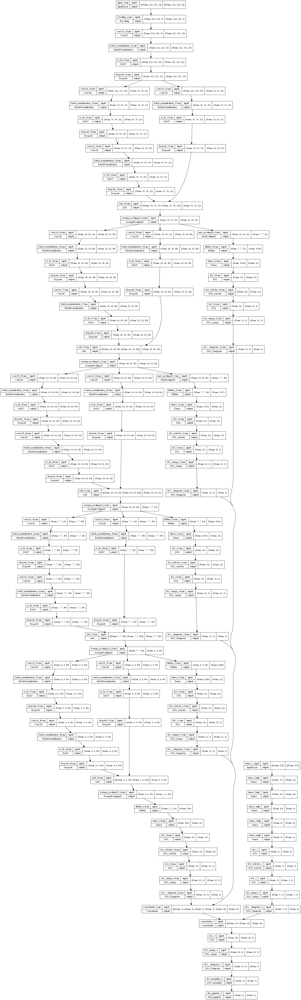

In [277]:
plot_model(fusedMassCNNMLP, show_shapes=True, show_layer_names=True)

### TEST-TRAIN

In [278]:
fusedMassCNNMLP.compile(
        optimizer=tf.keras.optimizers.Adam(),
        # optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
        loss="binary_crossentropy",
        metrics=METRICS,
)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
						'MultilayerFusion/MLP/mlp_cnn_mass_fusion_DS', 
						monitor='val_binary_accuracy', verbose=1, 
						save_best_only=True, mode='max')
callbacks_list = [checkpoint]

history = fusedMassCNNMLP.fit(
        x = [X_trainIMG,X_train.drop('ImageFile', axis='columns')],
        y = Y_train,
        epochs = 200,
        validation_data = [[X_valIMG,X_val.drop('ImageFile', axis='columns')],Y_val],
        callbacks = callbacks_list,    #some problems with DS layers and callbacks
)

Epoch 1/200
30/31 [============================>.] - ETA: 0s - loss: 0.7051 - binary_accuracy: 0.6849 - precision: 0.6847 - recall: 0.6853 - True_Positives: 734.0000 - True_Negatives: 733.0000 - False_Positives: 338.0000 - False_Negatives: 337.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.69369, saving model to MultilayerFusion/MLP\mlp_cnn_mass_fusion_DS
INFO:tensorflow:Assets written to: MultilayerFusion/MLP\mlp_cnn_mass_fusion_DS\assets
31/31 [==============================] - 23s 346ms/step - loss: 0.7068 - binary_accuracy: 0.6840 - precision: 0.6839 - recall: 0.6845 - True_Positives: 755.0000 - True_Negatives: 754.0000 - False_Positives: 349.0000 - False_Negatives: 348.0000 - val_loss: 0.6969 - val_binary_accuracy: 0.6937 - val_precision: 0.6937 - val_recall: 0.6937 - val_True_Positives: 77.0000 - val_True_Negatives: 77.0000 - val_False_Positives: 34.0000 - val_False_Negatives: 34.0000
Epoch 2/200
31/31 [==============================] - ETA: 0s - loss: 0.6785 - binary_

ResourceExhaustedError: Graph execution error:

2 root error(s) found.
  (0) RESOURCE_EXHAUSTED:  OOM when allocating tensor with shape[32,224,224,3] and type uint8 on /job:localhost/replica:0/task:0/device:CPU:0 by allocator cpu
	 [[{{node GatherV2}}]]
	 [[IteratorGetNext]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.

	 [[assert_greater_equal/Assert/AssertGuard/else/_96/assert_greater_equal/Assert/AssertGuard/Assert/data_0/_28]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.

  (1) RESOURCE_EXHAUSTED:  OOM when allocating tensor with shape[32,224,224,3] and type uint8 on /job:localhost/replica:0/task:0/device:CPU:0 by allocator cpu
	 [[{{node GatherV2}}]]
	 [[IteratorGetNext]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.

0 successful operations.
0 derived errors ignored. [Op:__inference_test_function_2428703]

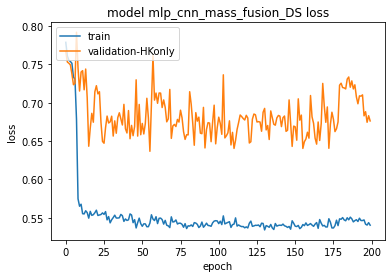

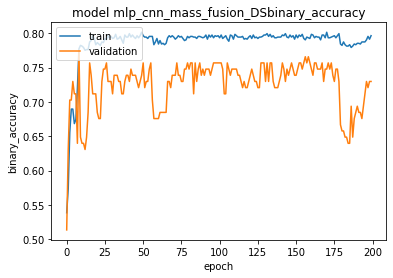

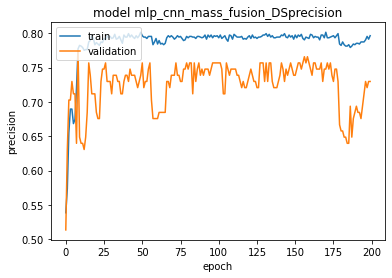

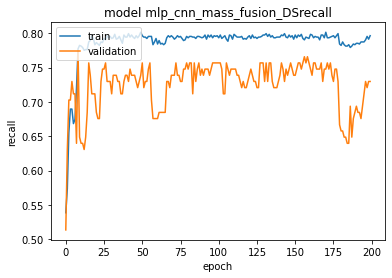

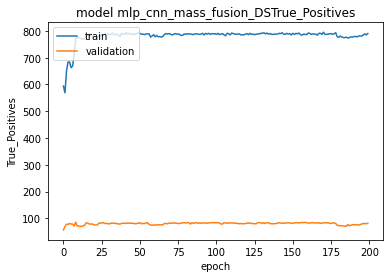

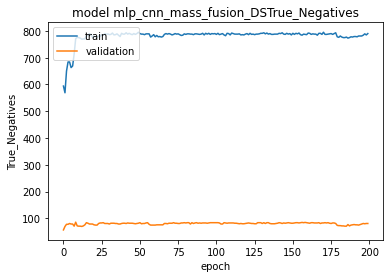

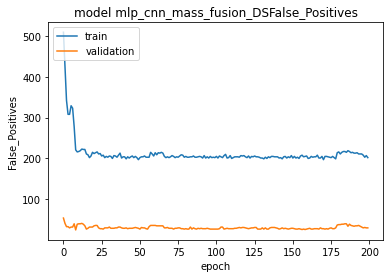

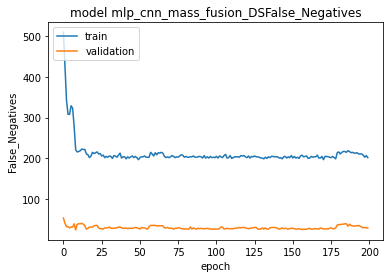

In [ ]:
printAndSaveGraphs(graphPath,'mlp_cnn_mass_fusion_DS',history=history, Metrics=METRICS)
hist_df = pd.DataFrame(history.history)
# or save to csv: 
hist_csv_file = graphPath / 'mlp_cnn_mass_fusion_DS.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)
# model.save(pathSavedModel / 'mlp_cnn_mass_fusion_DS')

In [101]:
bestPt = 'MultilayerFusion/MLP/mlp_cnn_mass_fusion_DS'
model = tf.keras.models.load_model(bestPt)


evaluation = model.evaluate(x = [X_valIMG,X_val.drop('ImageFile', axis='columns')], y = Y_val)


prediction = model.predict([X_valIMG,X_val.drop('ImageFile', axis='columns')])

ypreds = np.argmax(prediction, axis=1)
yground = np.argmax(Y_val.to_numpy(), axis=1)

score = accuracy_score(yground, ypreds)
print('accuracy: ', score)

loss = log_loss(yground, ypreds)
print('log_loss: ', loss)

precision = precision_score(yground, ypreds)
print('precision: ', precision)

recall = recall_score(yground, ypreds)
print('recall: ', recall)

cmatrix = confusion_matrix(yground, ypreds)
print(cmatrix)


evaluation = dict(zip(model.metrics_names,evaluation))
print(evaluation)
with open('Multilayer/OUPUT EVALUATIONS/CNN_MLP_FEATURE_FUSION_90_10.txt', 'w') as f:
    f.write('MLP AND CNN FUSION FEATURES: 90 VAL: 10'+'\n\n')
    for k, v in evaluation.items():
        f.write(str(k) + ' >>> '+ str(v) + '\n\n')
    f.write('MLP AND CNN FUSION FEATURES: 90 VAL: 10'+'\n\n')
    f.write('SKLEARN METRICS:')
    f.write(str('Loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('Accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('Precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('Recall') + ' >>> '+ str(recall) + '\n\n')
    f.write(str('Confusion Matrix') + ' >>> '+ str(cmatrix) + '\n\n')

4/4 [==============================] - 2s 51ms/step - loss: 0.8485 - binary_accuracy: 0.7568 - precision: 0.7568 - recall: 0.7568 - True_Positives: 84.0000 - True_Negatives: 84.0000 - False_Positives: 27.0000 - False_Negatives: 27.0000
accuracy:  0.7567567567567568
log_loss:  8.401374413014413
precision:  0.8409090909090909
recall:  0.6491228070175439
[[47  7]
 [20 37]]
{'loss': 0.8484964966773987, 'binary_accuracy': 0.7567567825317383, 'precision': 0.7567567825317383, 'recall': 0.7567567825317383, 'True_Positives': 84.0, 'True_Negatives': 84.0, 'False_Positives': 27.0, 'False_Negatives': 27.0}


## CNN + OUTPUT XGBOOST (DS)

In [102]:
#feature fusion
cnnPath = 'MultilayerFusion/callbacks/model_DS_callback_DS_ON_DENSE'
#decision fusion
# cnnPath = 'MultilayerFusion/callbacks/model_DS_DECISION_FUSION'
cnn = tf.keras.models.load_model(cnnPath)
cnn = changeModelLayers(cnn,'cnn')
cnn.trainable = False

In [103]:

# cnnPath = str(Path('Multilayer/KFoldVal/OLD_DS') / Path('DSmultilayerFusion'))  +'_'+ str(1)
# cnn = tf.keras.models.load_model(cnnPath)
# cnn = changeModelLayers(cnn,'cnn')
# cnn.trainable = False

In [104]:
cnn.evaluate(X_valIMG,Y_val)

4/4 [==============================] - 2s 52ms/step - loss: 0.7006 - binary_accuracy: 0.7117 - precision: 0.7117 - recall: 0.7117 - True_Positives: 79.0000 - True_Negatives: 79.0000 - False_Positives: 32.0000 - False_Negatives: 32.0000


[0.7005930542945862,
 0.7117117047309875,
 0.7117117047309875,
 0.7117117047309875,
 79.0,
 79.0,
 32.0,
 32.0]

In [83]:
def createModelDS(cnn,shapeOutFromCD = (2,)):

    inputFromCNN = cnn.output
    inputFromCLINICAL = Input(shape=shapeOutFromCD)

    massCNN = DSmassCalcLayer(inputFromCNN)
    massCLINICAL = DSmassCalcLayer(inputFromCLINICAL)

    massFusion = Concatenate()([massCNN,massCLINICAL])
    # print(massFusion)

    newNprot = (num_class+1)*2
    mass_prototypes = ds_layer.DS2(newNprot, num_class)(massFusion)
    mass_omega = ds_layer.DS2_omega(newNprot, num_class)(mass_prototypes)
    mass_Dempster = ds_layer.DS3_Dempster(newNprot, num_class)(mass_omega)
    mass_Dempster_normalize = ds_layer.DS3_normalize()(mass_Dempster)
    outputs = utility_layer_train.DM_pignistic(num_class)(mass_Dempster_normalize)
    
    model = Model(inputs=[cnn.inputs,inputFromCLINICAL], outputs=outputs)
    
    return model

In [106]:
fused = createModelDS(cnn)

In [107]:
fused.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3cnn (InputLayer)        [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2cnn (Rescaling)     (None, 224, 224, 3)  0           ['input_3cnn[0][0]']             
                                                                                                  
 conv2d_32cnn (Conv2D)          (None, 112, 112, 16  1216        ['rescaling_2cnn[0][0]']         
                                )                                                                 
                                                                                              

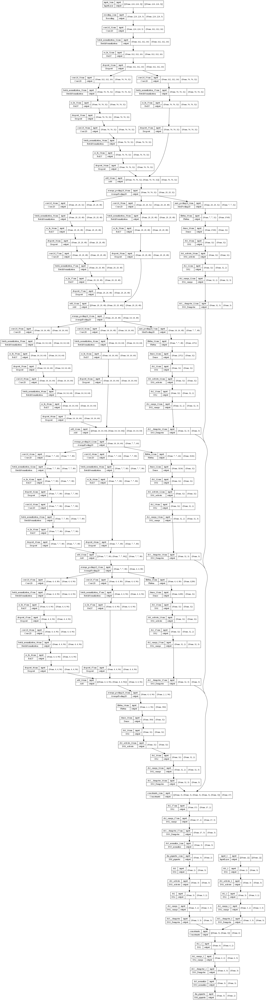

In [108]:
plot_model(fused, show_shapes=True, show_layer_names=True)

### TEST-TRAIN

#### XGB model

In [109]:
X_full_XGBOOST = pd.DataFrame(COVID19_dataHK.drop(['Row_number','Prognosis','MILD','SEVERE','Death','Hospital'], axis='columns'))
Y_full_XGBOOST = pd.DataFrame(COVID19_dataHK[['Prognosis']])

In [110]:
#visit_concept: Emergency Room Visit = 0, Inpatient Visit = 1, Outpatient Visit = 2
prog = {'MILD': 0, 'SEVERE': 1}    #In newer version of the DB LIEVE is missing and there is only MILD
Y_full_XGBOOST = Y_full_XGBOOST.replace({'Prognosis': prog})

In [111]:
X_trainXG, X_valXG, Y_trainXG, Y_valXG = train_test_split(X_full_XGBOOST,Y_full_XGBOOST, test_size=0.1,shuffle=True, random_state=random_seed)


print("Training set shape X : "+str(X_trainXG.shape)+"   y : "+str(Y_trainXG.shape))
print("Validation set shape X : "+str(X_valXG.shape)+"   y : "+str(Y_valXG.shape))

Training set shape X : (992, 48)   y : (992, 1)
Validation set shape X : (111, 48)   y : (111, 1)


In [112]:
# search all feature that are numeric
nameColsNumber = list(X_trainXG.select_dtypes(exclude=['string','object','bool','datetime']).columns)

# Generates the mean of the column and change NAN values with the mean of the column
X_trainXG = meanOfCol(X_trainXG,nameColsNumber)
X_valXG = meanOfCol(X_valXG,nameColsNumber)
# X_test = meanOfCol(X_test,nameColsNumber)     # only if testet is needed

In [113]:
# if Image paths are still used there can not be a normalization so drop the path col and add it later
X_tr_dr_Im = X_trainXG['ImageFile']
X_vl_dr_Im = X_valXG['ImageFile']
# X_ts_dr_Im = X_test['ImageFile']   # only if testet is needed

X_trainXG = X_trainXG.drop('ImageFile', axis='columns')
X_valXG = X_valXG.drop('ImageFile', axis='columns')
# X_test = X_test.drop('ImageFile', axis='columns')   # only if testet is needed

In [114]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_trainXG = pd.DataFrame(scaler.fit_transform(X_trainXG), columns=X_trainXG.columns,index=X_trainXG.index)
X_valXG = pd.DataFrame(scaler.transform(X_valXG), columns=X_valXG.columns,index=X_valXG.index)
# X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns,index=X_test.index)    # only if testset is needed

In [115]:
X_trainXG['ImageFile'] = X_tr_dr_Im
X_valXG['ImageFile'] = X_vl_dr_Im
# X_test['ImageFile'] = X_ts_dr_Im   # only if testet is needed

[0]	validation_0-logloss:0.67869	validation_1-logloss:0.68200
[1]	validation_0-logloss:0.66241	validation_1-logloss:0.66293
[2]	validation_0-logloss:0.64958	validation_1-logloss:0.65472
[3]	validation_0-logloss:0.63849	validation_1-logloss:0.64806
[4]	validation_0-logloss:0.63004	validation_1-logloss:0.63910
[5]	validation_0-logloss:0.61945	validation_1-logloss:0.63065
[6]	validation_0-logloss:0.61146	validation_1-logloss:0.61946
[7]	validation_0-logloss:0.60191	validation_1-logloss:0.61497
[8]	validation_0-logloss:0.59329	validation_1-logloss:0.60872
[9]	validation_0-logloss:0.58587	validation_1-logloss:0.60595
[10]	validation_0-logloss:0.57992	validation_1-logloss:0.60394
[11]	validation_0-logloss:0.57397	validation_1-logloss:0.59841
[12]	validation_0-logloss:0.56754	validation_1-logloss:0.59506
[13]	validation_0-logloss:0.56327	validation_1-logloss:0.59235
[14]	validation_0-logloss:0.55895	validation_1-logloss:0.59038
[15]	validation_0-logloss:0.55530	validation_1-logloss:0.58586
[1

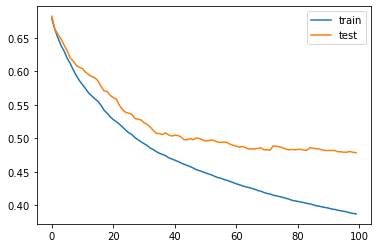

In [116]:
model = XGBClassifier(
    max_depth=2,
    learning_rate= 0.1,
    n_estimators=100,
    use_label_encoder=False,
    # silent=True,
    objective='binary:logistic',
    booster='gbtree',
    n_jobs=1,
    nthread=None,
    gamma=0,
    min_child_weight=1,
    max_delta_step=0,
    # subsample=1,
    # colsample_bytree=1,
    colsample_bylevel=1,
    reg_alpha=0,
    reg_lambda=1,
    scale_pos_weight=1,
    base_score=0.5,
    random_state=0,
    seed=None,
    missing=1,
    eta=0.05,
    subsample=0.7,
    colsample_bytree=0.5,
)

# define the datasets to evaluate each iteration
evalset = [(X_trainXG.drop('ImageFile', axis='columns'), Y_trainXG), (X_valXG.drop('ImageFile', axis='columns'),Y_valXG)]
# fit the model
model.fit(X_trainXG.drop('ImageFile', axis='columns'), Y_trainXG, eval_metric='logloss', eval_set=evalset)
# evaluate performance
yhat = model.predict(X_valXG.drop('ImageFile', axis='columns'))
score = accuracy_score(Y_valXG, yhat)
print('Accuracy: %.3f' % score)

score = accuracy_score(Y_valXG, yhat)
print('accuracy: ', score)

loss = log_loss(Y_valXG, yhat)
print('log_loss: ', loss)

precision = precision_score(Y_valXG, yhat)
print('precision: ', precision)

recall = recall_score(Y_valXG, yhat)
print('recall: ', recall)

with open('Multilayer/OUPUT EVALUATIONS/XGBOOST_90_10.txt', 'w') as f:
    f.write('XGBOOST DECISION TREE TR: 90 VAL: 10'+'\n\n')
    f.write(str('log_loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('recall') + ' >>> '+ str(recall) + '\n\n')



# retrieve performance metrics
results = model.evals_result()
# plot learning curves
plt.plot(results['validation_0']['logloss'], label='train')
plt.plot(results['validation_1']['logloss'], label='test')
# show the legend
plt.legend()
# show the plot
plt.show()

In [117]:
# input from XGBOOST:           1 = SEVERE      0 = MILD
# X_trainCD_XGBOOSTtemp = model.predict_proba(X_trainXG.drop('ImageFile', axis='columns'))
# X_valCD_XGBOOSTtemp = model.predict_proba(X_valXG.drop('ImageFile', axis='columns'))
X_trainCD_XGBOOST = model.predict_proba(X_trainXG.drop('ImageFile', axis='columns'))
X_valCD_XGBOOST = model.predict_proba(X_valXG.drop('ImageFile', axis='columns'))

In [118]:
X_valCD_XGBOOST

array([[0.15315694, 0.84684306],
       [0.12694138, 0.8730586 ],
       [0.06130707, 0.9386929 ],
       [0.5340525 , 0.46594754],
       [0.9320367 , 0.06796332],
       [0.70228696, 0.29771304],
       [0.60896504, 0.39103496],
       [0.58860266, 0.41139737],
       [0.879549  , 0.12045098],
       [0.10567075, 0.89432925],
       [0.43559897, 0.56440103],
       [0.27908742, 0.7209126 ],
       [0.02180213, 0.9781979 ],
       [0.30794048, 0.6920595 ],
       [0.63765097, 0.36234903],
       [0.21993136, 0.78006864],
       [0.79249007, 0.20750995],
       [0.05256438, 0.9474356 ],
       [0.20422989, 0.7957701 ],
       [0.9594831 , 0.04051692],
       [0.314905  , 0.685095  ],
       [0.39622504, 0.60377496],
       [0.84819365, 0.15180635],
       [0.23263139, 0.7673686 ],
       [0.8423418 , 0.15765823],
       [0.3446263 , 0.6553737 ],
       [0.71177197, 0.28822806],
       [0.5341212 , 0.46587878],
       [0.91989374, 0.08010627],
       [0.39132935, 0.60867065],
       [0.

In [119]:
Y_val

,MILD,SEVERE
309,0.0,1.0
1041,0.0,1.0
381,0.0,1.0
497,1.0,0.0
551,1.0,0.0
...,...,...
273,1.0,0.0
948,0.0,1.0
584,0.0,1.0
783,0.0,1.0


In [120]:
# X_trainCD_XGBOOST = np.ones((X_trainCD_XGBOOSTtemp.shape[0],2))
# X_valCD_XGBOOST = np.ones((X_valCD_XGBOOSTtemp.shape[0],2))

In [121]:
# X_valCD_XGBOOST

In [122]:
# X_trainCD_XGBOOST[:,0] = 1-X_trainCD_XGBOOSTtemp
# X_trainCD_XGBOOST[:,1] = X_trainCD_XGBOOSTtemp

# X_valCD_XGBOOST[:,0] = 1-X_valCD_XGBOOSTtemp
# X_valCD_XGBOOST[:,1] = X_valCD_XGBOOSTtemp

In [123]:
print(X_trainCD_XGBOOST.shape)
print(X_valCD_XGBOOST.shape)

(992, 2)
(111, 2)


In [124]:
fused.compile(
        optimizer=tf.keras.optimizers.Adam(),
        # optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
        loss="binary_crossentropy",
        metrics=METRICS,
)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
						'MultilayerFusion/XGBOOST/xgb_OUTPUP_FUSED', 
						monitor='val_binary_accuracy', verbose=1, 
						save_best_only=True, mode='max')
callbacks_list = [checkpoint]

history = fused.fit(
        x = [X_trainIMG,X_trainCD_XGBOOST],
        y = Y_train,
        epochs = 200,
        validation_data = [[X_valIMG,X_valCD_XGBOOST],Y_val],
        callbacks = callbacks_list,    #some problems with DS layers and callbacks
)

Epoch 1/200
30/31 [============================>.] - ETA: 0s - loss: 0.7822 - binary_accuracy: 0.4888 - precision: 0.4888 - recall: 0.4883 - True_Positives: 523.0000 - True_Negatives: 524.0000 - False_Positives: 547.0000 - False_Negatives: 548.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.51351, saving model to MultilayerFusion/XGBOOST\xgb_OUTPUP_FUSED
INFO:tensorflow:Assets written to: MultilayerFusion/XGBOOST\xgb_OUTPUP_FUSED\assets
31/31 [==============================] - 24s 349ms/step - loss: 0.7818 - binary_accuracy: 0.4909 - precision: 0.4909 - recall: 0.4905 - True_Positives: 541.0000 - True_Negatives: 542.0000 - False_Positives: 561.0000 - False_Negatives: 562.0000 - val_loss: 0.7764 - val_binary_accuracy: 0.5135 - val_precision: 0.5135 - val_recall: 0.5135 - val_True_Positives: 57.0000 - val_True_Negatives: 57.0000 - val_False_Positives: 54.0000 - val_False_Negatives: 54.0000
Epoch 2/200
30/31 [============================>.] - ETA: 0s - loss: 0.7779 - binary_accu

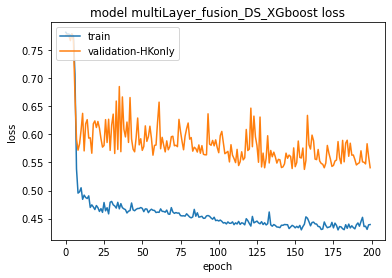

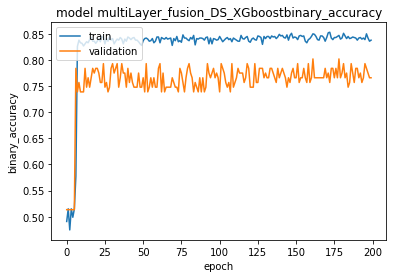

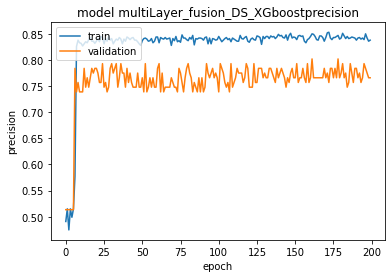

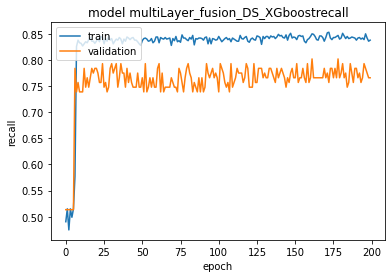

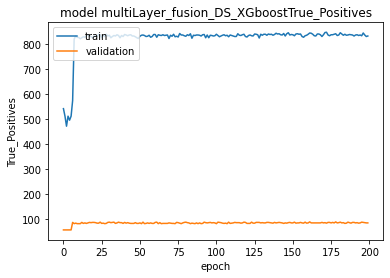

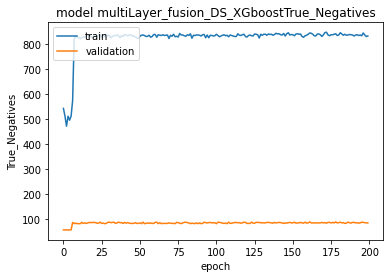

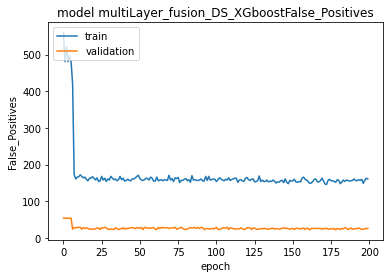

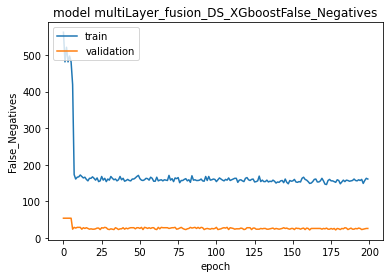

In [125]:
printAndSaveGraphs(graphPath,'multiLayer_fusion_DS_XGboost',history=history, Metrics=METRICS)
hist_df = pd.DataFrame(history.history)
# or save to csv: 
hist_csv_file = graphPath / 'multiLayer_fusion_DS_XGboost.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)
# model.save(pathSavedModel / 'multiLayer_fusion_DS_XGboost')

In [126]:
bestPt = 'MultilayerFusion/XGBOOST/xgb_OUTPUP_FUSED'
model = tf.keras.models.load_model(bestPt)


evaluation = model.evaluate(x = [X_valIMG,X_valCD_XGBOOST], y = Y_val)


prediction = model.predict([X_valIMG,X_valCD_XGBOOST])

ypreds = np.argmax(prediction, axis=1)
yground = np.argmax(Y_val.to_numpy(), axis=1)

score = accuracy_score(yground, ypreds)
print('accuracy: ', score)

loss = log_loss(yground, ypreds)
print('log_loss: ', loss)

precision = precision_score(yground, ypreds)
print('precision: ', precision)

recall = recall_score(yground, ypreds)
print('recall: ', recall)

cmatrix = confusion_matrix(yground, ypreds)
print(cmatrix)


evaluation = dict(zip(model.metrics_names,evaluation))
print(evaluation)
with open('Multilayer/OUPUT EVALUATIONS/CNN_XGBTREE_DS_FUSION_90_10.txt', 'w') as f:
    f.write('MLP AND XGB TREE FUSION ON OUTPUT WITH DS TR: 90 VAL: 10'+'\n\n')
    for k, v in evaluation.items():
        f.write(str(k) + ' >>> '+ str(v) + '\n\n')

    f.write('MLP AND XGB TREE FUSION ON OUTPUT WITH DS TR: 90 VAL: 10'+'\n\n')
    f.write('SKLEARN METRICS:')
    f.write(str('Loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('Accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('Precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('Recall') + ' >>> '+ str(recall) + '\n\n')
    f.write(str('Confusion Matrix') + ' >>> '+ str(cmatrix) + '\n\n')

4/4 [==============================] - 2s 68ms/step - loss: 0.5987 - binary_accuracy: 0.8018 - precision: 0.8018 - recall: 0.8018 - True_Positives: 89.0000 - True_Negatives: 89.0000 - False_Positives: 22.0000 - False_Negatives: 22.0000
accuracy:  0.8018018018018018
log_loss:  6.845566470924471
precision:  0.8723404255319149
recall:  0.7192982456140351
[[48  6]
 [16 41]]
{'loss': 0.5987009406089783, 'binary_accuracy': 0.8018018007278442, 'precision': 0.8018018007278442, 'recall': 0.8018018007278442, 'True_Positives': 89.0, 'True_Negatives': 89.0, 'False_Positives': 22.0, 'False_Negatives': 22.0}


## CNN + OUTPUT XGBOOST (CONCATENATE)

In [127]:
#feature fusion
cnnPath = 'MultilayerFusion/callbacks/model_DS_callback_DS_ON_DENSE'
#decision fusion
# cnnPath = 'MultilayerFusion/callbacks/model_DS_DECISION_FUSION'
cnn = tf.keras.models.load_model(cnnPath)
cnn = changeModelLayers(cnn,'cnn')
cnn.trainable = False

In [120]:
def createModelAverage(cnn,shapeOutFromCD = (2,)):

    inputFromCNN = cnn.output
    inputFromCLINICAL = Input(shape=shapeOutFromCD)


    conc = Concatenate()([inputFromCNN,inputFromCLINICAL])
    # outputs = layers.Average()([inputFromCNN,inputFromCLINICAL])
    # outputs = Dense(16,activation='relu')(conc)
    # outputs = Dense(8,activation='relu')(outputs)
    # outputs = Dense(4,activation='relu')(outputs)
    outputs = Dense(2,activation='sigmoid')(conc)
    

    model = Model(inputs=[cnn.inputs,inputFromCLINICAL], outputs=outputs)
    
    return model

In [129]:
fused = createModelAverage(cnn)

In [130]:
fused.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3cnn (InputLayer)        [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2cnn (Rescaling)     (None, 224, 224, 3)  0           ['input_3cnn[0][0]']             
                                                                                                  
 conv2d_32cnn (Conv2D)          (None, 112, 112, 16  1216        ['rescaling_2cnn[0][0]']         
                                )                                                                 
                                                                                            

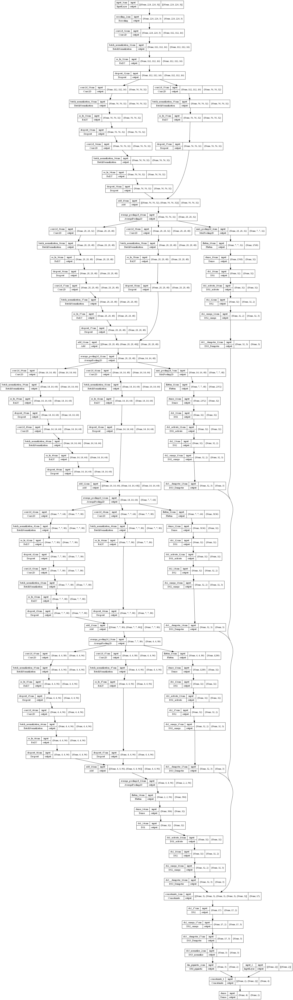

In [131]:
plot_model(fused, show_shapes=True, show_layer_names=True)

### TEST-TRAIN

#### XGB model

In [132]:
X_full_XGBOOST = pd.DataFrame(COVID19_dataHK.drop(['Row_number','Prognosis','MILD','SEVERE','Death','Hospital'], axis='columns'))
Y_full_XGBOOST = pd.DataFrame(COVID19_dataHK[['Prognosis']])

In [133]:
#visit_concept: Emergency Room Visit = 0, Inpatient Visit = 1, Outpatient Visit = 2
prog = {'MILD': 0, 'SEVERE': 1}    #In newer version of the DB LIEVE is missing and there is only MILD
Y_full_XGBOOST = Y_full_XGBOOST.replace({'Prognosis': prog})

In [134]:
X_trainXG, X_valXG, Y_trainXG, Y_valXG = train_test_split(X_full_XGBOOST,Y_full_XGBOOST, test_size=0.1,shuffle=True, random_state=random_seed)


print("Training set shape X : "+str(X_trainXG.shape)+"   y : "+str(Y_trainXG.shape))
print("Validation set shape X : "+str(X_valXG.shape)+"   y : "+str(Y_valXG.shape))

Training set shape X : (992, 48)   y : (992, 1)
Validation set shape X : (111, 48)   y : (111, 1)


In [135]:
# search all feature that are numeric
nameColsNumber = list(X_trainXG.select_dtypes(exclude=['string','object','bool','datetime']).columns)

# Generates the mean of the column and change NAN values with the mean of the column
X_trainXG = meanOfCol(X_trainXG,nameColsNumber)
X_valXG = meanOfCol(X_valXG,nameColsNumber)
# X_test = meanOfCol(X_test,nameColsNumber)     # only if testet is needed

In [136]:
# if Image paths are still used there can not be a normalization so drop the path col and add it later
X_tr_dr_Im = X_trainXG['ImageFile']
X_vl_dr_Im = X_valXG['ImageFile']
# X_ts_dr_Im = X_test['ImageFile']   # only if testet is needed

X_trainXG = X_trainXG.drop('ImageFile', axis='columns')
X_valXG = X_valXG.drop('ImageFile', axis='columns')
# X_test = X_test.drop('ImageFile', axis='columns')   # only if testet is needed

In [137]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_trainXG = pd.DataFrame(scaler.fit_transform(X_trainXG), columns=X_trainXG.columns,index=X_trainXG.index)
X_valXG = pd.DataFrame(scaler.transform(X_valXG), columns=X_valXG.columns,index=X_valXG.index)
# X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns,index=X_test.index)    # only if testset is needed

In [138]:
X_trainXG['ImageFile'] = X_tr_dr_Im
X_valXG['ImageFile'] = X_vl_dr_Im
# X_test['ImageFile'] = X_ts_dr_Im   # only if testet is needed

[0]	validation_0-logloss:0.67869	validation_1-logloss:0.68200
[1]	validation_0-logloss:0.66241	validation_1-logloss:0.66293
[2]	validation_0-logloss:0.64958	validation_1-logloss:0.65472
[3]	validation_0-logloss:0.63849	validation_1-logloss:0.64806
[4]	validation_0-logloss:0.63004	validation_1-logloss:0.63910
[5]	validation_0-logloss:0.61945	validation_1-logloss:0.63065
[6]	validation_0-logloss:0.61146	validation_1-logloss:0.61946
[7]	validation_0-logloss:0.60191	validation_1-logloss:0.61497
[8]	validation_0-logloss:0.59329	validation_1-logloss:0.60872
[9]	validation_0-logloss:0.58587	validation_1-logloss:0.60595
[10]	validation_0-logloss:0.57992	validation_1-logloss:0.60394
[11]	validation_0-logloss:0.57397	validation_1-logloss:0.59841
[12]	validation_0-logloss:0.56754	validation_1-logloss:0.59506
[13]	validation_0-logloss:0.56327	validation_1-logloss:0.59235
[14]	validation_0-logloss:0.55895	validation_1-logloss:0.59038
[15]	validation_0-logloss:0.55530	validation_1-logloss:0.58586
[1

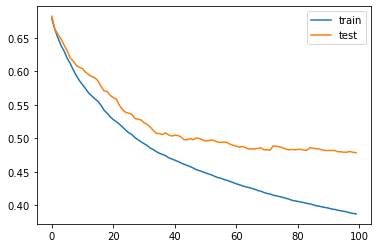

In [139]:
model = XGBClassifier(
    max_depth=2,
    learning_rate= 0.1,
    n_estimators=100,
    use_label_encoder=False,
    # silent=True,
    objective='binary:logistic',
    booster='gbtree',
    n_jobs=1,
    nthread=None,
    gamma=0,
    min_child_weight=1,
    max_delta_step=0,
    # subsample=1,
    # colsample_bytree=1,
    colsample_bylevel=1,
    reg_alpha=0,
    reg_lambda=1,
    scale_pos_weight=1,
    base_score=0.5,
    random_state=0,
    seed=None,
    missing=1,
    eta=0.05,
    subsample=0.7,
    colsample_bytree=0.5,
)

# define the datasets to evaluate each iteration
evalset = [(X_trainXG.drop('ImageFile', axis='columns'), Y_trainXG), (X_valXG.drop('ImageFile', axis='columns'),Y_valXG)]
# fit the model
model.fit(X_trainXG.drop('ImageFile', axis='columns'), Y_trainXG, eval_metric='logloss', eval_set=evalset)
# evaluate performance
yhat = model.predict(X_valXG.drop('ImageFile', axis='columns'))
score = accuracy_score(Y_valXG, yhat)
print('Accuracy: %.3f' % score)

score = accuracy_score(Y_valXG, yhat)
print('accuracy: ', score)

loss = log_loss(Y_valXG, yhat)
print('log_loss: ', loss)

precision = precision_score(Y_valXG, yhat)
print('precision: ', precision)

recall = recall_score(Y_valXG, yhat)
print('recall: ', recall)

with open('Multilayer/OUPUT EVALUATIONS/XGBOOST_90_10.txt', 'w') as f:
    f.write('XGBOOST DECISION TREE TR: 90 VAL: 10'+'\n\n')
    f.write(str('log_loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('recall') + ' >>> '+ str(recall) + '\n\n')



# retrieve performance metrics
results = model.evals_result()
# plot learning curves
plt.plot(results['validation_0']['logloss'], label='train')
plt.plot(results['validation_1']['logloss'], label='test')
# show the legend
plt.legend()
# show the plot
plt.show()

In [140]:
# input from XGBOOST:           1 = SEVERE      0 = MILD
# X_trainCD_XGBOOSTtemp = model.predict_proba(X_trainXG.drop('ImageFile', axis='columns'))
# X_valCD_XGBOOSTtemp = model.predict_proba(X_valXG.drop('ImageFile', axis='columns'))
X_trainCD_XGBOOST = model.predict_proba(X_trainXG.drop('ImageFile', axis='columns'))
X_valCD_XGBOOST = model.predict_proba(X_valXG.drop('ImageFile', axis='columns'))

In [141]:
X_valCD_XGBOOST

array([[0.15315694, 0.84684306],
       [0.12694138, 0.8730586 ],
       [0.06130707, 0.9386929 ],
       [0.5340525 , 0.46594754],
       [0.9320367 , 0.06796332],
       [0.70228696, 0.29771304],
       [0.60896504, 0.39103496],
       [0.58860266, 0.41139737],
       [0.879549  , 0.12045098],
       [0.10567075, 0.89432925],
       [0.43559897, 0.56440103],
       [0.27908742, 0.7209126 ],
       [0.02180213, 0.9781979 ],
       [0.30794048, 0.6920595 ],
       [0.63765097, 0.36234903],
       [0.21993136, 0.78006864],
       [0.79249007, 0.20750995],
       [0.05256438, 0.9474356 ],
       [0.20422989, 0.7957701 ],
       [0.9594831 , 0.04051692],
       [0.314905  , 0.685095  ],
       [0.39622504, 0.60377496],
       [0.84819365, 0.15180635],
       [0.23263139, 0.7673686 ],
       [0.8423418 , 0.15765823],
       [0.3446263 , 0.6553737 ],
       [0.71177197, 0.28822806],
       [0.5341212 , 0.46587878],
       [0.91989374, 0.08010627],
       [0.39132935, 0.60867065],
       [0.

In [142]:
# X_trainCD_XGBOOST = np.ones((X_trainCD_XGBOOSTtemp.shape[0],2))
# X_valCD_XGBOOST = np.ones((X_valCD_XGBOOSTtemp.shape[0],2))

In [143]:
# X_valCD_XGBOOST

In [144]:
# X_trainCD_XGBOOST[:,0] = 1-X_trainCD_XGBOOSTtemp
# X_trainCD_XGBOOST[:,1] = X_trainCD_XGBOOSTtemp

# X_valCD_XGBOOST[:,0] = 1-X_valCD_XGBOOSTtemp
# X_valCD_XGBOOST[:,1] = X_valCD_XGBOOSTtemp

In [145]:
print(X_trainCD_XGBOOST.shape)
print(X_valCD_XGBOOST.shape)

(992, 2)
(111, 2)


In [146]:
fused.compile(
        optimizer=tf.keras.optimizers.Adam(),
        # optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
        loss="binary_crossentropy",
        metrics=METRICS,
)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
						'MultilayerFusion/XGBOOST/xgb_OUTPUP_FUSED', 
						monitor='val_binary_accuracy', verbose=1, 
						save_best_only=True, mode='max')
callbacks_list = [checkpoint]

history = fused.fit(
        x = [X_trainIMG,X_trainCD_XGBOOST],
        y = Y_train,
        epochs = 200,
        validation_data = [[X_valIMG,X_valCD_XGBOOST],Y_val],
        callbacks = callbacks_list,    #some problems with DS layers and callbacks
)

# dopo 300 epoche 0.86425

Epoch 1/200
30/31 [============================>.] - ETA: 0s - loss: 0.9587 - binary_accuracy: 0.3782 - precision: 0.4069 - recall: 0.5322 - True_Positives: 570.0000 - True_Negatives: 240.0000 - False_Positives: 831.0000 - False_Negatives: 501.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.35135, saving model to MultilayerFusion/XGBOOST\xgb_OUTPUP_FUSED
INFO:tensorflow:Assets written to: MultilayerFusion/XGBOOST\xgb_OUTPUP_FUSED\assets
31/31 [==============================] - 21s 280ms/step - loss: 0.9557 - binary_accuracy: 0.3790 - precision: 0.4076 - recall: 0.5340 - True_Positives: 589.0000 - True_Negatives: 247.0000 - False_Positives: 856.0000 - False_Negatives: 514.0000 - val_loss: 0.9258 - val_binary_accuracy: 0.3514 - val_precision: 0.3922 - val_recall: 0.5405 - val_True_Positives: 60.0000 - val_True_Negatives: 18.0000 - val_False_Positives: 93.0000 - val_False_Negatives: 51.0000
Epoch 2/200
31/31 [==============================] - ETA: 0s - loss: 0.9383 - binary_accu

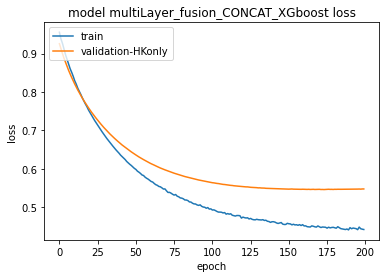

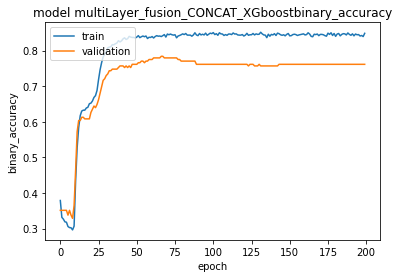

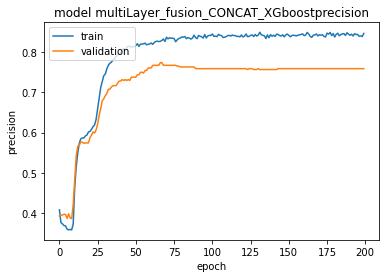

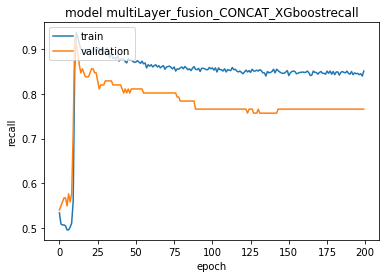

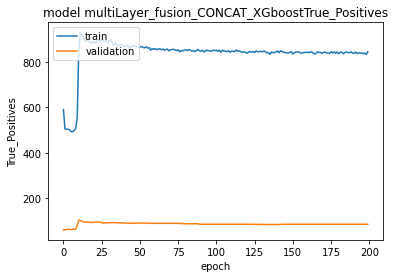

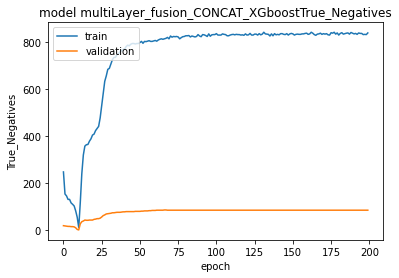

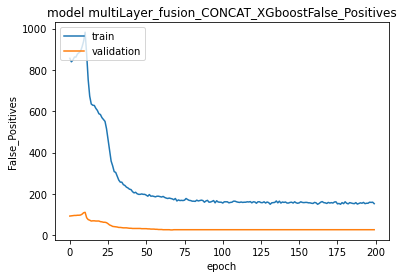

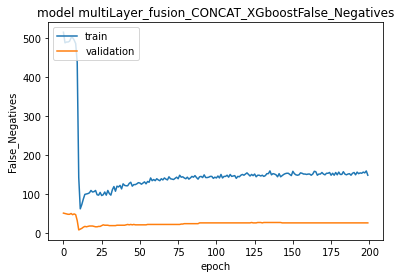

In [147]:
printAndSaveGraphs(graphPath,'multiLayer_fusion_CONCAT_XGboost',history=history, Metrics=METRICS)
hist_df = pd.DataFrame(history.history)
# or save to csv: 
hist_csv_file = graphPath / 'multiLayer_fusion_CONCAT_XGboost.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)
# model.save(pathSavedModel / 'multiLayer_fusion_CONCAT_XGboost')

In [148]:
bestPt = 'MultilayerFusion/XGBOOST/xgb_OUTPUP_FUSED'
model = tf.keras.models.load_model(bestPt)


evaluation = model.evaluate(x = [X_valIMG,X_valCD_XGBOOST], y = Y_val)


prediction = model.predict([X_valIMG,X_valCD_XGBOOST])

ypreds = np.argmax(prediction, axis=1)
yground = np.argmax(Y_val.to_numpy(), axis=1)

score = accuracy_score(yground, ypreds)
print('accuracy: ', score)

loss = log_loss(yground, ypreds)
print('log_loss: ', loss)

precision = precision_score(yground, ypreds)
print('precision: ', precision)

recall = recall_score(yground, ypreds)
print('recall: ', recall)

cmatrix = confusion_matrix(yground, ypreds)
print(cmatrix)


evaluation = dict(zip(model.metrics_names,evaluation))
print(evaluation)
with open('Multilayer/OUPUT EVALUATIONS/CNN_XGBTREE_CONCAT_FUSION_90_10.txt', 'w') as f:
    f.write('MLP AND XGB TREE FUSION ON OUTPUT WITH CONCATENATION AND DENSE TR: 90 VAL: 10'+'\n\n')
    for k, v in evaluation.items():
        f.write(str(k) + ' >>> '+ str(v) + '\n\n')

    f.write('MLP AND XGB TREE FUSION ON OUTPUT WITH CONCATENATION AND DENSE TR: 90 VAL: 10'+'\n\n')
    f.write('SKLEARN METRICS:')
    f.write(str('Loss') + ' >>> '+ str(loss) + '\n\n')
    f.write(str('Accuracy') + ' >>> '+ str(score) + '\n\n')
    f.write(str('Precision') + ' >>> '+ str(precision) + '\n\n')
    f.write(str('Recall') + ' >>> '+ str(recall) + '\n\n')
    f.write(str('Confusion Matrix') + ' >>> '+ str(cmatrix) + '\n\n')

4/4 [==============================] - 2s 56ms/step - loss: 0.6022 - binary_accuracy: 0.7838 - precision: 0.7739 - recall: 0.8018 - True_Positives: 89.0000 - True_Negatives: 85.0000 - False_Positives: 26.0000 - False_Negatives: 22.0000
accuracy:  0.7567567567567568
log_loss:  8.401403227336221
precision:  0.7884615384615384
recall:  0.7192982456140351
[[43 11]
 [16 41]]
{'loss': 0.6021724939346313, 'binary_accuracy': 0.7837837934494019, 'precision': 0.7739130258560181, 'recall': 0.8018018007278442, 'True_Positives': 89.0, 'True_Negatives': 85.0, 'False_Positives': 26.0, 'False_Negatives': 22.0}


## CROSS FOLD VALIDATION

10 fold validation

In [149]:
Y_full.sum()

MILD      535.0
SEVERE    568.0
dtype: float32

In [84]:
from sklearn.model_selection import KFold, StratifiedKFold

In [85]:
from statistics import mean

### fn
Function for cross n-Fold validation
input: (Model, Input feature DB, Labels DB, namel of the architecture for saving, path for saving, number of FOLD VALIDATION, epochs per validation, optimizer for the model)

In [121]:
def executeFoldValidationOnModelXGB(Y, X_XGB, Y_XGB, architectureName='kFoldVal', pathForKfold=Path('Multilayer/KFoldVal-MLP-CNN'), kfold=10, epochs=300, optim=tf.keras.optimizers.Adam()):
	# kf definition
	kf = KFold(n_splits=kfold, shuffle=True, random_state=42)

	VAL_ACCURACY = []
	VAL_RECALL = []
	VAL_PRECISION = []
	VAL_FP = []
	VAL_TP = []
	VAL_TN = []
	VAL_FN = []
	VAL_LOSS = []
	VAL_ACCURACY_SK = []
	VAL_RECALL_SK = []
	VAL_PRECISION_SK = []
	VAL_CM_SK = []
	VAL_LOSS_SK = []
	
	save_dir = pathForKfold
	fold_var = 1

	for train_index, val_index in kf.split(X_XGB,Y_XGB):
		training_data_X = X_XGB.iloc[train_index]
		training_data_Y = Y_XGB.iloc[train_index]
		validation_data_X = X_XGB.iloc[val_index]
		validation_data_Y = Y_XGB.iloc[val_index]

		y_train_OUT = Y.iloc[train_index]
		y_val_OUT = Y.iloc[val_index]
		
		print(y_val_OUT)
		print(validation_data_Y)
		
		# search all feature that are numeric
		nameColsNumber = list(training_data_X.select_dtypes(exclude=['string','object','bool','datetime']).columns)
		# Generates the mean of the column and change NAN values with the mean of the column
		training_data_X = meanOfCol(training_data_X,nameColsNumber)
		validation_data_X = meanOfCol(validation_data_X,nameColsNumber)
		# if Image paths are still used there can not be a normalization so drop the path col and add it later
		X_tr_dr_Im = training_data_X['ImageFile']
		X_vl_dr_Im = validation_data_X['ImageFile']
		training_data_X = training_data_X.drop('ImageFile', axis='columns')
		validation_data_X = validation_data_X.drop('ImageFile', axis='columns')
		scaler = MinMaxScaler()
		training_data_X = pd.DataFrame(scaler.fit_transform(training_data_X), columns=training_data_X.columns,index=training_data_X.index)
		validation_data_X = pd.DataFrame(scaler.transform(validation_data_X), columns=validation_data_X.columns,index=validation_data_X.index)
		training_data_X['ImageFile'] = X_tr_dr_Im
		validation_data_X['ImageFile'] = X_vl_dr_Im


		modelXGB = XGBClassifier(
	    	max_depth=2,
	    	learning_rate= 0.11,
	    	n_estimators=200,
	    	use_label_encoder=False,
	    	# silent=True,
	    	objective='binary:logistic',
	    	booster='gbtree',
	    	n_jobs=1,
	    	nthread=None,
	    	gamma=0,
	    	min_child_weight=1,
	    	max_delta_step=0,
	    	# subsample=1,
	    	# colsample_bytree=1,
	    	colsample_bylevel=1,
	    	reg_alpha=0,
	    	reg_lambda=1,
	    	scale_pos_weight=1,
	    	base_score=0.5,
	    	# random_state=0,
	    	seed=None,
	    	missing=1,
	    	eta=0.05,
	    	subsample=0.6,
	    	colsample_bytree=0.5
		)
		# define the datasets to evaluate each iteration
		evalset = [(training_data_X.drop('ImageFile', axis='columns'), training_data_Y), (validation_data_X.drop('ImageFile', axis='columns'),validation_data_Y)]
		# fit the model
		modelXGB.fit(training_data_X.drop('ImageFile', axis='columns'), training_data_Y, eval_metric='logloss', eval_set=evalset, verbose=False)
		# evaluate performance
		
		yhat = modelXGB.predict(validation_data_X.drop('ImageFile', axis='columns'))
		score = accuracy_score(validation_data_Y, yhat)
		print('Accuracy: %.3f' % score)
		
		
		XGB_pred_Train = modelXGB.predict_proba(training_data_X.drop('ImageFile', axis='columns'))
		XGB_pred_Val = modelXGB.predict_proba(validation_data_X.drop('ImageFile', axis='columns'))

		print(XGB_pred_Val)
		
		X_trainIMG = loadPNGtoArray(training_data_X['ImageFile'],basePath=databasePathIMAGES)
		X_valIMG = loadPNGtoArray(validation_data_X['ImageFile'],basePath=databasePathIMAGES)

		cnnPath = str(Path('Multilayer/KFoldVal') / Path('MultilayerFusionFeatureOnDense'))  +'_'+ str(fold_var)
		# cnnPath = str(Path('Multilayer/KFoldVal/OLD_DS') / Path('DSmultilayerFusion'))  +'_'+ str(fold_var)
		cnnModel = tf.keras.models.load_model(cnnPath)
		cnnModel = changeModelLayers(cnnModel,'cnn')
		cnnModel.trainable = False
		# cnn.summary()

		print(cnnModel.evaluate(X_valIMG,y_val_OUT))



		fused = createModelAverage(cnnModel)
		# fused = createModelDS(cnnModel)
		fused.compile(
	    		optimizer=optim,
	    		# optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
	    		loss="binary_crossentropy",
	    		metrics=METRICS,
				)
		checkpoint = tf.keras.callbacks.ModelCheckpoint(
								str(save_dir / architectureName)  +'_'+ str(fold_var), 
								monitor='val_binary_accuracy', verbose=1, 
								save_best_only=True, mode='max')
		callbacks_list = [checkpoint]
		history = fused.fit(
		        x = [X_trainIMG,XGB_pred_Train],
		        y = y_train_OUT,
		        epochs = epochs,
		        validation_data = [[X_valIMG,XGB_pred_Val],y_val_OUT],
		        callbacks = callbacks_list,    #some problems with DS layers and callbacks
				)
		
		printAndSaveGraphs(save_dir,architectureName+'_'+str(fold_var),history=history, Metrics=METRICS)
		# LOAD BEST MODEL to evaluate the performance of the model
		fused = tf.keras.models.load_model(str(save_dir / architectureName)  +'_'+ str(fold_var))
		
		results = fused.evaluate(x=[X_valIMG,XGB_pred_Val],y=y_val_OUT)

		results = dict(zip(fused.metrics_names,results))
		VAL_ACCURACY.append(results['binary_accuracy'])
		VAL_RECALL.append(results['recall'])
		VAL_PRECISION.append(results['precision'])
		VAL_FP.append(results['False_Positives'])
		VAL_TP.append(results['True_Positives'])
		VAL_TN.append(results['True_Negatives'])
		VAL_FN.append(results['False_Negatives'])
		VAL_LOSS.append(results['loss'])
		
		p = fused.predict([X_valIMG,XGB_pred_Val])
		
		ypreds = np.argmax(p, axis=1)
		yground = np.argmax(y_val_OUT.to_numpy(), axis=1)
		loss = log_loss(yground, ypreds)
        # print('log_loss: ', loss)
		accuracy = accuracy_score(yground, ypreds)
        # print('accuracy: ', accuracy)
		precision = precision_score(yground, ypreds)
        # print('precision: ', precision)
		recall = recall_score(yground, ypreds)
        # print('recall: ', recall)
		cmatrix = confusion_matrix(yground, ypreds)
        # print(cmatrix)
		VAL_ACCURACY_SK.append(accuracy)
		VAL_RECALL_SK.append(recall)
		VAL_PRECISION_SK.append(precision)
		VAL_CM_SK.append(cmatrix)
		VAL_LOSS_SK.append(loss)  
    



		tf.keras.backend.clear_session
		
		fold_var = fold_var + 1

	return VAL_LOSS,VAL_ACCURACY,VAL_RECALL,VAL_PRECISION,VAL_TP,VAL_TN,VAL_FP,VAL_FN,VAL_LOSS_SK, VAL_ACCURACY_SK,VAL_RECALL_SK,VAL_PRECISION_SK,VAL_CM_SK


      MILD  SEVERE
10     1.0     0.0
23     1.0     0.0
31     0.0     1.0
44     1.0     0.0
49     0.0     1.0
...    ...     ...
1041   0.0     1.0
1046   1.0     0.0
1055   0.0     1.0
1092   1.0     0.0
1096   0.0     1.0

[111 rows x 2 columns]
      Prognosis
10            0
23            0
31            1
44            0
49            1
...         ...
1041          1
1046          0
1055          1
1092          0
1096          1

[111 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.811
[[0.77734756 0.22265247]
 [0.99214023 0.00785974]
 [0.26807714 0.73192286]
 [0.7951389  0.2048611 ]
 [0.3041491  0.6958509 ]
 [0.1976546  0.8023454 ]
 [0.06800544 0.93199456]
 [0.18325865 0.81674135]
 [0.42711604 0.57288396]
 [0.20799702 0.792003  ]
 [0.79384524 0.20615475]
 [0.4551468  0.5448532 ]
 [0.01708758 0.9829124 ]
 [0.19930041 0.8006996 ]
 [0.08596045 0.91403955]
 [0.13964069 0.8603593 ]
 [0.24797338 0.7520266 ]
 [0.98460853 0.01539149]
 [0.51943195 0.48056808]
 [0.36191702 0.638083  ]
 [0.47849494 0.52150506]
 [0.4243937  0.5756063 ]
 [0.93363875 0.06636123]
 [0.88161343 0.11838654]
 [0.33915043 0.6608496 ]
 [0.79487514 0.20512484]
 [0.73990905 0.26009092]
 [0.05292672 0.9470733 ]
 [0.78451663 0.21548338]
 [0.03731686 0.96268314]
 [0.9918063  0.00819369]
 [0.9710933  0.02890668]
 [0.16110659 0.8388934 ]
 [0.39470357 0.60529643]
 [0.04491109 0.9550889 ]
 [0.38884634 0.61115366]
 [0.93450373 0.06549624]
 [0.7161589  0.28384107]
 [0.09348756 0.90651244]
 [0.11068

100%|██████████| 111/111 [00:05<00:00, 19.31it/s]


4/4 [==============================] - 3s 30ms/step - loss: 0.6993 - binary_accuracy: 0.7297 - precision: 0.7297 - recall: 0.7297 - True_Positives: 81.0000 - True_Negatives: 81.0000 - False_Positives: 30.0000 - False_Negatives: 30.0000
[0.6993246078491211, 0.7297297120094299, 0.7297297120094299, 0.7297297120094299, 81.0, 81.0, 30.0, 30.0]
Epoch 1/150
31/31 [==============================] - ETA: 0s - loss: 0.7936 - binary_accuracy: 0.5299 - precision: 0.5158 - recall: 0.9800 - True_Positives: 1080.0000 - True_Negatives: 88.0000 - False_Positives: 1014.0000 - False_Negatives: 22.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.50000, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 24s 324ms/step - loss: 0.7936 - binary_accuracy: 0.5299 - precision: 0.5158 - recall: 0.9800 - True_Positives: 1080.0000 - True_Negatives: 88.0000 - False_Positives: 1014.0000 - False_Negatives: 22.0000 - val_loss: 0.8057 - val_binary_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 1.0000 - val_True_Positives: 111.0000 - val_True_Negatives: 0.0000e+00 - val_False_Positives: 111.0000 - val_False_Negatives: 0.0000e+00
Epoch 2/150
30/31 [============================>.] - ETA: 0s - loss: 0.7762 - binary_accuracy: 0.5000 - precision: 0.5000 - recall: 1.0000 - True_Positives: 960.0000 - True_Negatives: 0.0000e+00 - False_Positives: 960.0000 - False_Negatives: 0.0000e+00
Epoch 2: val_binary_accuracy did not improve from 0.50000
31/31 [==============================] - 1s 38ms/step - loss: 0.7765 - binary_accuracy: 0.5000 - precision: 0.5000 - recall: 1.0000 - True_Positives: 992.0000 - True_Negatives: 0.0000e+00 - False_Positives: 992.0000 - Fal

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 238ms/step - loss: 0.7591 - binary_accuracy: 0.5055 - precision: 0.5028 - recall: 1.0000 - True_Positives: 992.0000 - True_Negatives: 11.0000 - False_Positives: 981.0000 - False_Negatives: 0.0000e+00 - val_loss: 0.7774 - val_binary_accuracy: 0.5090 - val_precision: 0.5045 - val_recall: 1.0000 - val_True_Positives: 111.0000 - val_True_Negatives: 2.0000 - val_False_Positives: 109.0000 - val_False_Negatives: 0.0000e+00
Epoch 4/150
29/31 [===========================>..] - ETA: 0s - loss: 0.7454 - binary_accuracy: 0.5318 - precision: 0.5164 - recall: 1.0000 - True_Positives: 928.0000 - True_Negatives: 59.0000 - False_Positives: 869.0000 - False_Negatives: 0.0000e+00
Epoch 4: val_binary_accuracy improved from 0.50901 to 0.51351, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 8s 263ms/step - loss: 0.7449 - binary_accuracy: 0.5307 - precision: 0.5159 - recall: 1.0000 - True_Positives: 992.0000 - True_Negatives: 61.0000 - False_Positives: 931.0000 - False_Negatives: 0.0000e+00 - val_loss: 0.7649 - val_binary_accuracy: 0.5135 - val_precision: 0.5068 - val_recall: 1.0000 - val_True_Positives: 111.0000 - val_True_Negatives: 3.0000 - val_False_Positives: 108.0000 - val_False_Negatives: 0.0000e+00
Epoch 5/150
29/31 [===========================>..] - ETA: 0s - loss: 0.7315 - binary_accuracy: 0.5463 - precision: 0.5243 - recall: 1.0000 - True_Positives: 928.0000 - True_Negatives: 86.0000 - False_Positives: 842.0000 - False_Negatives: 0.0000e+00
Epoch 5: val_binary_accuracy improved from 0.51351 to 0.54054, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 233ms/step - loss: 0.7310 - binary_accuracy: 0.5474 - precision: 0.5249 - recall: 1.0000 - True_Positives: 992.0000 - True_Negatives: 94.0000 - False_Positives: 898.0000 - False_Negatives: 0.0000e+00 - val_loss: 0.7533 - val_binary_accuracy: 0.5405 - val_precision: 0.5215 - val_recall: 0.9820 - val_True_Positives: 109.0000 - val_True_Negatives: 11.0000 - val_False_Positives: 100.0000 - val_False_Negatives: 2.0000
Epoch 6/150
29/31 [===========================>..] - ETA: 0s - loss: 0.7186 - binary_accuracy: 0.5663 - precision: 0.5355 - recall: 0.9989 - True_Positives: 927.0000 - True_Negatives: 124.0000 - False_Positives: 804.0000 - False_Negatives: 1.0000
Epoch 6: val_binary_accuracy improved from 0.54054 to 0.54955, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 8s 248ms/step - loss: 0.7172 - binary_accuracy: 0.5691 - precision: 0.5371 - recall: 0.9990 - True_Positives: 991.0000 - True_Negatives: 138.0000 - False_Positives: 854.0000 - False_Negatives: 1.0000 - val_loss: 0.7423 - val_binary_accuracy: 0.5495 - val_precision: 0.5266 - val_recall: 0.9820 - val_True_Positives: 109.0000 - val_True_Negatives: 13.0000 - val_False_Positives: 98.0000 - val_False_Negatives: 2.0000
Epoch 7/150
29/31 [===========================>..] - ETA: 0s - loss: 0.7029 - binary_accuracy: 0.5954 - precision: 0.5528 - recall: 0.9989 - True_Positives: 927.0000 - True_Negatives: 178.0000 - False_Positives: 750.0000 - False_Negatives: 1.0000
Epoch 7: val_binary_accuracy improved from 0.54955 to 0.56757, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 232ms/step - loss: 0.7044 - binary_accuracy: 0.5953 - precision: 0.5527 - recall: 0.9990 - True_Positives: 991.0000 - True_Negatives: 190.0000 - False_Positives: 802.0000 - False_Negatives: 1.0000 - val_loss: 0.7323 - val_binary_accuracy: 0.5676 - val_precision: 0.5373 - val_recall: 0.9730 - val_True_Positives: 108.0000 - val_True_Negatives: 18.0000 - val_False_Positives: 93.0000 - val_False_Negatives: 3.0000
Epoch 8/150
30/31 [============================>.] - ETA: 0s - loss: 0.6938 - binary_accuracy: 0.6089 - precision: 0.5614 - recall: 0.9948 - True_Positives: 955.0000 - True_Negatives: 214.0000 - False_Positives: 746.0000 - False_Negatives: 5.0000
Epoch 8: val_binary_accuracy improved from 0.56757 to 0.58559, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 232ms/step - loss: 0.6932 - binary_accuracy: 0.6104 - precision: 0.5624 - recall: 0.9950 - True_Positives: 987.0000 - True_Negatives: 224.0000 - False_Positives: 768.0000 - False_Negatives: 5.0000 - val_loss: 0.7230 - val_binary_accuracy: 0.5856 - val_precision: 0.5482 - val_recall: 0.9730 - val_True_Positives: 108.0000 - val_True_Negatives: 22.0000 - val_False_Positives: 89.0000 - val_False_Negatives: 3.0000
Epoch 9/150
29/31 [===========================>..] - ETA: 0s - loss: 0.6814 - binary_accuracy: 0.6358 - precision: 0.5792 - recall: 0.9925 - True_Positives: 921.0000 - True_Negatives: 259.0000 - False_Positives: 669.0000 - False_Negatives: 7.0000
Epoch 9: val_binary_accuracy improved from 0.58559 to 0.59910, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 8s 250ms/step - loss: 0.6821 - binary_accuracy: 0.6336 - precision: 0.5777 - recall: 0.9929 - True_Positives: 985.0000 - True_Negatives: 272.0000 - False_Positives: 720.0000 - False_Negatives: 7.0000 - val_loss: 0.7142 - val_binary_accuracy: 0.5991 - val_precision: 0.5567 - val_recall: 0.9730 - val_True_Positives: 108.0000 - val_True_Negatives: 25.0000 - val_False_Positives: 86.0000 - val_False_Negatives: 3.0000
Epoch 10/150
29/31 [===========================>..] - ETA: 0s - loss: 0.6705 - binary_accuracy: 0.6611 - precision: 0.5968 - recall: 0.9935 - True_Positives: 922.0000 - True_Negatives: 305.0000 - False_Positives: 623.0000 - False_Negatives: 6.0000
Epoch 10: val_binary_accuracy improved from 0.59910 to 0.63514, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 240ms/step - loss: 0.6708 - binary_accuracy: 0.6633 - precision: 0.5984 - recall: 0.9929 - True_Positives: 985.0000 - True_Negatives: 331.0000 - False_Positives: 661.0000 - False_Negatives: 7.0000 - val_loss: 0.7059 - val_binary_accuracy: 0.6351 - val_precision: 0.5815 - val_recall: 0.9640 - val_True_Positives: 107.0000 - val_True_Negatives: 34.0000 - val_False_Positives: 77.0000 - val_False_Negatives: 4.0000
Epoch 11/150
30/31 [============================>.] - ETA: 0s - loss: 0.6606 - binary_accuracy: 0.7057 - precision: 0.6309 - recall: 0.9917 - True_Positives: 952.0000 - True_Negatives: 403.0000 - False_Positives: 557.0000 - False_Negatives: 8.0000
Epoch 11: val_binary_accuracy improved from 0.63514 to 0.68919, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 234ms/step - loss: 0.6607 - binary_accuracy: 0.7056 - precision: 0.6311 - recall: 0.9899 - True_Positives: 982.0000 - True_Negatives: 418.0000 - False_Positives: 574.0000 - False_Negatives: 10.0000 - val_loss: 0.6981 - val_binary_accuracy: 0.6892 - val_precision: 0.6221 - val_recall: 0.9640 - val_True_Positives: 107.0000 - val_True_Negatives: 46.0000 - val_False_Positives: 65.0000 - val_False_Negatives: 4.0000
Epoch 12/150
31/31 [==============================] - ETA: 0s - loss: 0.6515 - binary_accuracy: 0.7525 - precision: 0.6722 - recall: 0.9859 - True_Positives: 978.0000 - True_Negatives: 515.0000 - False_Positives: 477.0000 - False_Negatives: 14.0000
Epoch 12: val_binary_accuracy did not improve from 0.68919
31/31 [==============================] - 1s 32ms/step - loss: 0.6515 - binary_accuracy: 0.7525 - precision: 0.6722 - recall: 0.9859 - True_Positives: 978.0000 - True_Negatives: 515.0000 - False_Positives: 477.0000 - False_Negatives: 1

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 8s 251ms/step - loss: 0.6415 - binary_accuracy: 0.7853 - precision: 0.7048 - recall: 0.9819 - True_Positives: 974.0000 - True_Negatives: 584.0000 - False_Positives: 408.0000 - False_Negatives: 18.0000 - val_loss: 0.6838 - val_binary_accuracy: 0.7117 - val_precision: 0.6497 - val_recall: 0.9189 - val_True_Positives: 102.0000 - val_True_Negatives: 56.0000 - val_False_Positives: 55.0000 - val_False_Negatives: 9.0000
Epoch 14/150
31/31 [==============================] - ETA: 0s - loss: 0.6337 - binary_accuracy: 0.8115 - precision: 0.7334 - recall: 0.9788 - True_Positives: 971.0000 - True_Negatives: 639.0000 - False_Positives: 353.0000 - False_Negatives: 21.0000
Epoch 14: val_binary_accuracy improved from 0.71171 to 0.73423, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 238ms/step - loss: 0.6337 - binary_accuracy: 0.8115 - precision: 0.7334 - recall: 0.9788 - True_Positives: 971.0000 - True_Negatives: 639.0000 - False_Positives: 353.0000 - False_Negatives: 21.0000 - val_loss: 0.6772 - val_binary_accuracy: 0.7342 - val_precision: 0.6757 - val_recall: 0.9009 - val_True_Positives: 100.0000 - val_True_Negatives: 63.0000 - val_False_Positives: 48.0000 - val_False_Negatives: 11.0000
Epoch 15/150
30/31 [============================>.] - ETA: 0s - loss: 0.6267 - binary_accuracy: 0.8208 - precision: 0.7472 - recall: 0.9698 - True_Positives: 931.0000 - True_Negatives: 645.0000 - False_Positives: 315.0000 - False_Negatives: 29.0000
Epoch 15: val_binary_accuracy improved from 0.73423 to 0.75225, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 232ms/step - loss: 0.6254 - binary_accuracy: 0.8231 - precision: 0.7494 - recall: 0.9708 - True_Positives: 963.0000 - True_Negatives: 670.0000 - False_Positives: 322.0000 - False_Negatives: 29.0000 - val_loss: 0.6710 - val_binary_accuracy: 0.7523 - val_precision: 0.6944 - val_recall: 0.9009 - val_True_Positives: 100.0000 - val_True_Negatives: 67.0000 - val_False_Positives: 44.0000 - val_False_Negatives: 11.0000
Epoch 16/150
29/31 [===========================>..] - ETA: 0s - loss: 0.6156 - binary_accuracy: 0.8357 - precision: 0.7697 - recall: 0.9580 - True_Positives: 889.0000 - True_Negatives: 662.0000 - False_Positives: 266.0000 - False_Negatives: 39.0000
Epoch 16: val_binary_accuracy improved from 0.75225 to 0.76126, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 8s 263ms/step - loss: 0.6163 - binary_accuracy: 0.8352 - precision: 0.7688 - recall: 0.9587 - True_Positives: 951.0000 - True_Negatives: 706.0000 - False_Positives: 286.0000 - False_Negatives: 41.0000 - val_loss: 0.6651 - val_binary_accuracy: 0.7613 - val_precision: 0.7042 - val_recall: 0.9009 - val_True_Positives: 100.0000 - val_True_Negatives: 69.0000 - val_False_Positives: 42.0000 - val_False_Negatives: 11.0000
Epoch 17/150
30/31 [============================>.] - ETA: 0s - loss: 0.6108 - binary_accuracy: 0.8453 - precision: 0.7812 - recall: 0.9594 - True_Positives: 921.0000 - True_Negatives: 702.0000 - False_Positives: 258.0000 - False_Negatives: 39.0000
Epoch 17: val_binary_accuracy improved from 0.76126 to 0.77027, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 8s 248ms/step - loss: 0.6096 - binary_accuracy: 0.8478 - precision: 0.7837 - recall: 0.9607 - True_Positives: 953.0000 - True_Negatives: 729.0000 - False_Positives: 263.0000 - False_Negatives: 39.0000 - val_loss: 0.6596 - val_binary_accuracy: 0.7703 - val_precision: 0.7174 - val_recall: 0.8919 - val_True_Positives: 99.0000 - val_True_Negatives: 72.0000 - val_False_Positives: 39.0000 - val_False_Negatives: 12.0000
Epoch 18/150
31/31 [==============================] - ETA: 0s - loss: 0.6015 - binary_accuracy: 0.8584 - precision: 0.7995 - recall: 0.9567 - True_Positives: 949.0000 - True_Negatives: 754.0000 - False_Positives: 238.0000 - False_Negatives: 43.0000
Epoch 18: val_binary_accuracy did not improve from 0.77027
31/31 [==============================] - 1s 35ms/step - loss: 0.6015 - binary_accuracy: 0.8584 - precision: 0.7995 - recall: 0.9567 - True_Positives: 949.0000 - True_Negatives: 754.0000 - False_Positives: 238.0000 - False_Negatives: 4

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 7s 237ms/step - loss: 0.5888 - binary_accuracy: 0.8735 - precision: 0.8225 - recall: 0.9526 - True_Positives: 945.0000 - True_Negatives: 788.0000 - False_Positives: 204.0000 - False_Negatives: 47.0000 - val_loss: 0.6444 - val_binary_accuracy: 0.7793 - val_precision: 0.7385 - val_recall: 0.8649 - val_True_Positives: 96.0000 - val_True_Negatives: 77.0000 - val_False_Positives: 34.0000 - val_False_Negatives: 15.0000
Epoch 21/150
30/31 [============================>.] - ETA: 0s - loss: 0.5810 - binary_accuracy: 0.8828 - precision: 0.8381 - recall: 0.9490 - True_Positives: 911.0000 - True_Negatives: 784.0000 - False_Positives: 176.0000 - False_Negatives: 49.0000
Epoch 21: val_binary_accuracy improved from 0.77928 to 0.78378, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 8s 246ms/step - loss: 0.5810 - binary_accuracy: 0.8826 - precision: 0.8379 - recall: 0.9486 - True_Positives: 941.0000 - True_Negatives: 810.0000 - False_Positives: 182.0000 - False_Negatives: 51.0000 - val_loss: 0.6398 - val_binary_accuracy: 0.7838 - val_precision: 0.7442 - val_recall: 0.8649 - val_True_Positives: 96.0000 - val_True_Negatives: 78.0000 - val_False_Positives: 33.0000 - val_False_Negatives: 15.0000
Epoch 22/150
30/31 [============================>.] - ETA: 0s - loss: 0.5746 - binary_accuracy: 0.8833 - precision: 0.8401 - recall: 0.9469 - True_Positives: 909.0000 - True_Negatives: 787.0000 - False_Positives: 173.0000 - False_Negatives: 51.0000
Epoch 22: val_binary_accuracy improved from 0.78378 to 0.78829, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_1\assets


31/31 [==============================] - 8s 273ms/step - loss: 0.5761 - binary_accuracy: 0.8800 - precision: 0.8366 - recall: 0.9446 - True_Positives: 937.0000 - True_Negatives: 809.0000 - False_Positives: 183.0000 - False_Negatives: 55.0000 - val_loss: 0.6353 - val_binary_accuracy: 0.7883 - val_precision: 0.7500 - val_recall: 0.8649 - val_True_Positives: 96.0000 - val_True_Negatives: 79.0000 - val_False_Positives: 32.0000 - val_False_Negatives: 15.0000
Epoch 23/150
31/31 [==============================] - ETA: 0s - loss: 0.5702 - binary_accuracy: 0.8831 - precision: 0.8411 - recall: 0.9446 - True_Positives: 937.0000 - True_Negatives: 815.0000 - False_Positives: 177.0000 - False_Negatives: 55.0000
Epoch 23: val_binary_accuracy did not improve from 0.78829
31/31 [==============================] - 1s 40ms/step - loss: 0.5702 - binary_accuracy: 0.8831 - precision: 0.8411 - recall: 0.9446 - True_Positives: 937.0000 - True_Negatives: 815.0000 - False_Positives: 177.0000 - False_Negatives: 5

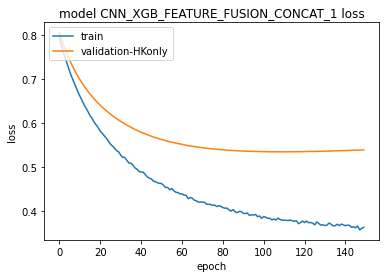

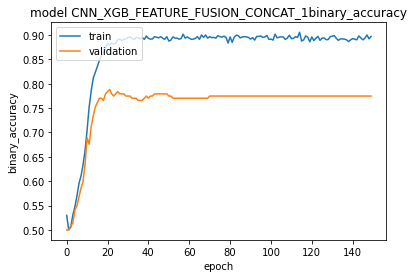

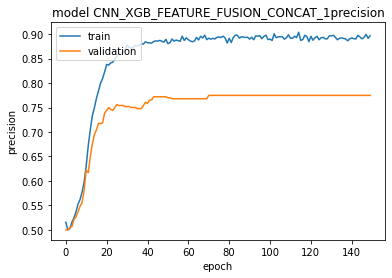

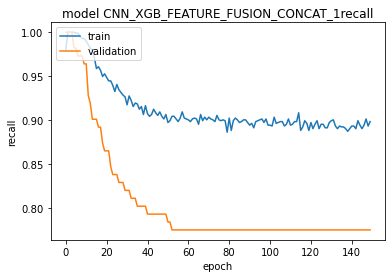

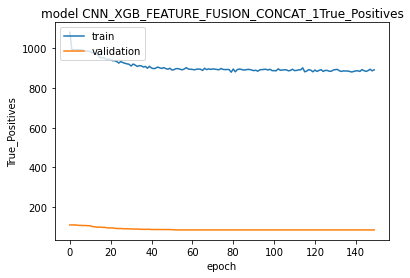

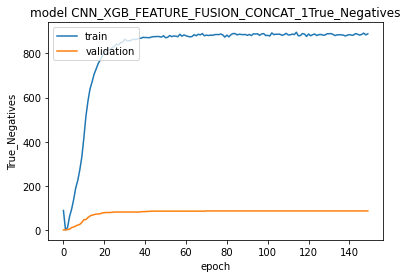

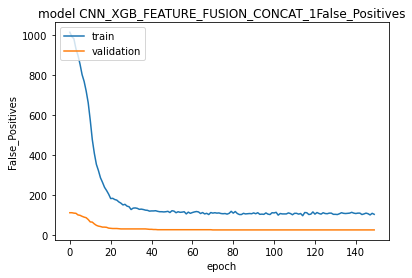

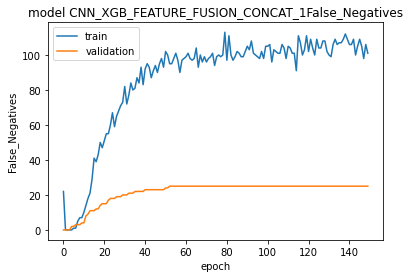

4/4 [==============================] - 3s 85ms/step - loss: 0.6353 - binary_accuracy: 0.7883 - precision: 0.7500 - recall: 0.8649 - True_Positives: 96.0000 - True_Negatives: 79.0000 - False_Positives: 32.0000 - False_Negatives: 15.0000
      MILD  SEVERE
3      1.0     0.0
12     0.0     1.0
30     1.0     0.0
39     0.0     1.0
54     0.0     1.0
...    ...     ...
1057   0.0     1.0
1062   1.0     0.0
1071   0.0     1.0
1073   0.0     1.0
1079   0.0     1.0

[111 rows x 2 columns]
      Prognosis
3             0
12            1
30            0
39            1
54            1
...         ...
1057          1
1062          0
1071          1
1073          1
1079          1

[111 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.811
[[0.4227193  0.5772807 ]
 [0.01824391 0.9817561 ]
 [0.550967   0.449033  ]
 [0.02871799 0.971282  ]
 [0.8532488  0.14675124]
 [0.20906013 0.79093987]
 [0.2933119  0.7066881 ]
 [0.30724692 0.6927531 ]
 [0.49349248 0.5065075 ]
 [0.18918467 0.81081533]
 [0.32424462 0.6757554 ]
 [0.6574014  0.34259862]
 [0.01852858 0.9814714 ]
 [0.587212   0.41278797]
 [0.6948961  0.3051039 ]
 [0.16055149 0.8394485 ]
 [0.04904282 0.9509572 ]
 [0.925849   0.07415099]
 [0.8704515  0.1295485 ]
 [0.41568273 0.58431727]
 [0.5082817  0.4917183 ]
 [0.22602367 0.7739763 ]
 [0.25458866 0.74541134]
 [0.06825382 0.9317462 ]
 [0.26723194 0.73276806]
 [0.01649517 0.98350483]
 [0.1923607  0.8076393 ]
 [0.12065709 0.8793429 ]
 [0.04233587 0.95766413]
 [0.8646289  0.1353711 ]
 [0.05291718 0.9470828 ]
 [0.07580405 0.92419595]
 [0.6995491  0.3004509 ]
 [0.69640326 0.3035967 ]
 [0.51475155 0.48524842]
 [0.7128812  0.2871188 ]
 [0.0353083  0.9646917 ]
 [0.3895384  0.6104616 ]
 [0.6009941  0.39900592]
 [0.78729

100%|██████████| 111/111 [00:05<00:00, 18.74it/s]


4/4 [==============================] - 3s 89ms/step - loss: 0.7396 - binary_accuracy: 0.6847 - precision: 0.6847 - recall: 0.6847 - True_Positives: 76.0000 - True_Negatives: 76.0000 - False_Positives: 35.0000 - False_Negatives: 35.0000
[0.7395607233047485, 0.684684693813324, 0.684684693813324, 0.684684693813324, 76.0, 76.0, 35.0, 35.0]
Epoch 1/150
30/31 [============================>.] - ETA: 0s - loss: 0.8330 - binary_accuracy: 0.3889 - precision: 0.4209 - recall: 0.5910 - True_Positives: 633.0000 - True_Negatives: 200.0000 - False_Positives: 871.0000 - False_Negatives: 438.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.40541, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 27s 382ms/step - loss: 0.8322 - binary_accuracy: 0.3889 - precision: 0.4208 - recall: 0.5902 - True_Positives: 651.0000 - True_Negatives: 207.0000 - False_Positives: 896.0000 - False_Negatives: 452.0000 - val_loss: 0.7999 - val_binary_accuracy: 0.4054 - val_precision: 0.4340 - val_recall: 0.6216 - val_True_Positives: 69.0000 - val_True_Negatives: 21.0000 - val_False_Positives: 90.0000 - val_False_Negatives: 42.0000
Epoch 2/150
30/31 [============================>.] - ETA: 0s - loss: 0.7808 - binary_accuracy: 0.4839 - precision: 0.4859 - recall: 0.5573 - True_Positives: 535.0000 - True_Negatives: 394.0000 - False_Positives: 566.0000 - False_Negatives: 425.0000
Epoch 2: val_binary_accuracy improved from 0.40541 to 0.52252, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 268ms/step - loss: 0.7798 - binary_accuracy: 0.4859 - precision: 0.4876 - recall: 0.5554 - True_Positives: 551.0000 - True_Negatives: 413.0000 - False_Positives: 579.0000 - False_Negatives: 441.0000 - val_loss: 0.7684 - val_binary_accuracy: 0.5225 - val_precision: 0.5200 - val_recall: 0.5856 - val_True_Positives: 65.0000 - val_True_Negatives: 51.0000 - val_False_Positives: 60.0000 - val_False_Negatives: 46.0000
Epoch 3/150
30/31 [============================>.] - ETA: 0s - loss: 0.7434 - binary_accuracy: 0.5875 - precision: 0.5929 - recall: 0.5583 - True_Positives: 536.0000 - True_Negatives: 592.0000 - False_Positives: 368.0000 - False_Negatives: 424.0000
Epoch 3: val_binary_accuracy improved from 0.52252 to 0.65315, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 10s 324ms/step - loss: 0.7433 - binary_accuracy: 0.5877 - precision: 0.5938 - recall: 0.5554 - True_Positives: 551.0000 - True_Negatives: 615.0000 - False_Positives: 377.0000 - False_Negatives: 441.0000 - val_loss: 0.7453 - val_binary_accuracy: 0.6532 - val_precision: 0.6667 - val_recall: 0.6126 - val_True_Positives: 68.0000 - val_True_Negatives: 77.0000 - val_False_Positives: 34.0000 - val_False_Negatives: 43.0000
Epoch 4/150
30/31 [============================>.] - ETA: 0s - loss: 0.7173 - binary_accuracy: 0.6609 - precision: 0.6774 - recall: 0.6146 - True_Positives: 590.0000 - True_Negatives: 679.0000 - False_Positives: 281.0000 - False_Negatives: 370.0000
Epoch 4: val_binary_accuracy improved from 0.65315 to 0.68018, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 269ms/step - loss: 0.7172 - binary_accuracy: 0.6608 - precision: 0.6778 - recall: 0.6129 - True_Positives: 608.0000 - True_Negatives: 703.0000 - False_Positives: 289.0000 - False_Negatives: 384.0000 - val_loss: 0.7289 - val_binary_accuracy: 0.6802 - val_precision: 0.6923 - val_recall: 0.6486 - val_True_Positives: 72.0000 - val_True_Negatives: 79.0000 - val_False_Positives: 32.0000 - val_False_Negatives: 39.0000
Epoch 5/150
31/31 [==============================] - ETA: 0s - loss: 0.6931 - binary_accuracy: 0.7445 - precision: 0.7555 - recall: 0.7228 - True_Positives: 717.0000 - True_Negatives: 760.0000 - False_Positives: 232.0000 - False_Negatives: 275.0000
Epoch 5: val_binary_accuracy improved from 0.68018 to 0.70270, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 7s 237ms/step - loss: 0.6931 - binary_accuracy: 0.7445 - precision: 0.7555 - recall: 0.7228 - True_Positives: 717.0000 - True_Negatives: 760.0000 - False_Positives: 232.0000 - False_Negatives: 275.0000 - val_loss: 0.7153 - val_binary_accuracy: 0.7027 - val_precision: 0.7184 - val_recall: 0.6667 - val_True_Positives: 74.0000 - val_True_Negatives: 82.0000 - val_False_Positives: 29.0000 - val_False_Negatives: 37.0000
Epoch 6/150
30/31 [============================>.] - ETA: 0s - loss: 0.6781 - binary_accuracy: 0.7641 - precision: 0.7705 - recall: 0.7521 - True_Positives: 722.0000 - True_Negatives: 745.0000 - False_Positives: 215.0000 - False_Negatives: 238.0000
Epoch 6: val_binary_accuracy improved from 0.70270 to 0.72072, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 10s 314ms/step - loss: 0.6773 - binary_accuracy: 0.7666 - precision: 0.7718 - recall: 0.7571 - True_Positives: 751.0000 - True_Negatives: 770.0000 - False_Positives: 222.0000 - False_Negatives: 241.0000 - val_loss: 0.7026 - val_binary_accuracy: 0.7207 - val_precision: 0.7379 - val_recall: 0.6847 - val_True_Positives: 76.0000 - val_True_Negatives: 84.0000 - val_False_Positives: 27.0000 - val_False_Negatives: 35.0000
Epoch 7/150
30/31 [============================>.] - ETA: 0s - loss: 0.6578 - binary_accuracy: 0.7953 - precision: 0.7981 - recall: 0.7906 - True_Positives: 759.0000 - True_Negatives: 768.0000 - False_Positives: 192.0000 - False_Negatives: 201.0000
Epoch 7: val_binary_accuracy improved from 0.72072 to 0.72973, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 7s 244ms/step - loss: 0.6578 - binary_accuracy: 0.7944 - precision: 0.7967 - recall: 0.7903 - True_Positives: 784.0000 - True_Negatives: 792.0000 - False_Positives: 200.0000 - False_Negatives: 208.0000 - val_loss: 0.6923 - val_binary_accuracy: 0.7297 - val_precision: 0.7429 - val_recall: 0.7027 - val_True_Positives: 78.0000 - val_True_Negatives: 84.0000 - val_False_Positives: 27.0000 - val_False_Negatives: 33.0000
Epoch 8/150
30/31 [============================>.] - ETA: 0s - loss: 0.6469 - binary_accuracy: 0.8016 - precision: 0.8038 - recall: 0.7979 - True_Positives: 766.0000 - True_Negatives: 773.0000 - False_Positives: 187.0000 - False_Negatives: 194.0000
Epoch 8: val_binary_accuracy improved from 0.72973 to 0.73423, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 272ms/step - loss: 0.6468 - binary_accuracy: 0.8019 - precision: 0.8034 - recall: 0.7994 - True_Positives: 793.0000 - True_Negatives: 798.0000 - False_Positives: 194.0000 - False_Negatives: 199.0000 - val_loss: 0.6836 - val_binary_accuracy: 0.7342 - val_precision: 0.7453 - val_recall: 0.7117 - val_True_Positives: 79.0000 - val_True_Negatives: 84.0000 - val_False_Positives: 27.0000 - val_False_Negatives: 32.0000
Epoch 9/150
31/31 [==============================] - ETA: 0s - loss: 0.6307 - binary_accuracy: 0.8160 - precision: 0.8189 - recall: 0.8115 - True_Positives: 805.0000 - True_Negatives: 814.0000 - False_Positives: 178.0000 - False_Negatives: 187.0000
Epoch 9: val_binary_accuracy did not improve from 0.73423
31/31 [==============================] - 1s 38ms/step - loss: 0.6307 - binary_accuracy: 0.8160 - precision: 0.8189 - recall: 0.8115 - True_Positives: 805.0000 - True_Negatives: 814.0000 - False_Positives: 178.0000 - False_Negatives: 1

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 7s 240ms/step - loss: 0.6208 - binary_accuracy: 0.8130 - precision: 0.8165 - recall: 0.8075 - True_Positives: 801.0000 - True_Negatives: 812.0000 - False_Positives: 180.0000 - False_Negatives: 191.0000 - val_loss: 0.6681 - val_binary_accuracy: 0.7432 - val_precision: 0.7547 - val_recall: 0.7207 - val_True_Positives: 80.0000 - val_True_Negatives: 85.0000 - val_False_Positives: 26.0000 - val_False_Negatives: 31.0000
Epoch 11/150
30/31 [============================>.] - ETA: 0s - loss: 0.6154 - binary_accuracy: 0.8146 - precision: 0.8192 - recall: 0.8073 - True_Positives: 775.0000 - True_Negatives: 789.0000 - False_Positives: 171.0000 - False_Negatives: 185.0000
Epoch 11: val_binary_accuracy improved from 0.74324 to 0.75225, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 7s 245ms/step - loss: 0.6138 - binary_accuracy: 0.8180 - precision: 0.8223 - recall: 0.8115 - True_Positives: 805.0000 - True_Negatives: 818.0000 - False_Positives: 174.0000 - False_Negatives: 187.0000 - val_loss: 0.6618 - val_binary_accuracy: 0.7523 - val_precision: 0.7642 - val_recall: 0.7297 - val_True_Positives: 81.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 30.0000
Epoch 12/150
30/31 [============================>.] - ETA: 0s - loss: 0.6025 - binary_accuracy: 0.8276 - precision: 0.8349 - recall: 0.8167 - True_Positives: 784.0000 - True_Negatives: 805.0000 - False_Positives: 155.0000 - False_Negatives: 176.0000
Epoch 12: val_binary_accuracy improved from 0.75225 to 0.75676, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 9s 292ms/step - loss: 0.6009 - binary_accuracy: 0.8296 - precision: 0.8364 - recall: 0.8196 - True_Positives: 813.0000 - True_Negatives: 833.0000 - False_Positives: 159.0000 - False_Negatives: 179.0000 - val_loss: 0.6556 - val_binary_accuracy: 0.7568 - val_precision: 0.7664 - val_recall: 0.7387 - val_True_Positives: 82.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 29.0000
Epoch 13/150
31/31 [==============================] - ETA: 0s - loss: 0.5927 - binary_accuracy: 0.8367 - precision: 0.8450 - recall: 0.8246 - True_Positives: 818.0000 - True_Negatives: 842.0000 - False_Positives: 150.0000 - False_Negatives: 174.0000
Epoch 13: val_binary_accuracy improved from 0.75676 to 0.76126, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 252ms/step - loss: 0.5927 - binary_accuracy: 0.8367 - precision: 0.8450 - recall: 0.8246 - True_Positives: 818.0000 - True_Negatives: 842.0000 - False_Positives: 150.0000 - False_Negatives: 174.0000 - val_loss: 0.6509 - val_binary_accuracy: 0.7613 - val_precision: 0.7736 - val_recall: 0.7387 - val_True_Positives: 82.0000 - val_True_Negatives: 87.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 29.0000
Epoch 14/150
30/31 [============================>.] - ETA: 0s - loss: 0.5838 - binary_accuracy: 0.8401 - precision: 0.8433 - recall: 0.8354 - True_Positives: 802.0000 - True_Negatives: 811.0000 - False_Positives: 149.0000 - False_Negatives: 158.0000
Epoch 14: val_binary_accuracy improved from 0.76126 to 0.76577, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 278ms/step - loss: 0.5835 - binary_accuracy: 0.8412 - precision: 0.8458 - recall: 0.8347 - True_Positives: 828.0000 - True_Negatives: 841.0000 - False_Positives: 151.0000 - False_Negatives: 164.0000 - val_loss: 0.6450 - val_binary_accuracy: 0.7658 - val_precision: 0.7757 - val_recall: 0.7477 - val_True_Positives: 83.0000 - val_True_Negatives: 87.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 28.0000
Epoch 15/150
30/31 [============================>.] - ETA: 0s - loss: 0.5760 - binary_accuracy: 0.8391 - precision: 0.8519 - recall: 0.8208 - True_Positives: 788.0000 - True_Negatives: 823.0000 - False_Positives: 137.0000 - False_Negatives: 172.0000
Epoch 15: val_binary_accuracy improved from 0.76577 to 0.77027, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 7s 243ms/step - loss: 0.5746 - binary_accuracy: 0.8427 - precision: 0.8549 - recall: 0.8256 - True_Positives: 819.0000 - True_Negatives: 853.0000 - False_Positives: 139.0000 - False_Negatives: 173.0000 - val_loss: 0.6407 - val_binary_accuracy: 0.7703 - val_precision: 0.7778 - val_recall: 0.7568 - val_True_Positives: 84.0000 - val_True_Negatives: 87.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 27.0000
Epoch 16/150
31/31 [==============================] - ETA: 0s - loss: 0.5687 - binary_accuracy: 0.8422 - precision: 0.8504 - recall: 0.8306 - True_Positives: 824.0000 - True_Negatives: 847.0000 - False_Positives: 145.0000 - False_Negatives: 168.0000
Epoch 16: val_binary_accuracy improved from 0.77027 to 0.77477, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 267ms/step - loss: 0.5687 - binary_accuracy: 0.8422 - precision: 0.8504 - recall: 0.8306 - True_Positives: 824.0000 - True_Negatives: 847.0000 - False_Positives: 145.0000 - False_Negatives: 168.0000 - val_loss: 0.6363 - val_binary_accuracy: 0.7748 - val_precision: 0.7905 - val_recall: 0.7477 - val_True_Positives: 83.0000 - val_True_Negatives: 89.0000 - val_False_Positives: 22.0000 - val_False_Negatives: 28.0000
Epoch 17/150
31/31 [==============================] - ETA: 0s - loss: 0.5623 - binary_accuracy: 0.8518 - precision: 0.8635 - recall: 0.8357 - True_Positives: 829.0000 - True_Negatives: 861.0000 - False_Positives: 131.0000 - False_Negatives: 163.0000
Epoch 17: val_binary_accuracy did not improve from 0.77477
31/31 [==============================] - 1s 43ms/step - loss: 0.5623 - binary_accuracy: 0.8518 - precision: 0.8635 - recall: 0.8357 - True_Positives: 829.0000 - True_Negatives: 861.0000 - False_Positives: 131.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 7s 241ms/step - loss: 0.5563 - binary_accuracy: 0.8584 - precision: 0.8669 - recall: 0.8468 - True_Positives: 840.0000 - True_Negatives: 863.0000 - False_Positives: 129.0000 - False_Negatives: 152.0000 - val_loss: 0.6293 - val_binary_accuracy: 0.7793 - val_precision: 0.7925 - val_recall: 0.7568 - val_True_Positives: 84.0000 - val_True_Negatives: 89.0000 - val_False_Positives: 22.0000 - val_False_Negatives: 27.0000
Epoch 19/150
30/31 [============================>.] - ETA: 0s - loss: 0.5512 - binary_accuracy: 0.8573 - precision: 0.8626 - recall: 0.8500 - True_Positives: 816.0000 - True_Negatives: 830.0000 - False_Positives: 130.0000 - False_Negatives: 144.0000
Epoch 19: val_binary_accuracy did not improve from 0.77928
31/31 [==============================] - 1s 42ms/step - loss: 0.5526 - binary_accuracy: 0.8548 - precision: 0.8599 - recall: 0.8478 - True_Positives: 841.0000 - True_Negatives: 855.0000 - False_Positives: 137.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 270ms/step - loss: 0.5361 - binary_accuracy: 0.8609 - precision: 0.8676 - recall: 0.8518 - True_Positives: 845.0000 - True_Negatives: 863.0000 - False_Positives: 129.0000 - False_Negatives: 147.0000 - val_loss: 0.6160 - val_binary_accuracy: 0.7838 - val_precision: 0.7944 - val_recall: 0.7658 - val_True_Positives: 85.0000 - val_True_Negatives: 89.0000 - val_False_Positives: 22.0000 - val_False_Negatives: 26.0000
Epoch 23/150
30/31 [============================>.] - ETA: 0s - loss: 0.5253 - binary_accuracy: 0.8740 - precision: 0.8835 - recall: 0.8615 - True_Positives: 827.0000 - True_Negatives: 851.0000 - False_Positives: 109.0000 - False_Negatives: 133.0000
Epoch 23: val_binary_accuracy did not improve from 0.78378
31/31 [==============================] - 1s 43ms/step - loss: 0.5266 - binary_accuracy: 0.8720 - precision: 0.8812 - recall: 0.8599 - True_Positives: 853.0000 - True_Negatives: 877.0000 - False_Positives: 115.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 7s 237ms/step - loss: 0.5108 - binary_accuracy: 0.8740 - precision: 0.8793 - recall: 0.8669 - True_Positives: 860.0000 - True_Negatives: 874.0000 - False_Positives: 118.0000 - False_Negatives: 132.0000 - val_loss: 0.6047 - val_binary_accuracy: 0.7883 - val_precision: 0.7909 - val_recall: 0.7838 - val_True_Positives: 87.0000 - val_True_Negatives: 88.0000 - val_False_Positives: 23.0000 - val_False_Negatives: 24.0000
Epoch 28/150
30/31 [============================>.] - ETA: 0s - loss: 0.5065 - binary_accuracy: 0.8786 - precision: 0.8814 - recall: 0.8750 - True_Positives: 840.0000 - True_Negatives: 847.0000 - False_Positives: 113.0000 - False_Negatives: 120.0000
Epoch 28: val_binary_accuracy improved from 0.78829 to 0.80180, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 271ms/step - loss: 0.5062 - binary_accuracy: 0.8780 - precision: 0.8803 - recall: 0.8750 - True_Positives: 868.0000 - True_Negatives: 874.0000 - False_Positives: 118.0000 - False_Negatives: 124.0000 - val_loss: 0.6017 - val_binary_accuracy: 0.8018 - val_precision: 0.7965 - val_recall: 0.8108 - val_True_Positives: 90.0000 - val_True_Negatives: 88.0000 - val_False_Positives: 23.0000 - val_False_Negatives: 21.0000
Epoch 29/150
30/31 [============================>.] - ETA: 0s - loss: 0.5022 - binary_accuracy: 0.8714 - precision: 0.8789 - recall: 0.8615 - True_Positives: 827.0000 - True_Negatives: 846.0000 - False_Positives: 114.0000 - False_Negatives: 133.0000
Epoch 29: val_binary_accuracy did not improve from 0.80180
31/31 [==============================] - 1s 42ms/step - loss: 0.5013 - binary_accuracy: 0.8730 - precision: 0.8799 - recall: 0.8639 - True_Positives: 857.0000 - True_Negatives: 875.0000 - False_Positives: 117.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_2\assets


31/31 [==============================] - 8s 257ms/step - loss: 0.3894 - binary_accuracy: 0.8916 - precision: 0.8920 - recall: 0.8911 - True_Positives: 884.0000 - True_Negatives: 885.0000 - False_Positives: 107.0000 - False_Negatives: 108.0000 - val_loss: 0.5649 - val_binary_accuracy: 0.8063 - val_precision: 0.8036 - val_recall: 0.8108 - val_True_Positives: 90.0000 - val_True_Negatives: 89.0000 - val_False_Positives: 22.0000 - val_False_Negatives: 21.0000
Epoch 87/150
31/31 [==============================] - ETA: 0s - loss: 0.3933 - binary_accuracy: 0.8896 - precision: 0.8884 - recall: 0.8911 - True_Positives: 884.0000 - True_Negatives: 881.0000 - False_Positives: 111.0000 - False_Negatives: 108.0000
Epoch 87: val_binary_accuracy did not improve from 0.80631
31/31 [==============================] - 1s 37ms/step - loss: 0.3933 - binary_accuracy: 0.8896 - precision: 0.8884 - recall: 0.8911 - True_Positives: 884.0000 - True_Negatives: 881.0000 - False_Positives: 111.0000 - False_Negatives:

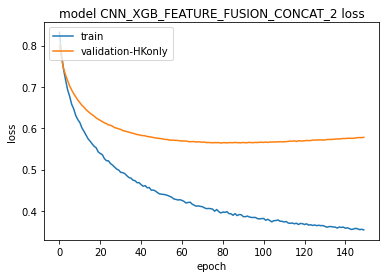

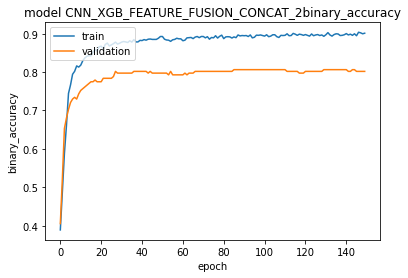

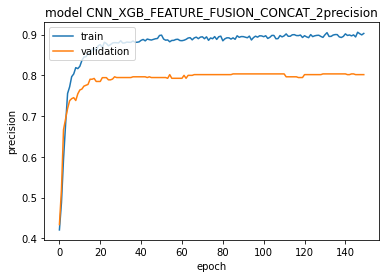

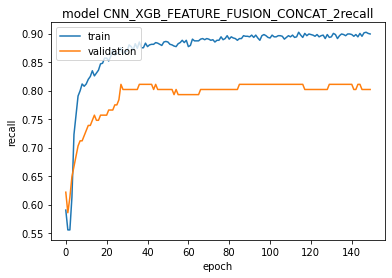

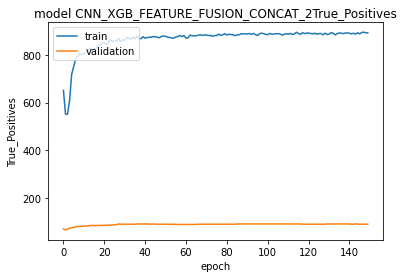

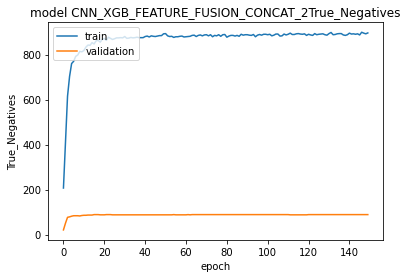

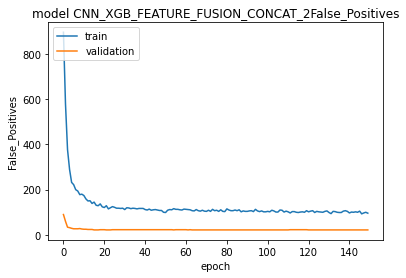

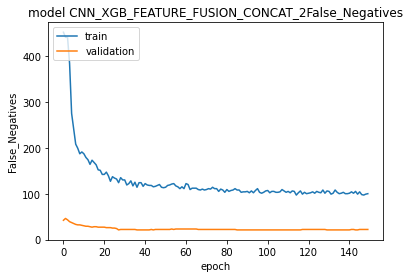

4/4 [==============================] - 3s 86ms/step - loss: 0.5649 - binary_accuracy: 0.8063 - precision: 0.8036 - recall: 0.8108 - True_Positives: 90.0000 - True_Negatives: 89.0000 - False_Positives: 22.0000 - False_Negatives: 21.0000
      MILD  SEVERE
2      1.0     0.0
6      1.0     0.0
25     0.0     1.0
29     1.0     0.0
55     1.0     0.0
...    ...     ...
1002   1.0     0.0
1010   1.0     0.0
1068   0.0     1.0
1083   0.0     1.0
1098   1.0     0.0

[111 rows x 2 columns]
      Prognosis
2             0
6             0
25            1
29            0
55            0
...         ...
1002          0
1010          0
1068          1
1083          1
1098          0

[111 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.775
[[0.9923717  0.00762832]
 [0.9123447  0.08765528]
 [0.07206261 0.9279374 ]
 [0.7373398  0.2626602 ]
 [0.97704875 0.02295125]
 [0.42961246 0.57038754]
 [0.51956964 0.48043036]
 [0.59383494 0.40616506]
 [0.06222516 0.93777484]
 [0.01217663 0.98782337]
 [0.73031616 0.26968387]
 [0.14542413 0.8545759 ]
 [0.82943386 0.17056614]
 [0.8328365  0.16716349]
 [0.41029465 0.58970535]
 [0.45512086 0.54487914]
 [0.58812517 0.41187483]
 [0.4185871  0.5814129 ]
 [0.07725096 0.92274904]
 [0.9862742  0.01372581]
 [0.9404742  0.05952577]
 [0.12116486 0.87883514]
 [0.03543019 0.9645698 ]
 [0.58340603 0.41659397]
 [0.62195337 0.37804663]
 [0.80610085 0.19389912]
 [0.8553227  0.14467731]
 [0.58091974 0.4190803 ]
 [0.55282974 0.44717026]
 [0.6249835  0.3750165 ]
 [0.90807664 0.09192334]
 [0.02208555 0.97791445]
 [0.04409188 0.9559081 ]
 [0.2990911  0.7009089 ]
 [0.85724866 0.14275135]
 [0.9227172  0.07728276]
 [0.13479245 0.86520755]
 [0.11265796 0.88734204]
 [0.8244574  0.17554256]
 [0.03357

100%|██████████| 111/111 [00:05<00:00, 18.68it/s]


4/4 [==============================] - 3s 27ms/step - loss: 0.7712 - binary_accuracy: 0.7027 - precision: 0.7027 - recall: 0.7027 - True_Positives: 78.0000 - True_Negatives: 78.0000 - False_Positives: 33.0000 - False_Negatives: 33.0000
[0.7712246775627136, 0.7027027010917664, 0.7027027010917664, 0.7027027010917664, 78.0, 78.0, 33.0, 33.0]
Epoch 1/150
30/31 [============================>.] - ETA: 0s - loss: 0.9176 - binary_accuracy: 0.3856 - precision: 0.4265 - recall: 0.6639 - True_Positives: 711.0000 - True_Negatives: 115.0000 - False_Positives: 956.0000 - False_Negatives: 360.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.38288, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 26s 366ms/step - loss: 0.9164 - binary_accuracy: 0.3867 - precision: 0.4273 - recall: 0.6664 - True_Positives: 735.0000 - True_Negatives: 118.0000 - False_Positives: 985.0000 - False_Negatives: 368.0000 - val_loss: 0.8771 - val_binary_accuracy: 0.3829 - val_precision: 0.4261 - val_recall: 0.6757 - val_True_Positives: 75.0000 - val_True_Negatives: 10.0000 - val_False_Positives: 101.0000 - val_False_Negatives: 36.0000
Epoch 2/150
30/31 [============================>.] - ETA: 0s - loss: 0.8418 - binary_accuracy: 0.4474 - precision: 0.4679 - recall: 0.7677 - True_Positives: 737.0000 - True_Negatives: 122.0000 - False_Positives: 838.0000 - False_Negatives: 223.0000
Epoch 2: val_binary_accuracy improved from 0.38288 to 0.50901, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 9s 282ms/step - loss: 0.8406 - binary_accuracy: 0.4511 - precision: 0.4701 - recall: 0.7692 - True_Positives: 763.0000 - True_Negatives: 132.0000 - False_Positives: 860.0000 - False_Negatives: 229.0000 - val_loss: 0.8296 - val_binary_accuracy: 0.5090 - val_precision: 0.5055 - val_recall: 0.8288 - val_True_Positives: 92.0000 - val_True_Negatives: 21.0000 - val_False_Positives: 90.0000 - val_False_Negatives: 19.0000
Epoch 3/150
30/31 [============================>.] - ETA: 0s - loss: 0.7945 - binary_accuracy: 0.6370 - precision: 0.5970 - recall: 0.8427 - True_Positives: 809.0000 - True_Negatives: 414.0000 - False_Positives: 546.0000 - False_Negatives: 151.0000
Epoch 3: val_binary_accuracy improved from 0.50901 to 0.62613, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 11s 348ms/step - loss: 0.7951 - binary_accuracy: 0.6361 - precision: 0.5963 - recall: 0.8427 - True_Positives: 836.0000 - True_Negatives: 426.0000 - False_Positives: 566.0000 - False_Negatives: 156.0000 - val_loss: 0.7985 - val_binary_accuracy: 0.6261 - val_precision: 0.5946 - val_recall: 0.7928 - val_True_Positives: 88.0000 - val_True_Negatives: 51.0000 - val_False_Positives: 60.0000 - val_False_Negatives: 23.0000
Epoch 4/150
30/31 [============================>.] - ETA: 0s - loss: 0.7612 - binary_accuracy: 0.7401 - precision: 0.6942 - recall: 0.8583 - True_Positives: 824.0000 - True_Negatives: 597.0000 - False_Positives: 363.0000 - False_Negatives: 136.0000
Epoch 4: val_binary_accuracy improved from 0.62613 to 0.73874, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 9s 278ms/step - loss: 0.7611 - binary_accuracy: 0.7414 - precision: 0.6962 - recall: 0.8569 - True_Positives: 850.0000 - True_Negatives: 621.0000 - False_Positives: 371.0000 - False_Negatives: 142.0000 - val_loss: 0.7750 - val_binary_accuracy: 0.7387 - val_precision: 0.6934 - val_recall: 0.8559 - val_True_Positives: 95.0000 - val_True_Negatives: 69.0000 - val_False_Positives: 42.0000 - val_False_Negatives: 16.0000
Epoch 5/150
31/31 [==============================] - ETA: 0s - loss: 0.7332 - binary_accuracy: 0.8019 - precision: 0.7602 - recall: 0.8821 - True_Positives: 875.0000 - True_Negatives: 716.0000 - False_Positives: 276.0000 - False_Negatives: 117.0000
Epoch 5: val_binary_accuracy improved from 0.73874 to 0.76577, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 8s 250ms/step - loss: 0.7332 - binary_accuracy: 0.8019 - precision: 0.7602 - recall: 0.8821 - True_Positives: 875.0000 - True_Negatives: 716.0000 - False_Positives: 276.0000 - False_Negatives: 117.0000 - val_loss: 0.7565 - val_binary_accuracy: 0.7658 - val_precision: 0.7323 - val_recall: 0.8378 - val_True_Positives: 93.0000 - val_True_Negatives: 77.0000 - val_False_Positives: 34.0000 - val_False_Negatives: 18.0000
Epoch 6/150
31/31 [==============================] - ETA: 0s - loss: 0.7114 - binary_accuracy: 0.8191 - precision: 0.7849 - recall: 0.8790 - True_Positives: 872.0000 - True_Negatives: 753.0000 - False_Positives: 239.0000 - False_Negatives: 120.0000
Epoch 6: val_binary_accuracy improved from 0.76577 to 0.78829, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 10s 333ms/step - loss: 0.7114 - binary_accuracy: 0.8191 - precision: 0.7849 - recall: 0.8790 - True_Positives: 872.0000 - True_Negatives: 753.0000 - False_Positives: 239.0000 - False_Negatives: 120.0000 - val_loss: 0.7412 - val_binary_accuracy: 0.7883 - val_precision: 0.7623 - val_recall: 0.8378 - val_True_Positives: 93.0000 - val_True_Negatives: 82.0000 - val_False_Positives: 29.0000 - val_False_Negatives: 18.0000
Epoch 7/150
31/31 [==============================] - ETA: 0s - loss: 0.6926 - binary_accuracy: 0.8276 - precision: 0.8026 - recall: 0.8690 - True_Positives: 862.0000 - True_Negatives: 780.0000 - False_Positives: 212.0000 - False_Negatives: 130.0000
Epoch 7: val_binary_accuracy improved from 0.78829 to 0.79279, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 8s 248ms/step - loss: 0.6926 - binary_accuracy: 0.8276 - precision: 0.8026 - recall: 0.8690 - True_Positives: 862.0000 - True_Negatives: 780.0000 - False_Positives: 212.0000 - False_Negatives: 130.0000 - val_loss: 0.7286 - val_binary_accuracy: 0.7928 - val_precision: 0.7686 - val_recall: 0.8378 - val_True_Positives: 93.0000 - val_True_Negatives: 83.0000 - val_False_Positives: 28.0000 - val_False_Negatives: 18.0000
Epoch 8/150
31/31 [==============================] - ETA: 0s - loss: 0.6759 - binary_accuracy: 0.8367 - precision: 0.8169 - recall: 0.8679 - True_Positives: 861.0000 - True_Negatives: 799.0000 - False_Positives: 193.0000 - False_Negatives: 131.0000
Epoch 8: val_binary_accuracy improved from 0.79279 to 0.80180, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 9s 286ms/step - loss: 0.6759 - binary_accuracy: 0.8367 - precision: 0.8169 - recall: 0.8679 - True_Positives: 861.0000 - True_Negatives: 799.0000 - False_Positives: 193.0000 - False_Negatives: 131.0000 - val_loss: 0.7174 - val_binary_accuracy: 0.8018 - val_precision: 0.7815 - val_recall: 0.8378 - val_True_Positives: 93.0000 - val_True_Negatives: 85.0000 - val_False_Positives: 26.0000 - val_False_Negatives: 18.0000
Epoch 9/150
31/31 [==============================] - ETA: 0s - loss: 0.6633 - binary_accuracy: 0.8397 - precision: 0.8210 - recall: 0.8690 - True_Positives: 862.0000 - True_Negatives: 804.0000 - False_Positives: 188.0000 - False_Negatives: 130.0000
Epoch 9: val_binary_accuracy improved from 0.80180 to 0.80631, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 8s 262ms/step - loss: 0.6633 - binary_accuracy: 0.8397 - precision: 0.8210 - recall: 0.8690 - True_Positives: 862.0000 - True_Negatives: 804.0000 - False_Positives: 188.0000 - False_Negatives: 130.0000 - val_loss: 0.7075 - val_binary_accuracy: 0.8063 - val_precision: 0.7881 - val_recall: 0.8378 - val_True_Positives: 93.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 18.0000
Epoch 10/150
30/31 [============================>.] - ETA: 0s - loss: 0.6492 - binary_accuracy: 0.8505 - precision: 0.8348 - recall: 0.8740 - True_Positives: 839.0000 - True_Negatives: 794.0000 - False_Positives: 166.0000 - False_Negatives: 121.0000
Epoch 10: val_binary_accuracy did not improve from 0.80631
31/31 [==============================] - 1s 42ms/step - loss: 0.6482 - binary_accuracy: 0.8508 - precision: 0.8340 - recall: 0.8760 - True_Positives: 869.0000 - True_Negatives: 819.0000 - False_Positives: 173.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 8s 282ms/step - loss: 0.5758 - binary_accuracy: 0.8669 - precision: 0.8633 - recall: 0.8720 - True_Positives: 865.0000 - True_Negatives: 855.0000 - False_Positives: 137.0000 - False_Negatives: 127.0000 - val_loss: 0.6496 - val_binary_accuracy: 0.8108 - val_precision: 0.8053 - val_recall: 0.8198 - val_True_Positives: 91.0000 - val_True_Negatives: 89.0000 - val_False_Positives: 22.0000 - val_False_Negatives: 20.0000
Epoch 20/150
31/31 [==============================] - ETA: 0s - loss: 0.5721 - binary_accuracy: 0.8705 - precision: 0.8686 - recall: 0.8730 - True_Positives: 866.0000 - True_Negatives: 861.0000 - False_Positives: 131.0000 - False_Negatives: 126.0000
Epoch 20: val_binary_accuracy did not improve from 0.81081
31/31 [==============================] - 1s 37ms/step - loss: 0.5721 - binary_accuracy: 0.8705 - precision: 0.8686 - recall: 0.8730 - True_Positives: 866.0000 - True_Negatives: 861.0000 - False_Positives: 131.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 10s 321ms/step - loss: 0.5706 - binary_accuracy: 0.8649 - precision: 0.8598 - recall: 0.8720 - True_Positives: 865.0000 - True_Negatives: 851.0000 - False_Positives: 141.0000 - False_Negatives: 127.0000 - val_loss: 0.6428 - val_binary_accuracy: 0.8153 - val_precision: 0.8182 - val_recall: 0.8108 - val_True_Positives: 90.0000 - val_True_Negatives: 91.0000 - val_False_Positives: 20.0000 - val_False_Negatives: 21.0000
Epoch 22/150
31/31 [==============================] - ETA: 0s - loss: 0.5605 - binary_accuracy: 0.8720 - precision: 0.8661 - recall: 0.8800 - True_Positives: 873.0000 - True_Negatives: 857.0000 - False_Positives: 135.0000 - False_Negatives: 119.0000
Epoch 22: val_binary_accuracy did not improve from 0.81532
31/31 [==============================] - 1s 39ms/step - loss: 0.5605 - binary_accuracy: 0.8720 - precision: 0.8661 - recall: 0.8800 - True_Positives: 873.0000 - True_Negatives: 857.0000 - False_Positives: 135.0000 - False_Negatives

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 8s 258ms/step - loss: 0.5375 - binary_accuracy: 0.8795 - precision: 0.8776 - recall: 0.8821 - True_Positives: 875.0000 - True_Negatives: 870.0000 - False_Positives: 122.0000 - False_Negatives: 117.0000 - val_loss: 0.6246 - val_binary_accuracy: 0.8198 - val_precision: 0.8257 - val_recall: 0.8108 - val_True_Positives: 90.0000 - val_True_Negatives: 92.0000 - val_False_Positives: 19.0000 - val_False_Negatives: 21.0000
Epoch 29/150
30/31 [============================>.] - ETA: 0s - loss: 0.5382 - binary_accuracy: 0.8646 - precision: 0.8623 - recall: 0.8677 - True_Positives: 833.0000 - True_Negatives: 827.0000 - False_Positives: 133.0000 - False_Negatives: 127.0000
Epoch 29: val_binary_accuracy did not improve from 0.81982
31/31 [==============================] - 1s 41ms/step - loss: 0.5357 - binary_accuracy: 0.8679 - precision: 0.8657 - recall: 0.8710 - True_Positives: 864.0000 - True_Negatives: 858.0000 - False_Positives: 134.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 8s 278ms/step - loss: 0.5227 - binary_accuracy: 0.8765 - precision: 0.8716 - recall: 0.8831 - True_Positives: 876.0000 - True_Negatives: 863.0000 - False_Positives: 129.0000 - False_Negatives: 116.0000 - val_loss: 0.6169 - val_binary_accuracy: 0.8243 - val_precision: 0.8273 - val_recall: 0.8198 - val_True_Positives: 91.0000 - val_True_Negatives: 92.0000 - val_False_Positives: 19.0000 - val_False_Negatives: 20.0000
Epoch 33/150
31/31 [==============================] - ETA: 0s - loss: 0.5225 - binary_accuracy: 0.8760 - precision: 0.8730 - recall: 0.8800 - True_Positives: 873.0000 - True_Negatives: 865.0000 - False_Positives: 127.0000 - False_Negatives: 119.0000
Epoch 33: val_binary_accuracy did not improve from 0.82432
31/31 [==============================] - 1s 43ms/step - loss: 0.5225 - binary_accuracy: 0.8760 - precision: 0.8730 - recall: 0.8800 - True_Positives: 873.0000 - True_Negatives: 865.0000 - False_Positives: 127.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 7s 247ms/step - loss: 0.4781 - binary_accuracy: 0.8826 - precision: 0.8814 - recall: 0.8841 - True_Positives: 877.0000 - True_Negatives: 874.0000 - False_Positives: 118.0000 - False_Negatives: 115.0000 - val_loss: 0.5957 - val_binary_accuracy: 0.8288 - val_precision: 0.8349 - val_recall: 0.8198 - val_True_Positives: 91.0000 - val_True_Negatives: 93.0000 - val_False_Positives: 18.0000 - val_False_Negatives: 20.0000
Epoch 52/150
31/31 [==============================] - ETA: 0s - loss: 0.4905 - binary_accuracy: 0.8765 - precision: 0.8761 - recall: 0.8770 - True_Positives: 870.0000 - True_Negatives: 869.0000 - False_Positives: 123.0000 - False_Negatives: 122.0000
Epoch 52: val_binary_accuracy did not improve from 0.82883
31/31 [==============================] - 1s 37ms/step - loss: 0.4905 - binary_accuracy: 0.8765 - precision: 0.8761 - recall: 0.8770 - True_Positives: 870.0000 - True_Negatives: 869.0000 - False_Positives: 123.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_3\assets


31/31 [==============================] - 8s 272ms/step - loss: 0.4721 - binary_accuracy: 0.8926 - precision: 0.8930 - recall: 0.8921 - True_Positives: 885.0000 - True_Negatives: 886.0000 - False_Positives: 106.0000 - False_Negatives: 107.0000 - val_loss: 0.5922 - val_binary_accuracy: 0.8333 - val_precision: 0.8364 - val_recall: 0.8288 - val_True_Positives: 92.0000 - val_True_Negatives: 93.0000 - val_False_Positives: 18.0000 - val_False_Negatives: 19.0000
Epoch 58/150
30/31 [============================>.] - ETA: 0s - loss: 0.4672 - binary_accuracy: 0.8906 - precision: 0.8898 - recall: 0.8917 - True_Positives: 856.0000 - True_Negatives: 854.0000 - False_Positives: 106.0000 - False_Negatives: 104.0000
Epoch 58: val_binary_accuracy did not improve from 0.83333
31/31 [==============================] - 1s 37ms/step - loss: 0.4712 - binary_accuracy: 0.8891 - precision: 0.8883 - recall: 0.8901 - True_Positives: 883.0000 - True_Negatives: 881.0000 - False_Positives: 111.0000 - False_Negatives:

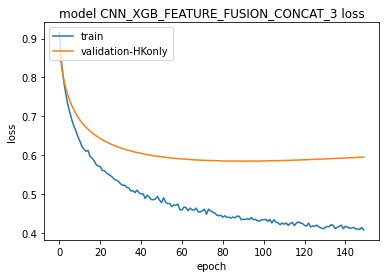

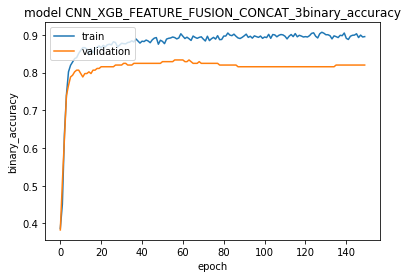

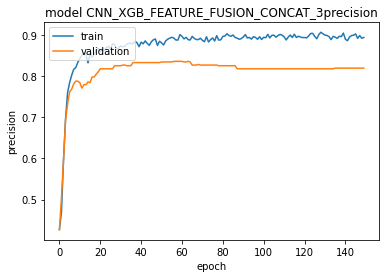

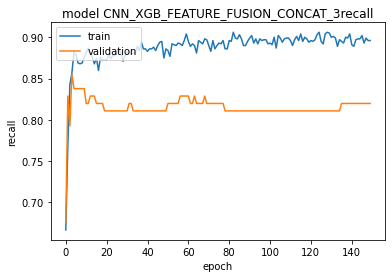

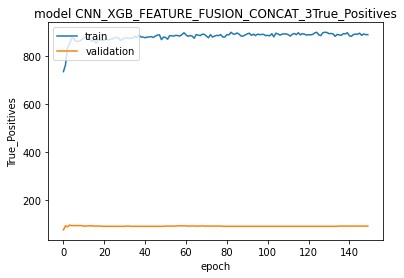

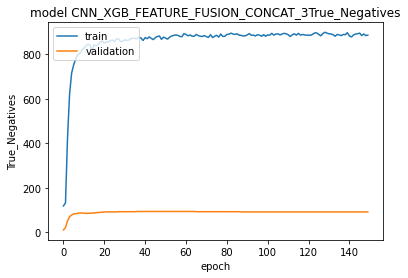

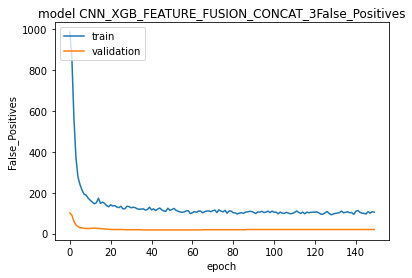

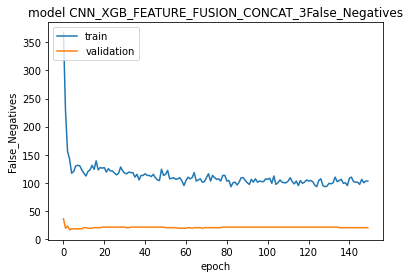

4/4 [==============================] - 3s 30ms/step - loss: 0.5922 - binary_accuracy: 0.8333 - precision: 0.8364 - recall: 0.8288 - True_Positives: 92.0000 - True_Negatives: 93.0000 - False_Positives: 18.0000 - False_Negatives: 19.0000
      MILD  SEVERE
5      1.0     0.0
7      1.0     0.0
9      1.0     0.0
33     0.0     1.0
62     1.0     0.0
...    ...     ...
1065   0.0     1.0
1066   0.0     1.0
1072   0.0     1.0
1084   0.0     1.0
1099   1.0     0.0

[110 rows x 2 columns]
      Prognosis
5             0
7             0
9             0
33            1
62            0
...         ...
1065          1
1066          1
1072          1
1084          1
1099          0

[110 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.782
[[0.95455533 0.04544468]
 [0.72358525 0.27641475]
 [0.57399154 0.4260085 ]
 [0.26937604 0.73062396]
 [0.6113809  0.38861912]
 [0.515375   0.48462495]
 [0.347939   0.652061  ]
 [0.17847157 0.82152843]
 [0.29072547 0.70927453]
 [0.08185738 0.9181426 ]
 [0.84668773 0.15331227]
 [0.61194265 0.38805735]
 [0.6756946  0.32430544]
 [0.7822019  0.21779813]
 [0.04234737 0.9576526 ]
 [0.1457665  0.8542335 ]
 [0.00327265 0.99672735]
 [0.37908286 0.62091714]
 [0.25809765 0.74190235]
 [0.54978657 0.45021346]
 [0.3003047  0.6996953 ]
 [0.34845024 0.65154976]
 [0.00455242 0.9954476 ]
 [0.11993784 0.88006216]
 [0.8311784  0.1688216 ]
 [0.20958203 0.79041797]
 [0.11599308 0.8840069 ]
 [0.31089813 0.6891019 ]
 [0.93622184 0.06377816]
 [0.31426227 0.6857377 ]
 [0.27974874 0.72025126]
 [0.03859419 0.9614058 ]
 [0.9591682  0.04083181]
 [0.65517426 0.34482577]
 [0.40640014 0.59359986]
 [0.05836725 0.94163275]
 [0.03086746 0.96913254]
 [0.0552364  0.9447636 ]
 [0.8839462  0.11605385]
 [0.73302

100%|██████████| 110/110 [00:06<00:00, 18.24it/s]


4/4 [==============================] - 3s 52ms/step - loss: 0.8943 - binary_accuracy: 0.7091 - precision: 0.7091 - recall: 0.7091 - True_Positives: 78.0000 - True_Negatives: 78.0000 - False_Positives: 32.0000 - False_Negatives: 32.0000
[0.8942825198173523, 0.7090908885002136, 0.7090908885002136, 0.7090908885002136, 78.0, 78.0, 32.0, 32.0]
Epoch 1/150
32/32 [==============================] - ETA: 0s - loss: 0.9926 - binary_accuracy: 0.6055 - precision: 0.5855 - recall: 0.7228 - True_Positives: 798.0000 - True_Negatives: 539.0000 - False_Positives: 565.0000 - False_Negatives: 306.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.56818, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 26s 371ms/step - loss: 0.9926 - binary_accuracy: 0.6055 - precision: 0.5855 - recall: 0.7228 - True_Positives: 798.0000 - True_Negatives: 539.0000 - False_Positives: 565.0000 - False_Negatives: 306.0000 - val_loss: 0.9127 - val_binary_accuracy: 0.5682 - val_precision: 0.5620 - val_recall: 0.6182 - val_True_Positives: 68.0000 - val_True_Negatives: 57.0000 - val_False_Positives: 53.0000 - val_False_Negatives: 42.0000
Epoch 2/150
32/32 [==============================] - ETA: 0s - loss: 0.9226 - binary_accuracy: 0.5841 - precision: 0.5658 - recall: 0.7231 - True_Positives: 718.0000 - True_Negatives: 442.0000 - False_Positives: 551.0000 - False_Negatives: 275.0000
Epoch 2: val_binary_accuracy did not improve from 0.56818
32/32 [==============================] - 2s 43ms/step - loss: 0.9226 - binary_accuracy: 0.5841 - precision: 0.5658 - recall: 0.7231 - True_Positives: 718.0000 - True_Negatives: 442.0000 - False_Positives: 551.0000 - False_Negatives: 

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 10s 315ms/step - loss: 0.8772 - binary_accuracy: 0.6118 - precision: 0.5855 - recall: 0.7654 - True_Positives: 760.0000 - True_Negatives: 455.0000 - False_Positives: 538.0000 - False_Negatives: 233.0000 - val_loss: 0.8601 - val_binary_accuracy: 0.6045 - val_precision: 0.5950 - val_recall: 0.6545 - val_True_Positives: 72.0000 - val_True_Negatives: 61.0000 - val_False_Positives: 49.0000 - val_False_Negatives: 38.0000
Epoch 4/150
31/32 [============================>.] - ETA: 0s - loss: 0.8467 - binary_accuracy: 0.6593 - precision: 0.6135 - recall: 0.8609 - True_Positives: 854.0000 - True_Negatives: 454.0000 - False_Positives: 538.0000 - False_Negatives: 138.0000
Epoch 4: val_binary_accuracy improved from 0.60455 to 0.66818, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 9s 268ms/step - loss: 0.8468 - binary_accuracy: 0.6591 - precision: 0.6133 - recall: 0.8610 - True_Positives: 855.0000 - True_Negatives: 454.0000 - False_Positives: 539.0000 - False_Negatives: 138.0000 - val_loss: 0.8424 - val_binary_accuracy: 0.6682 - val_precision: 0.6370 - val_recall: 0.7818 - val_True_Positives: 86.0000 - val_True_Negatives: 61.0000 - val_False_Positives: 49.0000 - val_False_Negatives: 24.0000
Epoch 5/150
31/32 [============================>.] - ETA: 0s - loss: 0.8210 - binary_accuracy: 0.6683 - precision: 0.6178 - recall: 0.8831 - True_Positives: 876.0000 - True_Negatives: 450.0000 - False_Positives: 542.0000 - False_Negatives: 116.0000
Epoch 5: val_binary_accuracy improved from 0.66818 to 0.68636, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 8s 242ms/step - loss: 0.8210 - binary_accuracy: 0.6687 - precision: 0.6180 - recall: 0.8832 - True_Positives: 877.0000 - True_Negatives: 451.0000 - False_Positives: 542.0000 - False_Negatives: 116.0000 - val_loss: 0.8286 - val_binary_accuracy: 0.6864 - val_precision: 0.6519 - val_recall: 0.8000 - val_True_Positives: 88.0000 - val_True_Negatives: 63.0000 - val_False_Positives: 47.0000 - val_False_Negatives: 22.0000
Epoch 6/150
32/32 [==============================] - ETA: 0s - loss: 0.8004 - binary_accuracy: 0.6772 - precision: 0.6241 - recall: 0.8912 - True_Positives: 885.0000 - True_Negatives: 460.0000 - False_Positives: 533.0000 - False_Negatives: 108.0000
Epoch 6: val_binary_accuracy did not improve from 0.68636
32/32 [==============================] - 1s 36ms/step - loss: 0.8004 - binary_accuracy: 0.6772 - precision: 0.6241 - recall: 0.8912 - True_Positives: 885.0000 - True_Negatives: 460.0000 - False_Positives: 533.0000 - False_Negatives: 1

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 8s 265ms/step - loss: 0.7664 - binary_accuracy: 0.6863 - precision: 0.6341 - recall: 0.8812 - True_Positives: 875.0000 - True_Negatives: 488.0000 - False_Positives: 505.0000 - False_Negatives: 118.0000 - val_loss: 0.7982 - val_binary_accuracy: 0.7182 - val_precision: 0.7000 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 74.0000 - val_False_Positives: 36.0000 - val_False_Negatives: 26.0000
Epoch 9/150
32/32 [==============================] - ETA: 0s - loss: 0.7518 - binary_accuracy: 0.7422 - precision: 0.6875 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 592.0000 - False_Positives: 401.0000 - False_Negatives: 111.0000
Epoch 9: val_binary_accuracy improved from 0.71818 to 0.73182, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 8s 254ms/step - loss: 0.7518 - binary_accuracy: 0.7422 - precision: 0.6875 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 592.0000 - False_Positives: 401.0000 - False_Negatives: 111.0000 - val_loss: 0.7890 - val_binary_accuracy: 0.7318 - val_precision: 0.7179 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 77.0000 - val_False_Positives: 33.0000 - val_False_Negatives: 26.0000
Epoch 10/150
31/32 [============================>.] - ETA: 0s - loss: 0.7396 - binary_accuracy: 0.7631 - precision: 0.7101 - recall: 0.8891 - True_Positives: 882.0000 - True_Negatives: 632.0000 - False_Positives: 360.0000 - False_Negatives: 110.0000
Epoch 10: val_binary_accuracy did not improve from 0.73182
32/32 [==============================] - 2s 42ms/step - loss: 0.7394 - binary_accuracy: 0.7633 - precision: 0.7104 - recall: 0.8892 - True_Positives: 883.0000 - True_Negatives: 633.0000 - False_Positives: 360.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 9s 273ms/step - loss: 0.7266 - binary_accuracy: 0.7774 - precision: 0.7260 - recall: 0.8912 - True_Positives: 885.0000 - True_Negatives: 659.0000 - False_Positives: 334.0000 - False_Negatives: 108.0000 - val_loss: 0.7739 - val_binary_accuracy: 0.7409 - val_precision: 0.7345 - val_recall: 0.7545 - val_True_Positives: 83.0000 - val_True_Negatives: 80.0000 - val_False_Positives: 30.0000 - val_False_Negatives: 27.0000
Epoch 12/150
31/32 [============================>.] - ETA: 0s - loss: 0.7175 - binary_accuracy: 0.7918 - precision: 0.7451 - recall: 0.8871 - True_Positives: 880.0000 - True_Negatives: 691.0000 - False_Positives: 301.0000 - False_Negatives: 112.0000
Epoch 12: val_binary_accuracy improved from 0.74091 to 0.75455, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 8s 252ms/step - loss: 0.7179 - binary_accuracy: 0.7910 - precision: 0.7445 - recall: 0.8862 - True_Positives: 880.0000 - True_Negatives: 691.0000 - False_Positives: 302.0000 - False_Negatives: 113.0000 - val_loss: 0.7667 - val_binary_accuracy: 0.7545 - val_precision: 0.7500 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 82.0000 - val_False_Positives: 28.0000 - val_False_Negatives: 26.0000
Epoch 13/150
31/32 [============================>.] - ETA: 0s - loss: 0.7085 - binary_accuracy: 0.7949 - precision: 0.7494 - recall: 0.8861 - True_Positives: 879.0000 - True_Negatives: 698.0000 - False_Positives: 294.0000 - False_Negatives: 113.0000
Epoch 13: val_binary_accuracy improved from 0.75455 to 0.76364, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 9s 271ms/step - loss: 0.7084 - binary_accuracy: 0.7951 - precision: 0.7496 - recall: 0.8862 - True_Positives: 880.0000 - True_Negatives: 699.0000 - False_Positives: 294.0000 - False_Negatives: 113.0000 - val_loss: 0.7612 - val_binary_accuracy: 0.7636 - val_precision: 0.7589 - val_recall: 0.7727 - val_True_Positives: 85.0000 - val_True_Negatives: 83.0000 - val_False_Positives: 27.0000 - val_False_Negatives: 25.0000
Epoch 14/150
31/32 [============================>.] - ETA: 0s - loss: 0.6996 - binary_accuracy: 0.8110 - precision: 0.7690 - recall: 0.8891 - True_Positives: 882.0000 - True_Negatives: 727.0000 - False_Positives: 265.0000 - False_Negatives: 110.0000
Epoch 14: val_binary_accuracy improved from 0.76364 to 0.76818, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 8s 248ms/step - loss: 0.6995 - binary_accuracy: 0.8112 - precision: 0.7692 - recall: 0.8892 - True_Positives: 883.0000 - True_Negatives: 728.0000 - False_Positives: 265.0000 - False_Negatives: 110.0000 - val_loss: 0.7561 - val_binary_accuracy: 0.7682 - val_precision: 0.7658 - val_recall: 0.7727 - val_True_Positives: 85.0000 - val_True_Negatives: 84.0000 - val_False_Positives: 26.0000 - val_False_Negatives: 25.0000
Epoch 15/150
31/32 [============================>.] - ETA: 0s - loss: 0.6905 - binary_accuracy: 0.8165 - precision: 0.7745 - recall: 0.8931 - True_Positives: 886.0000 - True_Negatives: 734.0000 - False_Positives: 258.0000 - False_Negatives: 106.0000
Epoch 15: val_binary_accuracy improved from 0.76818 to 0.77273, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 10s 314ms/step - loss: 0.6904 - binary_accuracy: 0.8167 - precision: 0.7747 - recall: 0.8933 - True_Positives: 887.0000 - True_Negatives: 735.0000 - False_Positives: 258.0000 - False_Negatives: 106.0000 - val_loss: 0.7508 - val_binary_accuracy: 0.7727 - val_precision: 0.7727 - val_recall: 0.7727 - val_True_Positives: 85.0000 - val_True_Negatives: 85.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 25.0000
Epoch 16/150
32/32 [==============================] - ETA: 0s - loss: 0.6834 - binary_accuracy: 0.8218 - precision: 0.7860 - recall: 0.8842 - True_Positives: 878.0000 - True_Negatives: 754.0000 - False_Positives: 239.0000 - False_Negatives: 115.0000
Epoch 16: val_binary_accuracy did not improve from 0.77273
32/32 [==============================] - 1s 42ms/step - loss: 0.6834 - binary_accuracy: 0.8218 - precision: 0.7860 - recall: 0.8842 - True_Positives: 878.0000 - True_Negatives: 754.0000 - False_Positives: 239.0000 - False_Negatives

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 8s 258ms/step - loss: 0.6662 - binary_accuracy: 0.8464 - precision: 0.8133 - recall: 0.8993 - True_Positives: 893.0000 - True_Negatives: 788.0000 - False_Positives: 205.0000 - False_Negatives: 100.0000 - val_loss: 0.7371 - val_binary_accuracy: 0.7773 - val_precision: 0.7748 - val_recall: 0.7818 - val_True_Positives: 86.0000 - val_True_Negatives: 85.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 24.0000
Epoch 19/150
32/32 [==============================] - ETA: 0s - loss: 0.6643 - binary_accuracy: 0.8333 - precision: 0.8020 - recall: 0.8852 - True_Positives: 879.0000 - True_Negatives: 776.0000 - False_Positives: 217.0000 - False_Negatives: 114.0000
Epoch 19: val_binary_accuracy did not improve from 0.77727
32/32 [==============================] - 2s 47ms/step - loss: 0.6643 - binary_accuracy: 0.8333 - precision: 0.8020 - recall: 0.8852 - True_Positives: 879.0000 - True_Negatives: 776.0000 - False_Positives: 217.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 10s 323ms/step - loss: 0.6569 - binary_accuracy: 0.8510 - precision: 0.8260 - recall: 0.8892 - True_Positives: 883.0000 - True_Negatives: 807.0000 - False_Positives: 186.0000 - False_Negatives: 110.0000 - val_loss: 0.7304 - val_binary_accuracy: 0.7818 - val_precision: 0.7818 - val_recall: 0.7818 - val_True_Positives: 86.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 24.0000
Epoch 21/150
32/32 [==============================] - ETA: 0s - loss: 0.6489 - binary_accuracy: 0.8570 - precision: 0.8360 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 820.0000 - False_Positives: 173.0000 - False_Negatives: 111.0000
Epoch 21: val_binary_accuracy did not improve from 0.78182
32/32 [==============================] - 2s 44ms/step - loss: 0.6489 - binary_accuracy: 0.8570 - precision: 0.8360 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 820.0000 - False_Positives: 173.0000 - False_Negatives

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 8s 253ms/step - loss: 0.6366 - binary_accuracy: 0.8555 - precision: 0.8336 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 817.0000 - False_Positives: 176.0000 - False_Negatives: 111.0000 - val_loss: 0.7174 - val_binary_accuracy: 0.7864 - val_precision: 0.7890 - val_recall: 0.7818 - val_True_Positives: 86.0000 - val_True_Negatives: 87.0000 - val_False_Positives: 23.0000 - val_False_Negatives: 24.0000
Epoch 25/150
32/32 [==============================] - ETA: 0s - loss: 0.6305 - binary_accuracy: 0.8681 - precision: 0.8559 - recall: 0.8852 - True_Positives: 879.0000 - True_Negatives: 845.0000 - False_Positives: 148.0000 - False_Negatives: 114.0000
Epoch 25: val_binary_accuracy did not improve from 0.78636
32/32 [==============================] - 1s 40ms/step - loss: 0.6305 - binary_accuracy: 0.8681 - precision: 0.8559 - recall: 0.8852 - True_Positives: 879.0000 - True_Negatives: 845.0000 - False_Positives: 148.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 8s 246ms/step - loss: 0.6267 - binary_accuracy: 0.8676 - precision: 0.8571 - recall: 0.8822 - True_Positives: 876.0000 - True_Negatives: 847.0000 - False_Positives: 146.0000 - False_Negatives: 117.0000 - val_loss: 0.7131 - val_binary_accuracy: 0.7909 - val_precision: 0.8019 - val_recall: 0.7727 - val_True_Positives: 85.0000 - val_True_Negatives: 89.0000 - val_False_Positives: 21.0000 - val_False_Negatives: 25.0000
Epoch 27/150
31/32 [============================>.] - ETA: 0s - loss: 0.6246 - binary_accuracy: 0.8745 - precision: 0.8596 - recall: 0.8952 - True_Positives: 888.0000 - True_Negatives: 847.0000 - False_Positives: 145.0000 - False_Negatives: 104.0000
Epoch 27: val_binary_accuracy did not improve from 0.79091
32/32 [==============================] - 1s 41ms/step - loss: 0.6246 - binary_accuracy: 0.8746 - precision: 0.8598 - recall: 0.8953 - True_Positives: 889.0000 - True_Negatives: 848.0000 - False_Positives: 145.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_4\assets


32/32 [==============================] - 9s 304ms/step - loss: 0.5709 - binary_accuracy: 0.8852 - precision: 0.8754 - recall: 0.8983 - True_Positives: 892.0000 - True_Negatives: 866.0000 - False_Positives: 127.0000 - False_Negatives: 101.0000 - val_loss: 0.6828 - val_binary_accuracy: 0.7955 - val_precision: 0.8037 - val_recall: 0.7818 - val_True_Positives: 86.0000 - val_True_Negatives: 89.0000 - val_False_Positives: 21.0000 - val_False_Negatives: 24.0000
Epoch 44/150
32/32 [==============================] - ETA: 0s - loss: 0.5689 - binary_accuracy: 0.8892 - precision: 0.8815 - recall: 0.8993 - True_Positives: 893.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives: 100.0000
Epoch 44: val_binary_accuracy did not improve from 0.79545
32/32 [==============================] - 1s 41ms/step - loss: 0.5689 - binary_accuracy: 0.8892 - precision: 0.8815 - recall: 0.8993 - True_Positives: 893.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives:

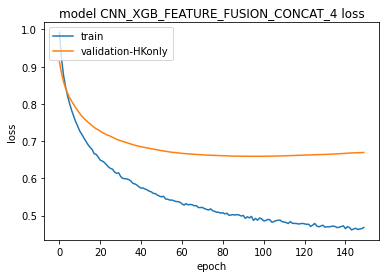

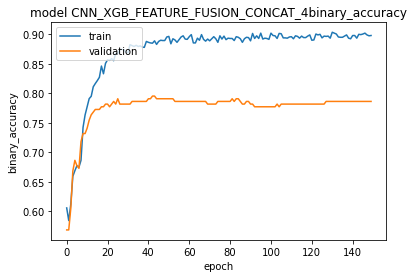

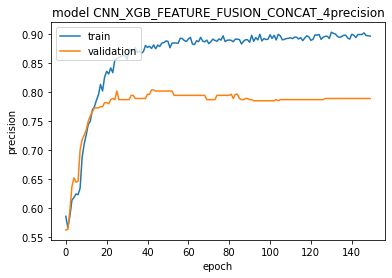

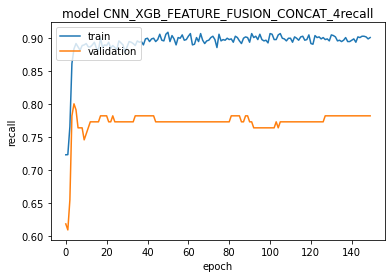

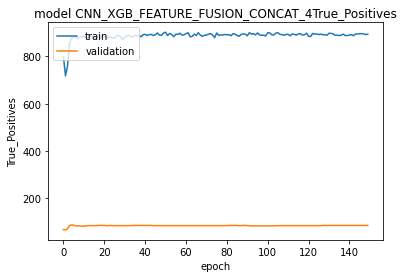

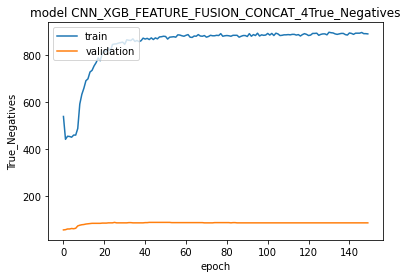

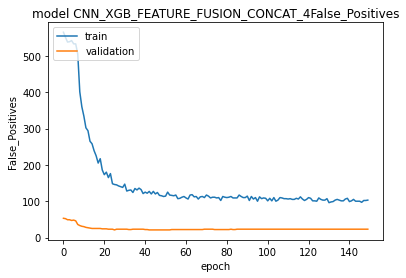

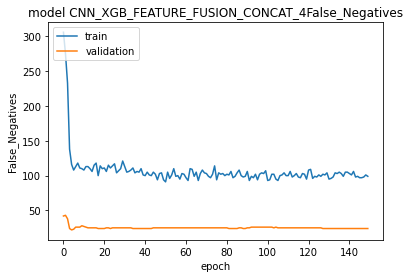

4/4 [==============================] - 9s 74ms/step - loss: 0.6828 - binary_accuracy: 0.7955 - precision: 0.8037 - recall: 0.7818 - True_Positives: 86.0000 - True_Negatives: 89.0000 - False_Positives: 21.0000 - False_Negatives: 24.0000
      MILD  SEVERE
0      1.0     0.0
24     0.0     1.0
28     1.0     0.0
41     1.0     0.0
43     1.0     0.0
...    ...     ...
1064   1.0     0.0
1069   1.0     0.0
1076   0.0     1.0
1091   1.0     0.0
1093   0.0     1.0

[110 rows x 2 columns]
      Prognosis
0             0
24            1
28            0
41            0
43            0
...         ...
1064          0
1069          0
1076          1
1091          0
1093          1

[110 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.745
[[0.3899753  0.6100247 ]
 [0.279783   0.720217  ]
 [0.8926477  0.10735234]
 [0.7699896  0.23001039]
 [0.02651858 0.9734814 ]
 [0.5934341  0.40656593]
 [0.06561226 0.93438774]
 [0.4171611  0.5828389 ]
 [0.02756864 0.97243136]
 [0.7601752  0.2398248 ]
 [0.09271938 0.9072806 ]
 [0.04382056 0.95617944]
 [0.05133235 0.94866765]
 [0.5653213  0.4346787 ]
 [0.4496845  0.5503155 ]
 [0.16845167 0.83154833]
 [0.8509774  0.14902256]
 [0.20062506 0.79937494]
 [0.66085297 0.33914703]
 [0.4519847  0.5480153 ]
 [0.784676   0.215324  ]
 [0.91321105 0.08678893]
 [0.7087748  0.2912252 ]
 [0.7674279  0.23257211]
 [0.06948477 0.9305152 ]
 [0.23059791 0.7694021 ]
 [0.44232965 0.55767035]
 [0.91235006 0.08764993]
 [0.7181406  0.28185937]
 [0.5568211  0.44317886]
 [0.03499919 0.9650008 ]
 [0.27339065 0.72660935]
 [0.8361411  0.16385888]
 [0.16353267 0.8364673 ]
 [0.23290902 0.767091  ]
 [0.11589813 0.88410187]
 [0.23487508 0.7651249 ]
 [0.5573319  0.44266808]
 [0.4396776  0.5603224 ]
 [0.45192

100%|██████████| 110/110 [00:05<00:00, 19.11it/s]


4/4 [==============================] - 3s 82ms/step - loss: 0.9209 - binary_accuracy: 0.7636 - precision: 0.7636 - recall: 0.7636 - True_Positives: 84.0000 - True_Negatives: 84.0000 - False_Positives: 26.0000 - False_Negatives: 26.0000
[0.9208768606185913, 0.7636363506317139, 0.7636363506317139, 0.7636363506317139, 84.0, 84.0, 26.0, 26.0]
Epoch 1/150
32/32 [==============================] - ETA: 0s - loss: 0.9272 - binary_accuracy: 0.4728 - precision: 0.4727 - recall: 0.4705 - True_Positives: 519.0000 - True_Negatives: 524.0000 - False_Positives: 579.0000 - False_Negatives: 584.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.59091, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


32/32 [==============================] - 26s 379ms/step - loss: 0.9272 - binary_accuracy: 0.4728 - precision: 0.4727 - recall: 0.4705 - True_Positives: 519.0000 - True_Negatives: 524.0000 - False_Positives: 579.0000 - False_Negatives: 584.0000 - val_loss: 0.8724 - val_binary_accuracy: 0.5909 - val_precision: 0.6429 - val_recall: 0.4091 - val_True_Positives: 45.0000 - val_True_Negatives: 85.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 65.0000
Epoch 2/150
32/32 [==============================] - ETA: 0s - loss: 0.8380 - binary_accuracy: 0.6470 - precision: 0.7062 - recall: 0.5035 - True_Positives: 500.0000 - True_Negatives: 785.0000 - False_Positives: 208.0000 - False_Negatives: 493.0000
Epoch 2: val_binary_accuracy improved from 0.59091 to 0.63636, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


32/32 [==============================] - 10s 326ms/step - loss: 0.8380 - binary_accuracy: 0.6470 - precision: 0.7062 - recall: 0.5035 - True_Positives: 500.0000 - True_Negatives: 785.0000 - False_Positives: 208.0000 - False_Negatives: 493.0000 - val_loss: 0.8315 - val_binary_accuracy: 0.6364 - val_precision: 0.6923 - val_recall: 0.4909 - val_True_Positives: 54.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 56.0000
Epoch 3/150
32/32 [==============================] - ETA: 0s - loss: 0.7803 - binary_accuracy: 0.7759 - precision: 0.8416 - recall: 0.6798 - True_Positives: 675.0000 - True_Negatives: 866.0000 - False_Positives: 127.0000 - False_Negatives: 318.0000
Epoch 3: val_binary_accuracy improved from 0.63636 to 0.72273, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


32/32 [==============================] - 9s 284ms/step - loss: 0.7803 - binary_accuracy: 0.7759 - precision: 0.8416 - recall: 0.6798 - True_Positives: 675.0000 - True_Negatives: 866.0000 - False_Positives: 127.0000 - False_Negatives: 318.0000 - val_loss: 0.8061 - val_binary_accuracy: 0.7227 - val_precision: 0.7426 - val_recall: 0.6818 - val_True_Positives: 75.0000 - val_True_Negatives: 84.0000 - val_False_Positives: 26.0000 - val_False_Negatives: 35.0000
Epoch 4/150
32/32 [==============================] - ETA: 0s - loss: 0.7411 - binary_accuracy: 0.8238 - precision: 0.8608 - recall: 0.7724 - True_Positives: 767.0000 - True_Negatives: 869.0000 - False_Positives: 124.0000 - False_Negatives: 226.0000
Epoch 4: val_binary_accuracy improved from 0.72273 to 0.75455, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


32/32 [==============================] - 8s 256ms/step - loss: 0.7411 - binary_accuracy: 0.8238 - precision: 0.8608 - recall: 0.7724 - True_Positives: 767.0000 - True_Negatives: 869.0000 - False_Positives: 124.0000 - False_Negatives: 226.0000 - val_loss: 0.7855 - val_binary_accuracy: 0.7545 - val_precision: 0.7692 - val_recall: 0.7273 - val_True_Positives: 80.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 30.0000
Epoch 5/150
32/32 [==============================] - ETA: 0s - loss: 0.7129 - binary_accuracy: 0.8333 - precision: 0.8621 - recall: 0.7936 - True_Positives: 788.0000 - True_Negatives: 867.0000 - False_Positives: 126.0000 - False_Negatives: 205.0000
Epoch 5: val_binary_accuracy improved from 0.75455 to 0.75909, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


32/32 [==============================] - 9s 276ms/step - loss: 0.7129 - binary_accuracy: 0.8333 - precision: 0.8621 - recall: 0.7936 - True_Positives: 788.0000 - True_Negatives: 867.0000 - False_Positives: 126.0000 - False_Negatives: 205.0000 - val_loss: 0.7702 - val_binary_accuracy: 0.7591 - val_precision: 0.7714 - val_recall: 0.7364 - val_True_Positives: 81.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 29.0000
Epoch 6/150
32/32 [==============================] - ETA: 0s - loss: 0.6902 - binary_accuracy: 0.8540 - precision: 0.8808 - recall: 0.8187 - True_Positives: 813.0000 - True_Negatives: 883.0000 - False_Positives: 110.0000 - False_Negatives: 180.0000
Epoch 6: val_binary_accuracy improved from 0.75909 to 0.76818, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


32/32 [==============================] - 8s 255ms/step - loss: 0.6902 - binary_accuracy: 0.8540 - precision: 0.8808 - recall: 0.8187 - True_Positives: 813.0000 - True_Negatives: 883.0000 - False_Positives: 110.0000 - False_Negatives: 180.0000 - val_loss: 0.7582 - val_binary_accuracy: 0.7682 - val_precision: 0.7810 - val_recall: 0.7455 - val_True_Positives: 82.0000 - val_True_Negatives: 87.0000 - val_False_Positives: 23.0000 - val_False_Negatives: 28.0000
Epoch 7/150
31/32 [============================>.] - ETA: 0s - loss: 0.6667 - binary_accuracy: 0.8624 - precision: 0.8812 - recall: 0.8377 - True_Positives: 831.0000 - True_Negatives: 880.0000 - False_Positives: 112.0000 - False_Negatives: 161.0000
Epoch 7: val_binary_accuracy did not improve from 0.76818
32/32 [==============================] - 1s 39ms/step - loss: 0.6666 - binary_accuracy: 0.8625 - precision: 0.8814 - recall: 0.8379 - True_Positives: 832.0000 - True_Negatives: 881.0000 - False_Positives: 112.0000 - False_Negatives: 1

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


32/32 [==============================] - 8s 272ms/step - loss: 0.5374 - binary_accuracy: 0.9063 - precision: 0.9130 - recall: 0.8983 - True_Positives: 892.0000 - True_Negatives: 908.0000 - False_Positives: 85.0000 - False_Negatives: 101.0000 - val_loss: 0.6919 - val_binary_accuracy: 0.7727 - val_precision: 0.7778 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 26.0000
Epoch 19/150
32/32 [==============================] - ETA: 0s - loss: 0.5308 - binary_accuracy: 0.9109 - precision: 0.9146 - recall: 0.9063 - True_Positives: 900.0000 - True_Negatives: 909.0000 - False_Positives: 84.0000 - False_Negatives: 93.0000
Epoch 19: val_binary_accuracy did not improve from 0.77273
32/32 [==============================] - 1s 39ms/step - loss: 0.5308 - binary_accuracy: 0.9109 - precision: 0.9146 - recall: 0.9063 - True_Positives: 900.0000 - True_Negatives: 909.0000 - False_Positives: 84.0000 - False_Negatives: 93.

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_5\assets


32/32 [==============================] - 8s 257ms/step - loss: 0.5142 - binary_accuracy: 0.8983 - precision: 0.9056 - recall: 0.8892 - True_Positives: 883.0000 - True_Negatives: 901.0000 - False_Positives: 92.0000 - False_Negatives: 110.0000 - val_loss: 0.6827 - val_binary_accuracy: 0.7773 - val_precision: 0.7850 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 87.0000 - val_False_Positives: 23.0000 - val_False_Negatives: 26.0000
Epoch 24/150
31/32 [============================>.] - ETA: 0s - loss: 0.5079 - binary_accuracy: 0.8982 - precision: 0.9039 - recall: 0.8911 - True_Positives: 884.0000 - True_Negatives: 898.0000 - False_Positives: 94.0000 - False_Negatives: 108.0000
Epoch 24: val_binary_accuracy did not improve from 0.77727
32/32 [==============================] - 1s 33ms/step - loss: 0.5079 - binary_accuracy: 0.8983 - precision: 0.9040 - recall: 0.8912 - True_Positives: 885.0000 - True_Negatives: 899.0000 - False_Positives: 94.0000 - False_Negatives: 10

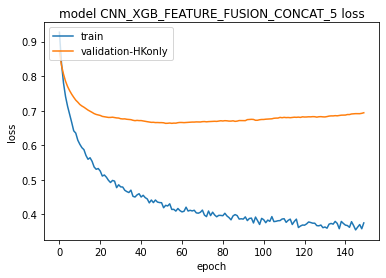

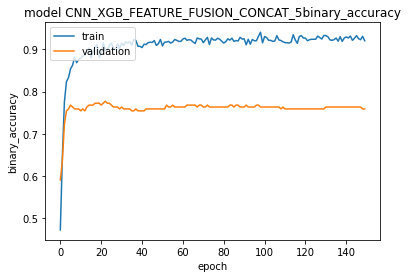

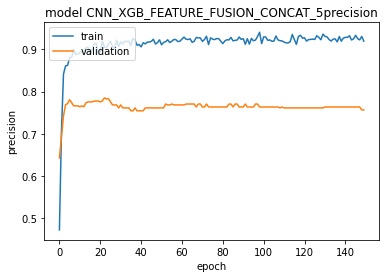

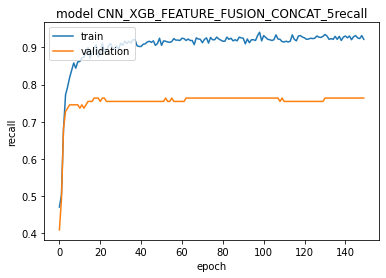

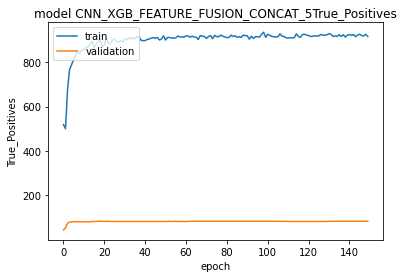

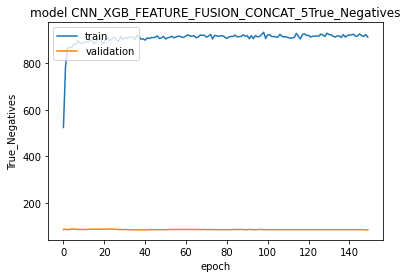

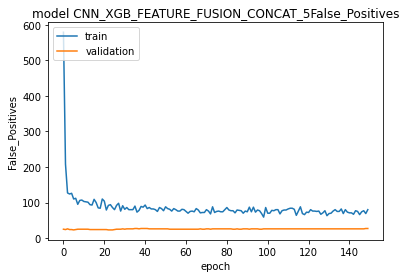

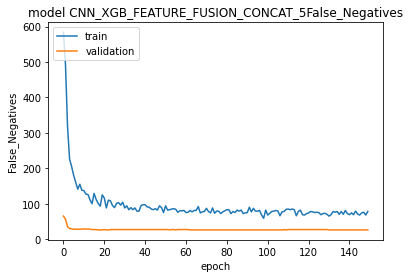

4/4 [==============================] - 3s 83ms/step - loss: 0.6827 - binary_accuracy: 0.7773 - precision: 0.7850 - recall: 0.7636 - True_Positives: 84.0000 - True_Negatives: 87.0000 - False_Positives: 23.0000 - False_Negatives: 26.0000
      MILD  SEVERE
11     0.0     1.0
15     0.0     1.0
18     1.0     0.0
22     0.0     1.0
42     0.0     1.0
...    ...     ...
1056   0.0     1.0
1059   1.0     0.0
1067   1.0     0.0
1070   0.0     1.0
1082   1.0     0.0

[110 rows x 2 columns]
      Prognosis
11            1
15            1
18            0
22            1
42            1
...         ...
1056          1
1059          0
1067          0
1070          1
1082          0

[110 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.773
[[0.9242919  0.07570808]
 [0.317487   0.682513  ]
 [0.7511815  0.2488185 ]
 [0.32447612 0.6755239 ]
 [0.27003622 0.7299638 ]
 [0.22919428 0.7708057 ]
 [0.61680615 0.38319382]
 [0.79202414 0.20797585]
 [0.39822245 0.60177755]
 [0.5874405  0.41255954]
 [0.5188622  0.4811378 ]
 [0.92288834 0.07711167]
 [0.07488835 0.92511165]
 [0.78925073 0.21074927]
 [0.9730667  0.02693333]
 [0.8326235  0.16737649]
 [0.9859888  0.01401121]
 [0.9819045  0.01809548]
 [0.9756867  0.02431327]
 [0.1192556  0.8807444 ]
 [0.01585704 0.98414296]
 [0.10028613 0.8997139 ]
 [0.7784358  0.22156419]
 [0.26992506 0.73007494]
 [0.11428487 0.8857151 ]
 [0.02502328 0.9749767 ]
 [0.4014716  0.5985284 ]
 [0.91828096 0.08171903]
 [0.71922505 0.28077495]
 [0.8520508  0.1479492 ]
 [0.82351255 0.17648742]
 [0.11007231 0.8899277 ]
 [0.9633485  0.03665146]
 [0.3178776  0.6821224 ]
 [0.33259755 0.66740245]
 [0.06113946 0.93886054]
 [0.9838594  0.01614059]
 [0.9404031  0.05959687]
 [0.8499548  0.1500452 ]
 [0.82300

100%|██████████| 110/110 [00:05<00:00, 19.10it/s]


4/4 [==============================] - 3s 57ms/step - loss: 0.8872 - binary_accuracy: 0.6545 - precision: 0.6545 - recall: 0.6545 - True_Positives: 72.0000 - True_Negatives: 72.0000 - False_Positives: 38.0000 - False_Negatives: 38.0000
[0.8871554136276245, 0.6545454263687134, 0.6545454263687134, 0.6545454263687134, 72.0, 72.0, 38.0, 38.0]
Epoch 1/150
32/32 [==============================] - ETA: 0s - loss: 0.6433 - binary_accuracy: 0.7298 - precision: 0.6554 - recall: 0.9692 - True_Positives: 1069.0000 - True_Negatives: 541.0000 - False_Positives: 562.0000 - False_Negatives: 34.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.71818, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


32/32 [==============================] - 28s 412ms/step - loss: 0.6433 - binary_accuracy: 0.7298 - precision: 0.6554 - recall: 0.9692 - True_Positives: 1069.0000 - True_Negatives: 541.0000 - False_Positives: 562.0000 - False_Negatives: 34.0000 - val_loss: 0.6828 - val_binary_accuracy: 0.7182 - val_precision: 0.6690 - val_recall: 0.8636 - val_True_Positives: 95.0000 - val_True_Negatives: 63.0000 - val_False_Positives: 47.0000 - val_False_Negatives: 15.0000
Epoch 2/150
31/32 [============================>.] - ETA: 0s - loss: 0.5792 - binary_accuracy: 0.8770 - precision: 0.8143 - recall: 0.9768 - True_Positives: 969.0000 - True_Negatives: 771.0000 - False_Positives: 221.0000 - False_Negatives: 23.0000
Epoch 2: val_binary_accuracy improved from 0.71818 to 0.74545, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


32/32 [==============================] - 12s 381ms/step - loss: 0.5792 - binary_accuracy: 0.8771 - precision: 0.8144 - recall: 0.9768 - True_Positives: 970.0000 - True_Negatives: 772.0000 - False_Positives: 221.0000 - False_Negatives: 23.0000 - val_loss: 0.6620 - val_binary_accuracy: 0.7455 - val_precision: 0.7077 - val_recall: 0.8364 - val_True_Positives: 92.0000 - val_True_Negatives: 72.0000 - val_False_Positives: 38.0000 - val_False_Negatives: 18.0000
Epoch 3/150
31/32 [============================>.] - ETA: 0s - loss: 0.5401 - binary_accuracy: 0.9057 - precision: 0.8662 - recall: 0.9597 - True_Positives: 952.0000 - True_Negatives: 845.0000 - False_Positives: 147.0000 - False_Negatives: 40.0000
Epoch 3: val_binary_accuracy improved from 0.74545 to 0.75455, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


32/32 [==============================] - 14s 444ms/step - loss: 0.5400 - binary_accuracy: 0.9058 - precision: 0.8664 - recall: 0.9597 - True_Positives: 953.0000 - True_Negatives: 846.0000 - False_Positives: 147.0000 - False_Negatives: 40.0000 - val_loss: 0.6506 - val_binary_accuracy: 0.7545 - val_precision: 0.7188 - val_recall: 0.8364 - val_True_Positives: 92.0000 - val_True_Negatives: 74.0000 - val_False_Positives: 36.0000 - val_False_Negatives: 18.0000
Epoch 4/150
31/32 [============================>.] - ETA: 0s - loss: 0.5208 - binary_accuracy: 0.9083 - precision: 0.8785 - recall: 0.9476 - True_Positives: 940.0000 - True_Negatives: 862.0000 - False_Positives: 130.0000 - False_Negatives: 52.0000
Epoch 4: val_binary_accuracy improved from 0.75455 to 0.77273, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


32/32 [==============================] - 8s 265ms/step - loss: 0.5208 - binary_accuracy: 0.9084 - precision: 0.8786 - recall: 0.9476 - True_Positives: 941.0000 - True_Negatives: 863.0000 - False_Positives: 130.0000 - False_Negatives: 52.0000 - val_loss: 0.6427 - val_binary_accuracy: 0.7727 - val_precision: 0.7500 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 80.0000 - val_False_Positives: 30.0000 - val_False_Negatives: 20.0000
Epoch 5/150
32/32 [==============================] - ETA: 0s - loss: 0.4979 - binary_accuracy: 0.9094 - precision: 0.8875 - recall: 0.9376 - True_Positives: 931.0000 - True_Negatives: 875.0000 - False_Positives: 118.0000 - False_Negatives: 62.0000
Epoch 5: val_binary_accuracy did not improve from 0.77273
32/32 [==============================] - 2s 46ms/step - loss: 0.4979 - binary_accuracy: 0.9094 - precision: 0.8875 - recall: 0.9376 - True_Positives: 931.0000 - True_Negatives: 875.0000 - False_Positives: 118.0000 - False_Negatives: 62.

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


32/32 [==============================] - 8s 256ms/step - loss: 0.4683 - binary_accuracy: 0.9124 - precision: 0.8972 - recall: 0.9315 - True_Positives: 925.0000 - True_Negatives: 887.0000 - False_Positives: 106.0000 - False_Negatives: 68.0000 - val_loss: 0.6293 - val_binary_accuracy: 0.7773 - val_precision: 0.7652 - val_recall: 0.8000 - val_True_Positives: 88.0000 - val_True_Negatives: 83.0000 - val_False_Positives: 27.0000 - val_False_Negatives: 22.0000
Epoch 8/150
32/32 [==============================] - ETA: 0s - loss: 0.4577 - binary_accuracy: 0.9164 - precision: 0.9066 - recall: 0.9285 - True_Positives: 922.0000 - True_Negatives: 898.0000 - False_Positives: 95.0000 - False_Negatives: 71.0000
Epoch 8: val_binary_accuracy improved from 0.77727 to 0.78182, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


32/32 [==============================] - 11s 338ms/step - loss: 0.4577 - binary_accuracy: 0.9164 - precision: 0.9066 - recall: 0.9285 - True_Positives: 922.0000 - True_Negatives: 898.0000 - False_Positives: 95.0000 - False_Negatives: 71.0000 - val_loss: 0.6262 - val_binary_accuracy: 0.7818 - val_precision: 0.7719 - val_recall: 0.8000 - val_True_Positives: 88.0000 - val_True_Negatives: 84.0000 - val_False_Positives: 26.0000 - val_False_Negatives: 22.0000
Epoch 9/150
32/32 [==============================] - ETA: 0s - loss: 0.4536 - binary_accuracy: 0.9053 - precision: 0.8942 - recall: 0.9194 - True_Positives: 913.0000 - True_Negatives: 885.0000 - False_Positives: 108.0000 - False_Negatives: 80.0000
Epoch 9: val_binary_accuracy did not improve from 0.78182
32/32 [==============================] - 1s 43ms/step - loss: 0.4536 - binary_accuracy: 0.9053 - precision: 0.8942 - recall: 0.9194 - True_Positives: 913.0000 - True_Negatives: 885.0000 - False_Positives: 108.0000 - False_Negatives: 80.

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_6\assets


32/32 [==============================] - 8s 244ms/step - loss: 0.4408 - binary_accuracy: 0.9129 - precision: 0.9012 - recall: 0.9275 - True_Positives: 921.0000 - True_Negatives: 892.0000 - False_Positives: 101.0000 - False_Negatives: 72.0000 - val_loss: 0.6227 - val_binary_accuracy: 0.7864 - val_precision: 0.7788 - val_recall: 0.8000 - val_True_Positives: 88.0000 - val_True_Negatives: 85.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 22.0000
Epoch 11/150
31/32 [============================>.] - ETA: 0s - loss: 0.4365 - binary_accuracy: 0.9133 - precision: 0.9043 - recall: 0.9244 - True_Positives: 917.0000 - True_Negatives: 895.0000 - False_Positives: 97.0000 - False_Negatives: 75.0000
Epoch 11: val_binary_accuracy did not improve from 0.78636
32/32 [==============================] - 1s 43ms/step - loss: 0.4365 - binary_accuracy: 0.9134 - precision: 0.9044 - recall: 0.9245 - True_Positives: 918.0000 - True_Negatives: 896.0000 - False_Positives: 97.0000 - False_Negatives: 75.

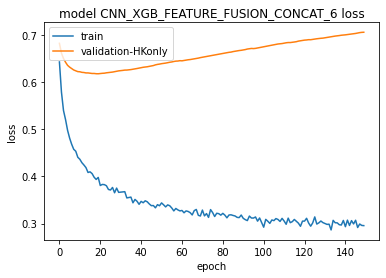

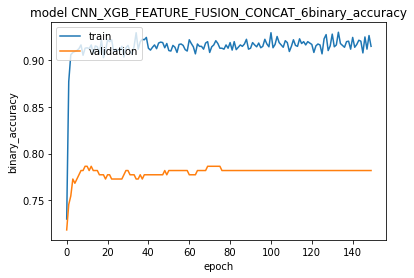

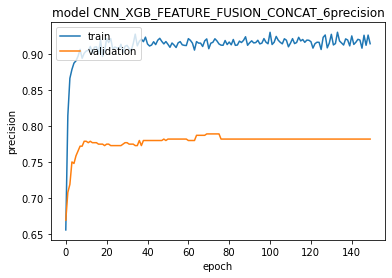

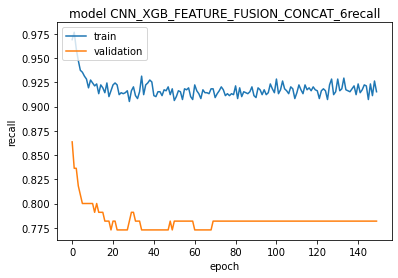

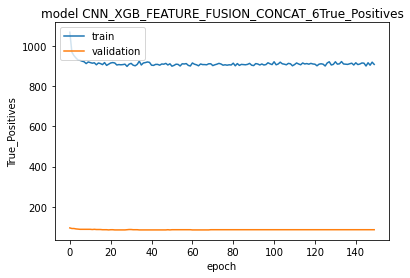

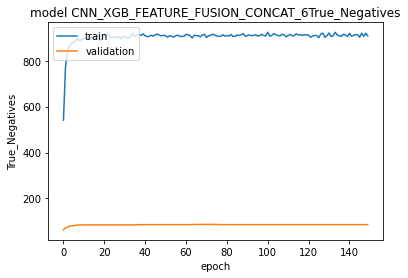

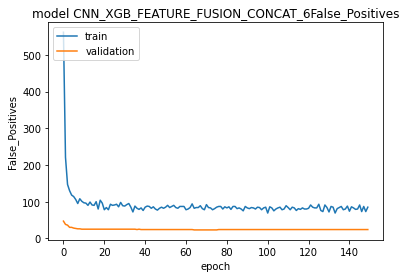

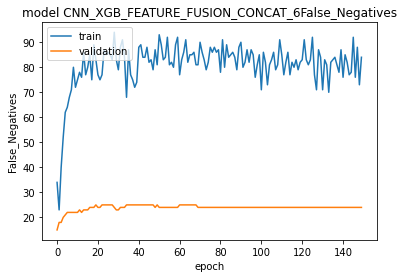

4/4 [==============================] - 3s 75ms/step - loss: 0.6227 - binary_accuracy: 0.7864 - precision: 0.7788 - recall: 0.8000 - True_Positives: 88.0000 - True_Negatives: 85.0000 - False_Positives: 25.0000 - False_Negatives: 22.0000
      MILD  SEVERE
16     1.0     0.0
17     0.0     1.0
19     1.0     0.0
26     1.0     0.0
37     0.0     1.0
...    ...     ...
1061   1.0     0.0
1074   0.0     1.0
1080   0.0     1.0
1085   0.0     1.0
1100   1.0     0.0

[110 rows x 2 columns]
      Prognosis
16            0
17            1
19            0
26            0
37            1
...         ...
1061          0
1074          1
1080          1
1085          1
1100          0

[110 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.764
[[0.6988534  0.3011466 ]
 [0.02180213 0.9781979 ]
 [0.36213988 0.6378601 ]
 [0.24420649 0.7557935 ]
 [0.09263474 0.90736526]
 [0.26628482 0.7337152 ]
 [0.31071317 0.6892868 ]
 [0.9541259  0.04587409]
 [0.5410148  0.45898518]
 [0.24006033 0.7599397 ]
 [0.03849733 0.9615027 ]
 [0.06984454 0.93015546]
 [0.71518224 0.28481776]
 [0.8914169  0.10858311]
 [0.9616055  0.03839452]
 [0.11615384 0.88384616]
 [0.7102455  0.28975454]
 [0.14822018 0.8517798 ]
 [0.13395894 0.86604106]
 [0.13419545 0.86580455]
 [0.96797466 0.03202534]
 [0.11775905 0.88224095]
 [0.80067855 0.19932146]
 [0.8297194  0.1702806 ]
 [0.25394702 0.746053  ]
 [0.25143862 0.7485614 ]
 [0.91111755 0.08888245]
 [0.15031075 0.84968925]
 [0.4978335  0.5021665 ]
 [0.9408964  0.05910358]
 [0.65258497 0.34741503]
 [0.60133815 0.39866188]
 [0.18258166 0.81741834]
 [0.54890674 0.45109326]
 [0.00959671 0.9904033 ]
 [0.7634372  0.2365628 ]
 [0.01877403 0.98122597]
 [0.80522954 0.19477046]
 [0.5953989  0.40460113]
 [0.00757

100%|██████████| 110/110 [00:05<00:00, 19.25it/s]


4/4 [==============================] - 3s 71ms/step - loss: 1.0727 - binary_accuracy: 0.6727 - precision: 0.6727 - recall: 0.6727 - True_Positives: 74.0000 - True_Negatives: 74.0000 - False_Positives: 36.0000 - False_Negatives: 36.0000
[1.0727260112762451, 0.6727272868156433, 0.6727272868156433, 0.6727272868156433, 74.0, 74.0, 36.0, 36.0]
Epoch 1/150
31/32 [============================>.] - ETA: 0s - loss: 0.9124 - binary_accuracy: 0.3362 - precision: 0.2065 - recall: 0.1152 - True_Positives: 127.0000 - True_Negatives: 614.0000 - False_Positives: 488.0000 - False_Negatives: 975.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.37727, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 26s 385ms/step - loss: 0.9125 - binary_accuracy: 0.3359 - precision: 0.2062 - recall: 0.1151 - True_Positives: 127.0000 - True_Negatives: 614.0000 - False_Positives: 489.0000 - False_Negatives: 976.0000 - val_loss: 0.8130 - val_binary_accuracy: 0.3773 - val_precision: 0.2923 - val_recall: 0.1727 - val_True_Positives: 19.0000 - val_True_Negatives: 64.0000 - val_False_Positives: 46.0000 - val_False_Negatives: 91.0000
Epoch 2/150
32/32 [==============================] - ETA: 0s - loss: 0.8184 - binary_accuracy: 0.3011 - precision: 0.0734 - recall: 0.0342 - True_Positives: 34.0000 - True_Negatives: 564.0000 - False_Positives: 429.0000 - False_Negatives: 959.0000
Epoch 2: val_binary_accuracy improved from 0.37727 to 0.39545, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 11s 348ms/step - loss: 0.8184 - binary_accuracy: 0.3011 - precision: 0.0734 - recall: 0.0342 - True_Positives: 34.0000 - True_Negatives: 564.0000 - False_Positives: 429.0000 - False_Negatives: 959.0000 - val_loss: 0.7674 - val_binary_accuracy: 0.3955 - val_precision: 0.2745 - val_recall: 0.1273 - val_True_Positives: 14.0000 - val_True_Negatives: 73.0000 - val_False_Positives: 37.0000 - val_False_Negatives: 96.0000
Epoch 3/150
32/32 [==============================] - ETA: 0s - loss: 0.7595 - binary_accuracy: 0.3807 - precision: 0.1165 - recall: 0.0363 - True_Positives: 36.0000 - True_Negatives: 720.0000 - False_Positives: 273.0000 - False_Negatives: 957.0000
Epoch 3: val_binary_accuracy improved from 0.39545 to 0.47727, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 11s 347ms/step - loss: 0.7595 - binary_accuracy: 0.3807 - precision: 0.1165 - recall: 0.0363 - True_Positives: 36.0000 - True_Negatives: 720.0000 - False_Positives: 273.0000 - False_Negatives: 957.0000 - val_loss: 0.7393 - val_binary_accuracy: 0.4773 - val_precision: 0.4074 - val_recall: 0.1000 - val_True_Positives: 11.0000 - val_True_Negatives: 94.0000 - val_False_Positives: 16.0000 - val_False_Negatives: 99.0000
Epoch 4/150
31/32 [============================>.] - ETA: 0s - loss: 0.7188 - binary_accuracy: 0.5862 - precision: 0.6887 - recall: 0.3145 - True_Positives: 312.0000 - True_Negatives: 851.0000 - False_Positives: 141.0000 - False_Negatives: 680.0000
Epoch 4: val_binary_accuracy improved from 0.47727 to 0.63182, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 10s 310ms/step - loss: 0.7188 - binary_accuracy: 0.5866 - precision: 0.6894 - recall: 0.3152 - True_Positives: 313.0000 - True_Negatives: 852.0000 - False_Positives: 141.0000 - False_Negatives: 680.0000 - val_loss: 0.7188 - val_binary_accuracy: 0.6318 - val_precision: 0.6835 - val_recall: 0.4909 - val_True_Positives: 54.0000 - val_True_Negatives: 85.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 56.0000
Epoch 5/150
32/32 [==============================] - ETA: 0s - loss: 0.6845 - binary_accuracy: 0.7513 - precision: 0.8422 - recall: 0.6183 - True_Positives: 614.0000 - True_Negatives: 878.0000 - False_Positives: 115.0000 - False_Negatives: 379.0000
Epoch 5: val_binary_accuracy improved from 0.63182 to 0.65000, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 8s 241ms/step - loss: 0.6845 - binary_accuracy: 0.7513 - precision: 0.8422 - recall: 0.6183 - True_Positives: 614.0000 - True_Negatives: 878.0000 - False_Positives: 115.0000 - False_Negatives: 379.0000 - val_loss: 0.7034 - val_binary_accuracy: 0.6500 - val_precision: 0.6813 - val_recall: 0.5636 - val_True_Positives: 62.0000 - val_True_Negatives: 81.0000 - val_False_Positives: 29.0000 - val_False_Negatives: 48.0000
Epoch 6/150
32/32 [==============================] - ETA: 0s - loss: 0.6570 - binary_accuracy: 0.7900 - precision: 0.8591 - recall: 0.6939 - True_Positives: 689.0000 - True_Negatives: 880.0000 - False_Positives: 113.0000 - False_Negatives: 304.0000
Epoch 6: val_binary_accuracy improved from 0.65000 to 0.66364, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 8s 266ms/step - loss: 0.6570 - binary_accuracy: 0.7900 - precision: 0.8591 - recall: 0.6939 - True_Positives: 689.0000 - True_Negatives: 880.0000 - False_Positives: 113.0000 - False_Negatives: 304.0000 - val_loss: 0.6921 - val_binary_accuracy: 0.6636 - val_precision: 0.6915 - val_recall: 0.5909 - val_True_Positives: 65.0000 - val_True_Negatives: 81.0000 - val_False_Positives: 29.0000 - val_False_Negatives: 45.0000
Epoch 7/150
32/32 [==============================] - ETA: 0s - loss: 0.6337 - binary_accuracy: 0.8132 - precision: 0.8694 - recall: 0.7372 - True_Positives: 732.0000 - True_Negatives: 883.0000 - False_Positives: 110.0000 - False_Negatives: 261.0000
Epoch 7: val_binary_accuracy improved from 0.66364 to 0.68636, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 8s 240ms/step - loss: 0.6337 - binary_accuracy: 0.8132 - precision: 0.8694 - recall: 0.7372 - True_Positives: 732.0000 - True_Negatives: 883.0000 - False_Positives: 110.0000 - False_Negatives: 261.0000 - val_loss: 0.6820 - val_binary_accuracy: 0.6864 - val_precision: 0.7071 - val_recall: 0.6364 - val_True_Positives: 70.0000 - val_True_Negatives: 81.0000 - val_False_Positives: 29.0000 - val_False_Negatives: 40.0000
Epoch 8/150
32/32 [==============================] - ETA: 0s - loss: 0.6163 - binary_accuracy: 0.8162 - precision: 0.8593 - recall: 0.7563 - True_Positives: 751.0000 - True_Negatives: 870.0000 - False_Positives: 123.0000 - False_Negatives: 242.0000
Epoch 8: val_binary_accuracy did not improve from 0.68636
32/32 [==============================] - 1s 39ms/step - loss: 0.6163 - binary_accuracy: 0.8162 - precision: 0.8593 - recall: 0.7563 - True_Positives: 751.0000 - True_Negatives: 870.0000 - False_Positives: 123.0000 - False_Negatives: 2

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 8s 264ms/step - loss: 0.4907 - binary_accuracy: 0.8590 - precision: 0.8687 - recall: 0.8459 - True_Positives: 840.0000 - True_Negatives: 866.0000 - False_Positives: 127.0000 - False_Negatives: 153.0000 - val_loss: 0.6362 - val_binary_accuracy: 0.6909 - val_precision: 0.6944 - val_recall: 0.6818 - val_True_Positives: 75.0000 - val_True_Negatives: 77.0000 - val_False_Positives: 33.0000 - val_False_Negatives: 35.0000
Epoch 20/150
32/32 [==============================] - ETA: 0s - loss: 0.4807 - binary_accuracy: 0.8711 - precision: 0.8772 - recall: 0.8630 - True_Positives: 857.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives: 136.0000
Epoch 20: val_binary_accuracy did not improve from 0.69091
32/32 [==============================] - 1s 43ms/step - loss: 0.4807 - binary_accuracy: 0.8711 - precision: 0.8772 - recall: 0.8630 - True_Positives: 857.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 8s 245ms/step - loss: 0.4259 - binary_accuracy: 0.8721 - precision: 0.8782 - recall: 0.8640 - True_Positives: 858.0000 - True_Negatives: 874.0000 - False_Positives: 119.0000 - False_Negatives: 135.0000 - val_loss: 0.6300 - val_binary_accuracy: 0.6955 - val_precision: 0.6972 - val_recall: 0.6909 - val_True_Positives: 76.0000 - val_True_Negatives: 77.0000 - val_False_Positives: 33.0000 - val_False_Negatives: 34.0000
Epoch 33/150
31/32 [============================>.] - ETA: 0s - loss: 0.4157 - binary_accuracy: 0.8775 - precision: 0.8802 - recall: 0.8740 - True_Positives: 867.0000 - True_Negatives: 874.0000 - False_Positives: 118.0000 - False_Negatives: 125.0000
Epoch 33: val_binary_accuracy did not improve from 0.69545
32/32 [==============================] - 1s 39ms/step - loss: 0.4155 - binary_accuracy: 0.8776 - precision: 0.8803 - recall: 0.8741 - True_Positives: 868.0000 - True_Negatives: 875.0000 - False_Positives: 118.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 8s 265ms/step - loss: 0.4038 - binary_accuracy: 0.8892 - precision: 0.8908 - recall: 0.8872 - True_Positives: 881.0000 - True_Negatives: 885.0000 - False_Positives: 108.0000 - False_Negatives: 112.0000 - val_loss: 0.6337 - val_binary_accuracy: 0.7000 - val_precision: 0.7037 - val_recall: 0.6909 - val_True_Positives: 76.0000 - val_True_Negatives: 78.0000 - val_False_Positives: 32.0000 - val_False_Negatives: 34.0000
Epoch 39/150
32/32 [==============================] - ETA: 0s - loss: 0.3951 - binary_accuracy: 0.8897 - precision: 0.8917 - recall: 0.8872 - True_Positives: 881.0000 - True_Negatives: 886.0000 - False_Positives: 107.0000 - False_Negatives: 112.0000
Epoch 39: val_binary_accuracy did not improve from 0.70000
32/32 [==============================] - 1s 36ms/step - loss: 0.3951 - binary_accuracy: 0.8897 - precision: 0.8917 - recall: 0.8872 - True_Positives: 881.0000 - True_Negatives: 886.0000 - False_Positives: 107.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 7s 236ms/step - loss: 0.3950 - binary_accuracy: 0.8842 - precision: 0.8873 - recall: 0.8802 - True_Positives: 874.0000 - True_Negatives: 882.0000 - False_Positives: 111.0000 - False_Negatives: 119.0000 - val_loss: 0.6357 - val_binary_accuracy: 0.7045 - val_precision: 0.7064 - val_recall: 0.7000 - val_True_Positives: 77.0000 - val_True_Negatives: 78.0000 - val_False_Positives: 32.0000 - val_False_Negatives: 33.0000
Epoch 43/150
32/32 [==============================] - ETA: 0s - loss: 0.3901 - binary_accuracy: 0.8832 - precision: 0.8863 - recall: 0.8792 - True_Positives: 873.0000 - True_Negatives: 881.0000 - False_Positives: 112.0000 - False_Negatives: 120.0000
Epoch 43: val_binary_accuracy did not improve from 0.70455
32/32 [==============================] - 1s 36ms/step - loss: 0.3901 - binary_accuracy: 0.8832 - precision: 0.8863 - recall: 0.8792 - True_Positives: 873.0000 - True_Negatives: 881.0000 - False_Positives: 112.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 8s 270ms/step - loss: 0.3845 - binary_accuracy: 0.8862 - precision: 0.8886 - recall: 0.8832 - True_Positives: 877.0000 - True_Negatives: 883.0000 - False_Positives: 110.0000 - False_Negatives: 116.0000 - val_loss: 0.6372 - val_binary_accuracy: 0.7136 - val_precision: 0.7117 - val_recall: 0.7182 - val_True_Positives: 79.0000 - val_True_Negatives: 78.0000 - val_False_Positives: 32.0000 - val_False_Negatives: 31.0000
Epoch 45/150
31/32 [============================>.] - ETA: 0s - loss: 0.3841 - binary_accuracy: 0.8831 - precision: 0.8870 - recall: 0.8780 - True_Positives: 871.0000 - True_Negatives: 881.0000 - False_Positives: 111.0000 - False_Negatives: 121.0000
Epoch 45: val_binary_accuracy did not improve from 0.71364
32/32 [==============================] - 1s 43ms/step - loss: 0.3839 - binary_accuracy: 0.8832 - precision: 0.8871 - recall: 0.8781 - True_Positives: 872.0000 - True_Negatives: 882.0000 - False_Positives: 111.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 7s 239ms/step - loss: 0.3696 - binary_accuracy: 0.8938 - precision: 0.8949 - recall: 0.8922 - True_Positives: 886.0000 - True_Negatives: 889.0000 - False_Positives: 104.0000 - False_Negatives: 107.0000 - val_loss: 0.6390 - val_binary_accuracy: 0.7182 - val_precision: 0.7222 - val_recall: 0.7091 - val_True_Positives: 78.0000 - val_True_Negatives: 80.0000 - val_False_Positives: 30.0000 - val_False_Negatives: 32.0000
Epoch 51/150
31/32 [============================>.] - ETA: 0s - loss: 0.3713 - binary_accuracy: 0.8921 - precision: 0.8929 - recall: 0.8911 - True_Positives: 884.0000 - True_Negatives: 886.0000 - False_Positives: 106.0000 - False_Negatives: 108.0000
Epoch 51: val_binary_accuracy did not improve from 0.71818
32/32 [==============================] - 1s 41ms/step - loss: 0.3717 - binary_accuracy: 0.8912 - precision: 0.8920 - recall: 0.8902 - True_Positives: 884.0000 - True_Negatives: 886.0000 - False_Positives: 107.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 9s 280ms/step - loss: 0.3696 - binary_accuracy: 0.8872 - precision: 0.8864 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 880.0000 - False_Positives: 113.0000 - False_Negatives: 111.0000 - val_loss: 0.6426 - val_binary_accuracy: 0.7227 - val_precision: 0.7248 - val_recall: 0.7182 - val_True_Positives: 79.0000 - val_True_Negatives: 80.0000 - val_False_Positives: 30.0000 - val_False_Negatives: 31.0000
Epoch 53/150
31/32 [============================>.] - ETA: 0s - loss: 0.3648 - binary_accuracy: 0.8851 - precision: 0.8866 - recall: 0.8831 - True_Positives: 876.0000 - True_Negatives: 880.0000 - False_Positives: 112.0000 - False_Negatives: 116.0000
Epoch 53: val_binary_accuracy did not improve from 0.72273
32/32 [==============================] - 1s 44ms/step - loss: 0.3649 - binary_accuracy: 0.8852 - precision: 0.8868 - recall: 0.8832 - True_Positives: 877.0000 - True_Negatives: 881.0000 - False_Positives: 112.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 7s 238ms/step - loss: 0.3658 - binary_accuracy: 0.8837 - precision: 0.8841 - recall: 0.8832 - True_Positives: 877.0000 - True_Negatives: 878.0000 - False_Positives: 115.0000 - False_Negatives: 116.0000 - val_loss: 0.6461 - val_binary_accuracy: 0.7273 - val_precision: 0.7273 - val_recall: 0.7273 - val_True_Positives: 80.0000 - val_True_Negatives: 80.0000 - val_False_Positives: 30.0000 - val_False_Negatives: 30.0000
Epoch 55/150
32/32 [==============================] - ETA: 0s - loss: 0.3686 - binary_accuracy: 0.8756 - precision: 0.8783 - recall: 0.8721 - True_Positives: 866.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives: 127.0000
Epoch 55: val_binary_accuracy did not improve from 0.72727
32/32 [==============================] - 1s 41ms/step - loss: 0.3686 - binary_accuracy: 0.8756 - precision: 0.8783 - recall: 0.8721 - True_Positives: 866.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 8s 247ms/step - loss: 0.3540 - binary_accuracy: 0.9013 - precision: 0.9013 - recall: 0.9013 - True_Positives: 895.0000 - True_Negatives: 895.0000 - False_Positives: 98.0000 - False_Negatives: 98.0000 - val_loss: 0.6483 - val_binary_accuracy: 0.7318 - val_precision: 0.7297 - val_recall: 0.7364 - val_True_Positives: 81.0000 - val_True_Negatives: 80.0000 - val_False_Positives: 30.0000 - val_False_Negatives: 29.0000
Epoch 61/150
31/32 [============================>.] - ETA: 0s - loss: 0.3519 - binary_accuracy: 0.8962 - precision: 0.8970 - recall: 0.8952 - True_Positives: 888.0000 - True_Negatives: 890.0000 - False_Positives: 102.0000 - False_Negatives: 104.0000
Epoch 61: val_binary_accuracy did not improve from 0.73182
32/32 [==============================] - 1s 42ms/step - loss: 0.3517 - binary_accuracy: 0.8963 - precision: 0.8971 - recall: 0.8953 - True_Positives: 889.0000 - True_Negatives: 891.0000 - False_Positives: 102.0000 - False_Negatives: 1

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_7\assets


32/32 [==============================] - 9s 295ms/step - loss: 0.3451 - binary_accuracy: 0.8867 - precision: 0.8871 - recall: 0.8862 - True_Positives: 880.0000 - True_Negatives: 881.0000 - False_Positives: 112.0000 - False_Negatives: 113.0000 - val_loss: 0.6578 - val_binary_accuracy: 0.7364 - val_precision: 0.7364 - val_recall: 0.7364 - val_True_Positives: 81.0000 - val_True_Negatives: 81.0000 - val_False_Positives: 29.0000 - val_False_Negatives: 29.0000
Epoch 71/150
31/32 [============================>.] - ETA: 0s - loss: 0.3435 - binary_accuracy: 0.8881 - precision: 0.8881 - recall: 0.8881 - True_Positives: 881.0000 - True_Negatives: 881.0000 - False_Positives: 111.0000 - False_Negatives: 111.0000
Epoch 71: val_binary_accuracy did not improve from 0.73636
32/32 [==============================] - 1s 39ms/step - loss: 0.3433 - binary_accuracy: 0.8882 - precision: 0.8882 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 882.0000 - False_Positives: 111.0000 - False_Negatives:

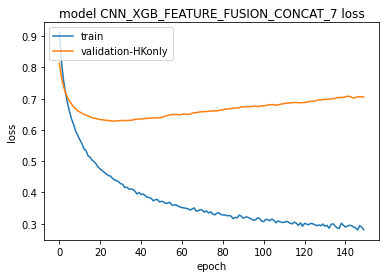

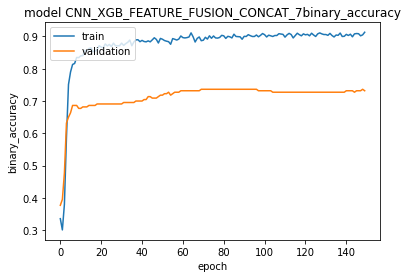

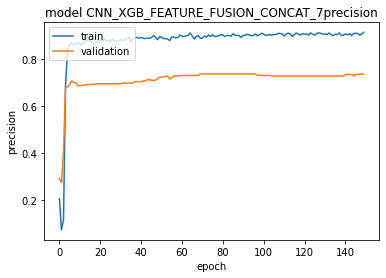

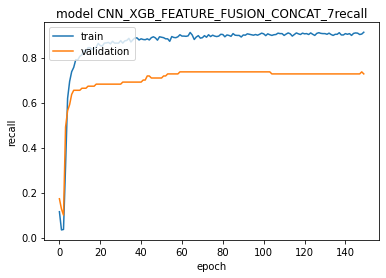

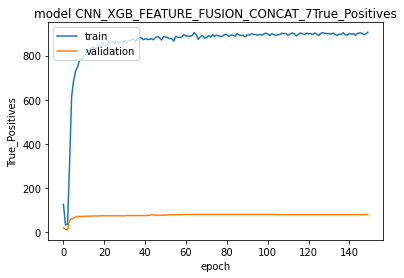

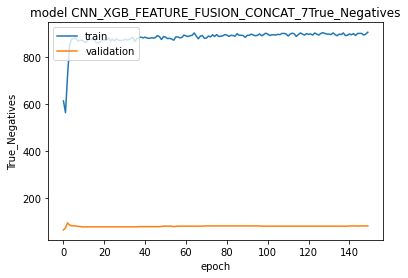

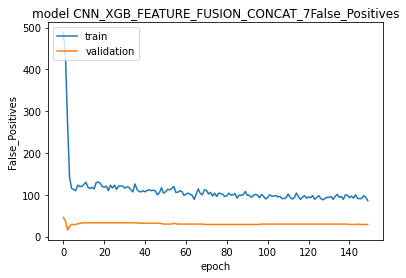

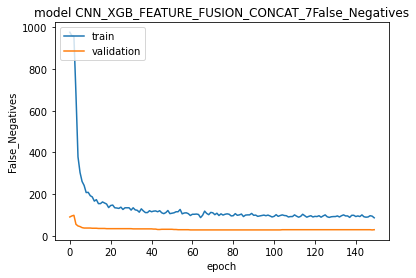

4/4 [==============================] - 9s 63ms/step - loss: 0.6578 - binary_accuracy: 0.7364 - precision: 0.7364 - recall: 0.7364 - True_Positives: 81.0000 - True_Negatives: 81.0000 - False_Positives: 29.0000 - False_Negatives: 29.0000
      MILD  SEVERE
8      1.0     0.0
36     0.0     1.0
52     1.0     0.0
53     1.0     0.0
103    0.0     1.0
...    ...     ...
1086   1.0     0.0
1087   1.0     0.0
1088   1.0     0.0
1094   1.0     0.0
1102   0.0     1.0

[110 rows x 2 columns]
      Prognosis
8             0
36            1
52            0
53            0
103           1
...         ...
1086          0
1087          0
1088          0
1094          0
1102          1

[110 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.745
[[0.96783584 0.03216415]
 [0.51544    0.48456   ]
 [0.8522108  0.14778917]
 [0.82547736 0.17452264]
 [0.10360116 0.89639884]
 [0.0271259  0.9728741 ]
 [0.67833316 0.32166684]
 [0.09294659 0.9070534 ]
 [0.08905077 0.91094923]
 [0.9028427  0.09715728]
 [0.5826287  0.41737124]
 [0.91725945 0.08274053]
 [0.9686214  0.03137862]
 [0.93140924 0.06859078]
 [0.9484992  0.05150077]
 [0.15081531 0.8491847 ]
 [0.24904358 0.7509564 ]
 [0.10458106 0.89541894]
 [0.08819854 0.91180146]
 [0.43558395 0.56441605]
 [0.15847772 0.8415223 ]
 [0.1960116  0.8039884 ]
 [0.59273326 0.40726677]
 [0.6202345  0.3797655 ]
 [0.1207239  0.8792761 ]
 [0.23753083 0.7624692 ]
 [0.0136435  0.9863565 ]
 [0.295893   0.704107  ]
 [0.02002209 0.9799779 ]
 [0.04947621 0.9505238 ]
 [0.19998056 0.80001944]
 [0.04707783 0.95292217]
 [0.61766624 0.38233376]
 [0.23513144 0.76486856]
 [0.05689698 0.943103  ]
 [0.14118743 0.8588126 ]
 [0.01198173 0.9880183 ]
 [0.7861462  0.21385379]
 [0.8205869  0.1794131 ]
 [0.11844

100%|██████████| 110/110 [00:06<00:00, 17.99it/s]


4/4 [==============================] - 3s 51ms/step - loss: 0.8141 - binary_accuracy: 0.7273 - precision: 0.7273 - recall: 0.7273 - True_Positives: 80.0000 - True_Negatives: 80.0000 - False_Positives: 30.0000 - False_Negatives: 30.0000
[0.8140503168106079, 0.7272727489471436, 0.7272727489471436, 0.7272727489471436, 80.0, 80.0, 30.0, 30.0]
Epoch 1/150
32/32 [==============================] - ETA: 0s - loss: 1.0579 - binary_accuracy: 0.5231 - precision: 0.5122 - recall: 0.9728 - True_Positives: 1073.0000 - True_Negatives: 81.0000 - False_Positives: 1022.0000 - False_Negatives: 30.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.50000, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 26s 387ms/step - loss: 1.0579 - binary_accuracy: 0.5231 - precision: 0.5122 - recall: 0.9728 - True_Positives: 1073.0000 - True_Negatives: 81.0000 - False_Positives: 1022.0000 - False_Negatives: 30.0000 - val_loss: 0.9844 - val_binary_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 1.0000 - val_True_Positives: 110.0000 - val_True_Negatives: 0.0000e+00 - val_False_Positives: 110.0000 - val_False_Negatives: 0.0000e+00
Epoch 2/150
31/32 [============================>.] - ETA: 0s - loss: 0.9408 - binary_accuracy: 0.5000 - precision: 0.5000 - recall: 1.0000 - True_Positives: 992.0000 - True_Negatives: 0.0000e+00 - False_Positives: 992.0000 - False_Negatives: 0.0000e+00
Epoch 2: val_binary_accuracy did not improve from 0.50000
32/32 [==============================] - 2s 45ms/step - loss: 0.9408 - binary_accuracy: 0.5000 - precision: 0.5000 - recall: 1.0000 - True_Positives: 993.0000 - True_Negatives: 0.0000e+00 - False_Positives: 993.0000 - Fal

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 10s 321ms/step - loss: 0.7985 - binary_accuracy: 0.5076 - precision: 0.5038 - recall: 1.0000 - True_Positives: 993.0000 - True_Negatives: 15.0000 - False_Positives: 978.0000 - False_Negatives: 0.0000e+00 - val_loss: 0.8090 - val_binary_accuracy: 0.5136 - val_precision: 0.5070 - val_recall: 0.9909 - val_True_Positives: 109.0000 - val_True_Negatives: 4.0000 - val_False_Positives: 106.0000 - val_False_Negatives: 1.0000
Epoch 6/150
31/32 [============================>.] - ETA: 0s - loss: 0.7704 - binary_accuracy: 0.5832 - precision: 0.5454 - recall: 0.9990 - True_Positives: 991.0000 - True_Negatives: 166.0000 - False_Positives: 826.0000 - False_Negatives: 1.0000    
Epoch 6: val_binary_accuracy improved from 0.51364 to 0.55000, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 9s 273ms/step - loss: 0.7705 - binary_accuracy: 0.5831 - precision: 0.5454 - recall: 0.9990 - True_Positives: 992.0000 - True_Negatives: 166.0000 - False_Positives: 827.0000 - False_Negatives: 1.0000 - val_loss: 0.7896 - val_binary_accuracy: 0.5500 - val_precision: 0.5268 - val_recall: 0.9818 - val_True_Positives: 108.0000 - val_True_Negatives: 13.0000 - val_False_Positives: 97.0000 - val_False_Negatives: 2.0000
Epoch 7/150
31/32 [============================>.] - ETA: 0s - loss: 0.7471 - binary_accuracy: 0.6673 - precision: 0.6009 - recall: 0.9970 - True_Positives: 989.0000 - True_Negatives: 335.0000 - False_Positives: 657.0000 - False_Negatives: 3.0000
Epoch 7: val_binary_accuracy improved from 0.55000 to 0.65455, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 8s 252ms/step - loss: 0.7470 - binary_accuracy: 0.6677 - precision: 0.6011 - recall: 0.9970 - True_Positives: 990.0000 - True_Negatives: 336.0000 - False_Positives: 657.0000 - False_Negatives: 3.0000 - val_loss: 0.7752 - val_binary_accuracy: 0.6545 - val_precision: 0.5977 - val_recall: 0.9455 - val_True_Positives: 104.0000 - val_True_Negatives: 40.0000 - val_False_Positives: 70.0000 - val_False_Negatives: 6.0000
Epoch 8/150
31/32 [============================>.] - ETA: 0s - loss: 0.7276 - binary_accuracy: 0.7510 - precision: 0.6696 - recall: 0.9909 - True_Positives: 983.0000 - True_Negatives: 507.0000 - False_Positives: 485.0000 - False_Negatives: 9.0000
Epoch 8: val_binary_accuracy improved from 0.65455 to 0.72273, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 9s 274ms/step - loss: 0.7276 - binary_accuracy: 0.7513 - precision: 0.6698 - recall: 0.9909 - True_Positives: 984.0000 - True_Negatives: 508.0000 - False_Positives: 485.0000 - False_Negatives: 9.0000 - val_loss: 0.7612 - val_binary_accuracy: 0.7227 - val_precision: 0.6644 - val_recall: 0.9000 - val_True_Positives: 99.0000 - val_True_Negatives: 60.0000 - val_False_Positives: 50.0000 - val_False_Negatives: 11.0000
Epoch 9/150
31/32 [============================>.] - ETA: 0s - loss: 0.7089 - binary_accuracy: 0.8080 - precision: 0.7278 - recall: 0.9839 - True_Positives: 976.0000 - True_Negatives: 627.0000 - False_Positives: 365.0000 - False_Negatives: 16.0000
Epoch 9: val_binary_accuracy improved from 0.72273 to 0.73636, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 8s 251ms/step - loss: 0.7090 - binary_accuracy: 0.8077 - precision: 0.7275 - recall: 0.9839 - True_Positives: 977.0000 - True_Negatives: 627.0000 - False_Positives: 366.0000 - False_Negatives: 16.0000 - val_loss: 0.7490 - val_binary_accuracy: 0.7364 - val_precision: 0.6831 - val_recall: 0.8818 - val_True_Positives: 97.0000 - val_True_Negatives: 65.0000 - val_False_Positives: 45.0000 - val_False_Negatives: 13.0000
Epoch 10/150
32/32 [==============================] - ETA: 0s - loss: 0.6934 - binary_accuracy: 0.8419 - precision: 0.7671 - recall: 0.9819 - True_Positives: 975.0000 - True_Negatives: 697.0000 - False_Positives: 296.0000 - False_Negatives: 18.0000
Epoch 10: val_binary_accuracy did not improve from 0.73636
32/32 [==============================] - 1s 41ms/step - loss: 0.6934 - binary_accuracy: 0.8419 - precision: 0.7671 - recall: 0.9819 - True_Positives: 975.0000 - True_Negatives: 697.0000 - False_Positives: 296.0000 - False_Negatives: 1

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 9s 274ms/step - loss: 0.6207 - binary_accuracy: 0.8872 - precision: 0.8505 - recall: 0.9396 - True_Positives: 933.0000 - True_Negatives: 829.0000 - False_Positives: 164.0000 - False_Negatives: 60.0000 - val_loss: 0.6940 - val_binary_accuracy: 0.7409 - val_precision: 0.7227 - val_recall: 0.7818 - val_True_Positives: 86.0000 - val_True_Negatives: 77.0000 - val_False_Positives: 33.0000 - val_False_Negatives: 24.0000
Epoch 18/150
31/32 [============================>.] - ETA: 0s - loss: 0.6112 - binary_accuracy: 0.8916 - precision: 0.8627 - recall: 0.9315 - True_Positives: 924.0000 - True_Negatives: 845.0000 - False_Positives: 147.0000 - False_Negatives: 68.0000
Epoch 18: val_binary_accuracy improved from 0.74091 to 0.74545, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 8s 249ms/step - loss: 0.6114 - binary_accuracy: 0.8917 - precision: 0.8629 - recall: 0.9315 - True_Positives: 925.0000 - True_Negatives: 846.0000 - False_Positives: 147.0000 - False_Negatives: 68.0000 - val_loss: 0.6899 - val_binary_accuracy: 0.7455 - val_precision: 0.7288 - val_recall: 0.7818 - val_True_Positives: 86.0000 - val_True_Negatives: 78.0000 - val_False_Positives: 32.0000 - val_False_Negatives: 24.0000
Epoch 19/150
32/32 [==============================] - ETA: 0s - loss: 0.6029 - binary_accuracy: 0.8907 - precision: 0.8633 - recall: 0.9285 - True_Positives: 922.0000 - True_Negatives: 847.0000 - False_Positives: 146.0000 - False_Negatives: 71.0000
Epoch 19: val_binary_accuracy did not improve from 0.74545
32/32 [==============================] - 1s 39ms/step - loss: 0.6029 - binary_accuracy: 0.8907 - precision: 0.8633 - recall: 0.9285 - True_Positives: 922.0000 - True_Negatives: 847.0000 - False_Positives: 146.0000 - False_Negatives: 7

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 8s 272ms/step - loss: 0.6011 - binary_accuracy: 0.8897 - precision: 0.8644 - recall: 0.9245 - True_Positives: 918.0000 - True_Negatives: 849.0000 - False_Positives: 144.0000 - False_Negatives: 75.0000 - val_loss: 0.6824 - val_binary_accuracy: 0.7500 - val_precision: 0.7434 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 81.0000 - val_False_Positives: 29.0000 - val_False_Negatives: 26.0000
Epoch 21/150
31/32 [============================>.] - ETA: 0s - loss: 0.5930 - binary_accuracy: 0.8866 - precision: 0.8649 - recall: 0.9163 - True_Positives: 909.0000 - True_Negatives: 850.0000 - False_Positives: 142.0000 - False_Negatives: 83.0000
Epoch 21: val_binary_accuracy did not improve from 0.75000
32/32 [==============================] - 1s 35ms/step - loss: 0.5928 - binary_accuracy: 0.8867 - precision: 0.8650 - recall: 0.9164 - True_Positives: 910.0000 - True_Negatives: 851.0000 - False_Positives: 142.0000 - False_Negatives: 8

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 8s 246ms/step - loss: 0.5606 - binary_accuracy: 0.8892 - precision: 0.8742 - recall: 0.9094 - True_Positives: 903.0000 - True_Negatives: 863.0000 - False_Positives: 130.0000 - False_Negatives: 90.0000 - val_loss: 0.6668 - val_binary_accuracy: 0.7545 - val_precision: 0.7500 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 82.0000 - val_False_Positives: 28.0000 - val_False_Negatives: 26.0000
Epoch 29/150
32/32 [==============================] - ETA: 0s - loss: 0.5502 - binary_accuracy: 0.8897 - precision: 0.8765 - recall: 0.9074 - True_Positives: 901.0000 - True_Negatives: 866.0000 - False_Positives: 127.0000 - False_Negatives: 92.0000
Epoch 29: val_binary_accuracy did not improve from 0.75455
32/32 [==============================] - 1s 42ms/step - loss: 0.5502 - binary_accuracy: 0.8897 - precision: 0.8765 - recall: 0.9074 - True_Positives: 901.0000 - True_Negatives: 866.0000 - False_Positives: 127.0000 - False_Negatives: 9

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_8\assets


32/32 [==============================] - 10s 326ms/step - loss: 0.5195 - binary_accuracy: 0.8912 - precision: 0.8828 - recall: 0.9023 - True_Positives: 896.0000 - True_Negatives: 874.0000 - False_Positives: 119.0000 - False_Negatives: 97.0000 - val_loss: 0.6568 - val_binary_accuracy: 0.7591 - val_precision: 0.7568 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 83.0000 - val_False_Positives: 27.0000 - val_False_Negatives: 26.0000
Epoch 40/150
32/32 [==============================] - ETA: 0s - loss: 0.5151 - binary_accuracy: 0.8943 - precision: 0.8842 - recall: 0.9074 - True_Positives: 901.0000 - True_Negatives: 875.0000 - False_Positives: 118.0000 - False_Negatives: 92.0000
Epoch 40: val_binary_accuracy did not improve from 0.75909
32/32 [==============================] - 1s 44ms/step - loss: 0.5151 - binary_accuracy: 0.8943 - precision: 0.8842 - recall: 0.9074 - True_Positives: 901.0000 - True_Negatives: 875.0000 - False_Positives: 118.0000 - False_Negatives: 

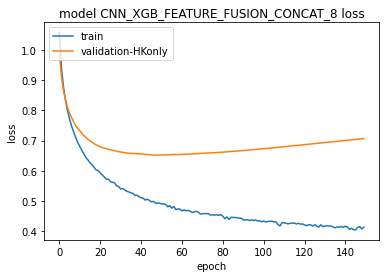

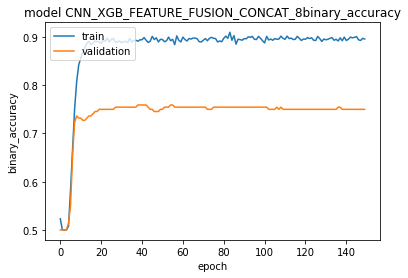

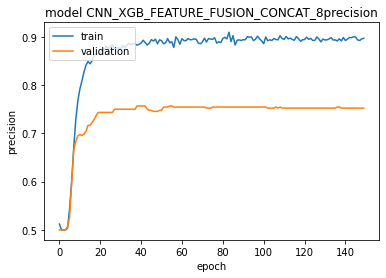

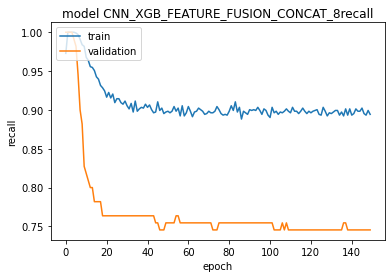

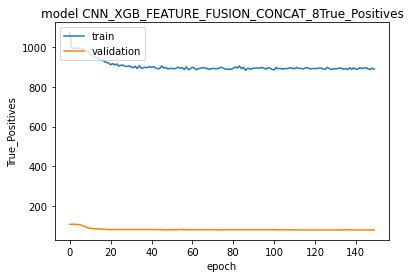

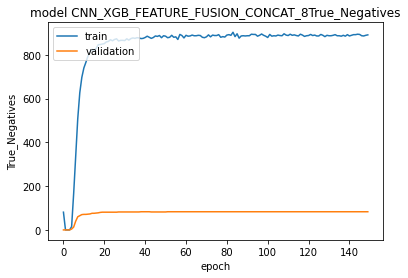

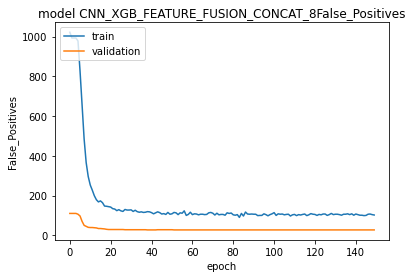

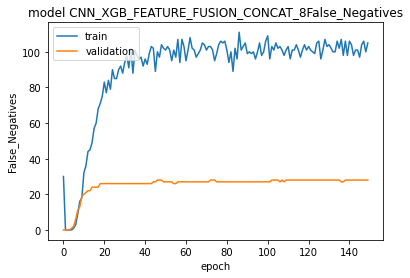

4/4 [==============================] - 3s 83ms/step - loss: 0.6568 - binary_accuracy: 0.7591 - precision: 0.7568 - recall: 0.7636 - True_Positives: 84.0000 - True_Negatives: 83.0000 - False_Positives: 27.0000 - False_Negatives: 26.0000
      MILD  SEVERE
1      1.0     0.0
4      0.0     1.0
35     1.0     0.0
80     0.0     1.0
85     1.0     0.0
...    ...     ...
1052   1.0     0.0
1075   0.0     1.0
1078   0.0     1.0
1090   1.0     0.0
1097   0.0     1.0

[110 rows x 2 columns]
      Prognosis
1             0
4             1
35            0
80            1
85            0
...         ...
1052          0
1075          1
1078          1
1090          0
1097          1

[110 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.755
[[0.84342694 0.15657303]
 [0.47558153 0.5244185 ]
 [0.04264456 0.95735544]
 [0.03555685 0.96444315]
 [0.8485281  0.1514719 ]
 [0.4478342  0.5521658 ]
 [0.89220166 0.10779833]
 [0.8549854  0.14501458]
 [0.70434743 0.29565257]
 [0.8738475  0.12615252]
 [0.14756823 0.8524318 ]
 [0.34952134 0.65047866]
 [0.7496664  0.2503336 ]
 [0.19804925 0.80195075]
 [0.01098192 0.9890181 ]
 [0.42831177 0.57168823]
 [0.01486731 0.9851327 ]
 [0.86282283 0.13717715]
 [0.19763148 0.8023685 ]
 [0.4687091  0.5312909 ]
 [0.470904   0.529096  ]
 [0.75970674 0.2402933 ]
 [0.06273752 0.9372625 ]
 [0.63735425 0.36264575]
 [0.3525923  0.6474077 ]
 [0.6029165  0.3970835 ]
 [0.30864573 0.6913543 ]
 [0.5106922  0.48930782]
 [0.9905998  0.00940017]
 [0.6509813  0.3490187 ]
 [0.51185536 0.48814467]
 [0.61499226 0.3850077 ]
 [0.04892641 0.9510736 ]
 [0.7089304  0.2910696 ]
 [0.44019258 0.5598074 ]
 [0.19249213 0.8075079 ]
 [0.04620945 0.95379055]
 [0.82937574 0.17062429]
 [0.6750716  0.3249284 ]
 [0.26436

100%|██████████| 110/110 [00:06<00:00, 17.72it/s]


4/4 [==============================] - 3s 74ms/step - loss: 0.8137 - binary_accuracy: 0.7636 - precision: 0.7636 - recall: 0.7636 - True_Positives: 84.0000 - True_Negatives: 84.0000 - False_Positives: 26.0000 - False_Negatives: 26.0000
[0.813656210899353, 0.7636363506317139, 0.7636363506317139, 0.7636363506317139, 84.0, 84.0, 26.0, 26.0]
Epoch 1/150
32/32 [==============================] - ETA: 0s - loss: 0.8716 - binary_accuracy: 0.5503 - precision: 0.5272 - recall: 0.9746 - True_Positives: 1075.0000 - True_Negatives: 139.0000 - False_Positives: 964.0000 - False_Negatives: 28.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.62273, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 28s 383ms/step - loss: 0.8716 - binary_accuracy: 0.5503 - precision: 0.5272 - recall: 0.9746 - True_Positives: 1075.0000 - True_Negatives: 139.0000 - False_Positives: 964.0000 - False_Negatives: 28.0000 - val_loss: 0.8527 - val_binary_accuracy: 0.6227 - val_precision: 0.5707 - val_recall: 0.9909 - val_True_Positives: 109.0000 - val_True_Negatives: 28.0000 - val_False_Positives: 82.0000 - val_False_Negatives: 1.0000
Epoch 2/150
32/32 [==============================] - ETA: 0s - loss: 0.7988 - binary_accuracy: 0.6672 - precision: 0.6020 - recall: 0.9869 - True_Positives: 980.0000 - True_Negatives: 345.0000 - False_Positives: 648.0000 - False_Negatives: 13.0000
Epoch 2: val_binary_accuracy improved from 0.62273 to 0.63182, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 10s 300ms/step - loss: 0.7988 - binary_accuracy: 0.6672 - precision: 0.6020 - recall: 0.9869 - True_Positives: 980.0000 - True_Negatives: 345.0000 - False_Positives: 648.0000 - False_Negatives: 13.0000 - val_loss: 0.8102 - val_binary_accuracy: 0.6318 - val_precision: 0.5858 - val_recall: 0.9000 - val_True_Positives: 99.0000 - val_True_Negatives: 40.0000 - val_False_Positives: 70.0000 - val_False_Negatives: 11.0000
Epoch 3/150
32/32 [==============================] - ETA: 0s - loss: 0.7563 - binary_accuracy: 0.6838 - precision: 0.6154 - recall: 0.9799 - True_Positives: 973.0000 - True_Negatives: 385.0000 - False_Positives: 608.0000 - False_Negatives: 20.0000
Epoch 3: val_binary_accuracy improved from 0.63182 to 0.67273, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 12s 383ms/step - loss: 0.7563 - binary_accuracy: 0.6838 - precision: 0.6154 - recall: 0.9799 - True_Positives: 973.0000 - True_Negatives: 385.0000 - False_Positives: 608.0000 - False_Negatives: 20.0000 - val_loss: 0.7808 - val_binary_accuracy: 0.6727 - val_precision: 0.6234 - val_recall: 0.8727 - val_True_Positives: 96.0000 - val_True_Negatives: 52.0000 - val_False_Positives: 58.0000 - val_False_Negatives: 14.0000
Epoch 4/150
32/32 [==============================] - ETA: 0s - loss: 0.7266 - binary_accuracy: 0.7885 - precision: 0.7105 - recall: 0.9738 - True_Positives: 967.0000 - True_Negatives: 599.0000 - False_Positives: 394.0000 - False_Negatives: 26.0000
Epoch 4: val_binary_accuracy improved from 0.67273 to 0.71818, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 10s 314ms/step - loss: 0.7266 - binary_accuracy: 0.7885 - precision: 0.7105 - recall: 0.9738 - True_Positives: 967.0000 - True_Negatives: 599.0000 - False_Positives: 394.0000 - False_Negatives: 26.0000 - val_loss: 0.7608 - val_binary_accuracy: 0.7182 - val_precision: 0.6714 - val_recall: 0.8545 - val_True_Positives: 94.0000 - val_True_Negatives: 64.0000 - val_False_Positives: 46.0000 - val_False_Negatives: 16.0000
Epoch 5/150
31/32 [============================>.] - ETA: 0s - loss: 0.7070 - binary_accuracy: 0.8478 - precision: 0.7842 - recall: 0.9597 - True_Positives: 952.0000 - True_Negatives: 730.0000 - False_Positives: 262.0000 - False_Negatives: 40.0000
Epoch 5: val_binary_accuracy improved from 0.71818 to 0.73182, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 8s 258ms/step - loss: 0.7070 - binary_accuracy: 0.8479 - precision: 0.7844 - recall: 0.9597 - True_Positives: 953.0000 - True_Negatives: 731.0000 - False_Positives: 262.0000 - False_Negatives: 40.0000 - val_loss: 0.7482 - val_binary_accuracy: 0.7318 - val_precision: 0.6977 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 71.0000 - val_False_Positives: 39.0000 - val_False_Negatives: 20.0000
Epoch 6/150
31/32 [============================>.] - ETA: 0s - loss: 0.6871 - binary_accuracy: 0.8695 - precision: 0.8195 - recall: 0.9476 - True_Positives: 940.0000 - True_Negatives: 785.0000 - False_Positives: 207.0000 - False_Negatives: 52.0000
Epoch 6: val_binary_accuracy improved from 0.73182 to 0.73636, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 9s 294ms/step - loss: 0.6870 - binary_accuracy: 0.8696 - precision: 0.8197 - recall: 0.9476 - True_Positives: 941.0000 - True_Negatives: 786.0000 - False_Positives: 207.0000 - False_Negatives: 52.0000 - val_loss: 0.7372 - val_binary_accuracy: 0.7364 - val_precision: 0.7031 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 72.0000 - val_False_Positives: 38.0000 - val_False_Negatives: 20.0000
Epoch 7/150
31/32 [============================>.] - ETA: 0s - loss: 0.6739 - binary_accuracy: 0.8760 - precision: 0.8366 - recall: 0.9345 - True_Positives: 927.0000 - True_Negatives: 811.0000 - False_Positives: 181.0000 - False_Negatives: 65.0000
Epoch 7: val_binary_accuracy improved from 0.73636 to 0.74545, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 8s 258ms/step - loss: 0.6738 - binary_accuracy: 0.8761 - precision: 0.8368 - recall: 0.9345 - True_Positives: 928.0000 - True_Negatives: 812.0000 - False_Positives: 181.0000 - False_Negatives: 65.0000 - val_loss: 0.7276 - val_binary_accuracy: 0.7455 - val_precision: 0.7143 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 74.0000 - val_False_Positives: 36.0000 - val_False_Negatives: 20.0000
Epoch 8/150
31/32 [============================>.] - ETA: 0s - loss: 0.6607 - binary_accuracy: 0.8841 - precision: 0.8515 - recall: 0.9304 - True_Positives: 923.0000 - True_Negatives: 831.0000 - False_Positives: 161.0000 - False_Negatives: 69.0000
Epoch 8: val_binary_accuracy improved from 0.74545 to 0.77273, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 9s 276ms/step - loss: 0.6606 - binary_accuracy: 0.8842 - precision: 0.8516 - recall: 0.9305 - True_Positives: 924.0000 - True_Negatives: 832.0000 - False_Positives: 161.0000 - False_Negatives: 69.0000 - val_loss: 0.7182 - val_binary_accuracy: 0.7727 - val_precision: 0.7500 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 80.0000 - val_False_Positives: 30.0000 - val_False_Negatives: 20.0000
Epoch 9/150
32/32 [==============================] - ETA: 0s - loss: 0.6494 - binary_accuracy: 0.8882 - precision: 0.8593 - recall: 0.9285 - True_Positives: 922.0000 - True_Negatives: 842.0000 - False_Positives: 151.0000 - False_Negatives: 71.0000
Epoch 9: val_binary_accuracy improved from 0.77273 to 0.77727, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 8s 249ms/step - loss: 0.6494 - binary_accuracy: 0.8882 - precision: 0.8593 - recall: 0.9285 - True_Positives: 922.0000 - True_Negatives: 842.0000 - False_Positives: 151.0000 - False_Negatives: 71.0000 - val_loss: 0.7100 - val_binary_accuracy: 0.7773 - val_precision: 0.7563 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 81.0000 - val_False_Positives: 29.0000 - val_False_Negatives: 20.0000
Epoch 10/150
31/32 [============================>.] - ETA: 0s - loss: 0.6388 - binary_accuracy: 0.8921 - precision: 0.8677 - recall: 0.9254 - True_Positives: 918.0000 - True_Negatives: 852.0000 - False_Positives: 140.0000 - False_Negatives: 74.0000
Epoch 10: val_binary_accuracy did not improve from 0.77727
32/32 [==============================] - 1s 41ms/step - loss: 0.6389 - binary_accuracy: 0.8922 - precision: 0.8678 - recall: 0.9255 - True_Positives: 919.0000 - True_Negatives: 853.0000 - False_Positives: 140.0000 - False_Negatives: 7

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 8s 270ms/step - loss: 0.6268 - binary_accuracy: 0.8902 - precision: 0.8666 - recall: 0.9225 - True_Positives: 916.0000 - True_Negatives: 852.0000 - False_Positives: 141.0000 - False_Negatives: 77.0000 - val_loss: 0.6974 - val_binary_accuracy: 0.7864 - val_precision: 0.7692 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 83.0000 - val_False_Positives: 27.0000 - val_False_Negatives: 20.0000
Epoch 12/150
32/32 [==============================] - ETA: 0s - loss: 0.6228 - binary_accuracy: 0.8943 - precision: 0.8761 - recall: 0.9184 - True_Positives: 912.0000 - True_Negatives: 864.0000 - False_Positives: 129.0000 - False_Negatives: 81.0000
Epoch 12: val_binary_accuracy improved from 0.78636 to 0.79091, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 8s 244ms/step - loss: 0.6228 - binary_accuracy: 0.8943 - precision: 0.8761 - recall: 0.9184 - True_Positives: 912.0000 - True_Negatives: 864.0000 - False_Positives: 129.0000 - False_Negatives: 81.0000 - val_loss: 0.6919 - val_binary_accuracy: 0.7909 - val_precision: 0.7759 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 84.0000 - val_False_Positives: 26.0000 - val_False_Negatives: 20.0000
Epoch 13/150
32/32 [==============================] - ETA: 0s - loss: 0.6169 - binary_accuracy: 0.8922 - precision: 0.8771 - recall: 0.9124 - True_Positives: 906.0000 - True_Negatives: 866.0000 - False_Positives: 127.0000 - False_Negatives: 87.0000
Epoch 13: val_binary_accuracy improved from 0.79091 to 0.79545, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 9s 290ms/step - loss: 0.6169 - binary_accuracy: 0.8922 - precision: 0.8771 - recall: 0.9124 - True_Positives: 906.0000 - True_Negatives: 866.0000 - False_Positives: 127.0000 - False_Negatives: 87.0000 - val_loss: 0.6874 - val_binary_accuracy: 0.7955 - val_precision: 0.7826 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 85.0000 - val_False_Positives: 25.0000 - val_False_Negatives: 20.0000
Epoch 14/150
31/32 [============================>.] - ETA: 0s - loss: 0.6054 - binary_accuracy: 0.9037 - precision: 0.8892 - recall: 0.9224 - True_Positives: 915.0000 - True_Negatives: 878.0000 - False_Positives: 114.0000 - False_Negatives: 77.0000
Epoch 14: val_binary_accuracy did not improve from 0.79545
32/32 [==============================] - 2s 45ms/step - loss: 0.6057 - binary_accuracy: 0.9028 - precision: 0.8883 - recall: 0.9215 - True_Positives: 915.0000 - True_Negatives: 878.0000 - False_Positives: 115.0000 - False_Negatives: 7

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 8s 250ms/step - loss: 0.5986 - binary_accuracy: 0.8927 - precision: 0.8794 - recall: 0.9104 - True_Positives: 904.0000 - True_Negatives: 869.0000 - False_Positives: 124.0000 - False_Negatives: 89.0000 - val_loss: 0.6762 - val_binary_accuracy: 0.8000 - val_precision: 0.7895 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 86.0000 - val_False_Positives: 24.0000 - val_False_Negatives: 20.0000
Epoch 17/150
32/32 [==============================] - ETA: 0s - loss: 0.5898 - binary_accuracy: 0.8943 - precision: 0.8820 - recall: 0.9104 - True_Positives: 904.0000 - True_Negatives: 872.0000 - False_Positives: 121.0000 - False_Negatives: 89.0000
Epoch 17: val_binary_accuracy did not improve from 0.80000
32/32 [==============================] - 1s 43ms/step - loss: 0.5898 - binary_accuracy: 0.8943 - precision: 0.8820 - recall: 0.9104 - True_Positives: 904.0000 - True_Negatives: 872.0000 - False_Positives: 121.0000 - False_Negatives: 8

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_9\assets


32/32 [==============================] - 10s 318ms/step - loss: 0.5519 - binary_accuracy: 0.8973 - precision: 0.8910 - recall: 0.9053 - True_Positives: 899.0000 - True_Negatives: 883.0000 - False_Positives: 110.0000 - False_Negatives: 94.0000 - val_loss: 0.6592 - val_binary_accuracy: 0.8045 - val_precision: 0.7965 - val_recall: 0.8182 - val_True_Positives: 90.0000 - val_True_Negatives: 87.0000 - val_False_Positives: 23.0000 - val_False_Negatives: 20.0000
Epoch 26/150
32/32 [==============================] - ETA: 0s - loss: 0.5480 - binary_accuracy: 0.9038 - precision: 0.8986 - recall: 0.9104 - True_Positives: 904.0000 - True_Negatives: 891.0000 - False_Positives: 102.0000 - False_Negatives: 89.0000
Epoch 26: val_binary_accuracy did not improve from 0.80455
32/32 [==============================] - 1s 43ms/step - loss: 0.5480 - binary_accuracy: 0.9038 - precision: 0.8986 - recall: 0.9104 - True_Positives: 904.0000 - True_Negatives: 891.0000 - False_Positives: 102.0000 - False_Negatives: 

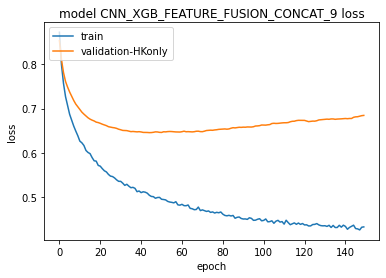

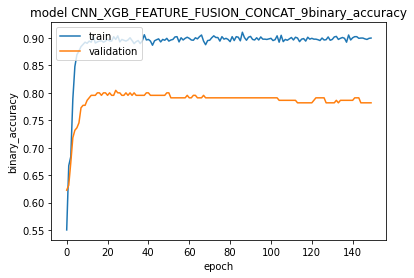

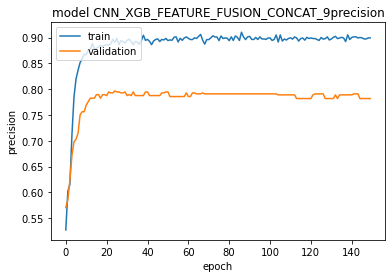

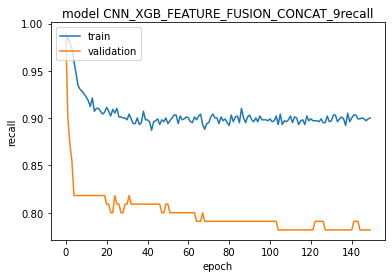

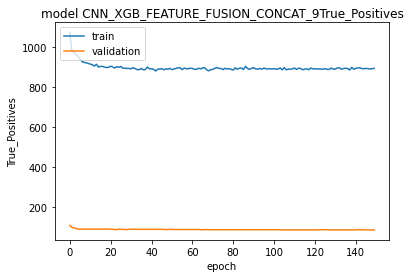

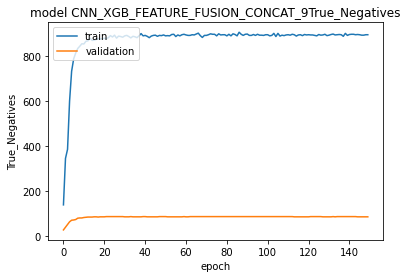

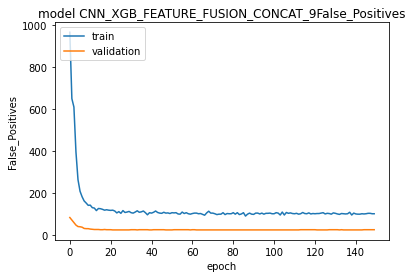

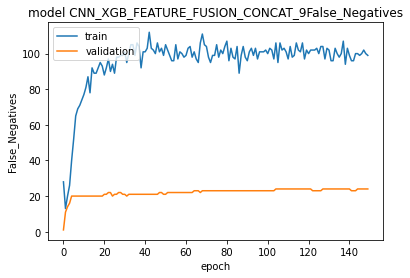

4/4 [==============================] - 3s 70ms/step - loss: 0.6592 - binary_accuracy: 0.8045 - precision: 0.7965 - recall: 0.8182 - True_Positives: 90.0000 - True_Negatives: 87.0000 - False_Positives: 23.0000 - False_Negatives: 20.0000
      MILD  SEVERE
13     1.0     0.0
14     1.0     0.0
20     0.0     1.0
21     1.0     0.0
27     0.0     1.0
...    ...     ...
1044   0.0     1.0
1077   1.0     0.0
1089   1.0     0.0
1095   1.0     0.0
1101   1.0     0.0

[110 rows x 2 columns]
      Prognosis
13            0
14            0
20            1
21            0
27            1
...         ...
1044          1
1077          0
1089          0
1095          0
1101          0

[110 rows x 1 columns]


C:\Users\Michele\AppData\Local\Temp/ipykernel_11608/4033450140.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db[col] = db[col].fillna(m)


Accuracy: 0.745
[[0.7187154  0.2812846 ]
 [0.5764214  0.4235786 ]
 [0.8156092  0.18439077]
 [0.85710967 0.14289035]
 [0.696486   0.303514  ]
 [0.5291482  0.4708518 ]
 [0.10010314 0.89989686]
 [0.48314917 0.5168508 ]
 [0.5760465  0.42395347]
 [0.75599754 0.24400248]
 [0.71342194 0.28657806]
 [0.05370039 0.9462996 ]
 [0.9066998  0.09330024]
 [0.08465451 0.9153455 ]
 [0.9504517  0.04954831]
 [0.9311916  0.06880835]
 [0.974536   0.02546398]
 [0.7932383  0.20676173]
 [0.47837687 0.52162313]
 [0.3621897  0.6378103 ]
 [0.58860797 0.41139203]
 [0.34627432 0.6537257 ]
 [0.19800442 0.8019956 ]
 [0.4005708  0.5994292 ]
 [0.88107693 0.11892308]
 [0.1886068  0.8113932 ]
 [0.8541468  0.1458532 ]
 [0.8803069  0.11969311]
 [0.7492931  0.25070688]
 [0.19095767 0.80904233]
 [0.7732375  0.22676247]
 [0.91376156 0.08623847]
 [0.16447997 0.83552   ]
 [0.20668465 0.79331535]
 [0.9687297  0.0312703 ]
 [0.09474176 0.90525824]
 [0.9171525  0.08284749]
 [0.09733427 0.90266573]
 [0.8685681  0.13143189]
 [0.19569

100%|██████████| 110/110 [00:06<00:00, 17.88it/s]


4/4 [==============================] - 3s 57ms/step - loss: 0.9401 - binary_accuracy: 0.7182 - precision: 0.7182 - recall: 0.7182 - True_Positives: 79.0000 - True_Negatives: 79.0000 - False_Positives: 31.0000 - False_Negatives: 31.0000
[0.9401414394378662, 0.7181817889213562, 0.7181817889213562, 0.7181817889213562, 79.0, 79.0, 31.0, 31.0]
Epoch 1/150
31/32 [============================>.] - ETA: 0s - loss: 0.7447 - binary_accuracy: 0.6642 - precision: 0.7793 - recall: 0.4583 - True_Positives: 505.0000 - True_Negatives: 959.0000 - False_Positives: 143.0000 - False_Negatives: 597.0000
Epoch 1: val_binary_accuracy improved from -inf to 0.63182, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 27s 347ms/step - loss: 0.7447 - binary_accuracy: 0.6641 - precision: 0.7793 - recall: 0.4578 - True_Positives: 505.0000 - True_Negatives: 960.0000 - False_Positives: 143.0000 - False_Negatives: 598.0000 - val_loss: 0.7407 - val_binary_accuracy: 0.6318 - val_precision: 0.7458 - val_recall: 0.4000 - val_True_Positives: 44.0000 - val_True_Negatives: 95.0000 - val_False_Positives: 15.0000 - val_False_Negatives: 66.0000
Epoch 2/150
32/32 [==============================] - ETA: 0s - loss: 0.6800 - binary_accuracy: 0.7946 - precision: 0.8528 - recall: 0.7120 - True_Positives: 707.0000 - True_Negatives: 871.0000 - False_Positives: 122.0000 - False_Negatives: 286.0000
Epoch 2: val_binary_accuracy improved from 0.63182 to 0.73636, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 9s 270ms/step - loss: 0.6800 - binary_accuracy: 0.7946 - precision: 0.8528 - recall: 0.7120 - True_Positives: 707.0000 - True_Negatives: 871.0000 - False_Positives: 122.0000 - False_Negatives: 286.0000 - val_loss: 0.7079 - val_binary_accuracy: 0.7364 - val_precision: 0.7955 - val_recall: 0.6364 - val_True_Positives: 70.0000 - val_True_Negatives: 92.0000 - val_False_Positives: 18.0000 - val_False_Negatives: 40.0000
Epoch 3/150
31/32 [============================>.] - ETA: 0s - loss: 0.6415 - binary_accuracy: 0.8432 - precision: 0.8573 - recall: 0.8236 - True_Positives: 817.0000 - True_Negatives: 856.0000 - False_Positives: 136.0000 - False_Negatives: 175.0000
Epoch 3: val_binary_accuracy improved from 0.73636 to 0.75455, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 9s 275ms/step - loss: 0.6413 - binary_accuracy: 0.8434 - precision: 0.8574 - recall: 0.8238 - True_Positives: 818.0000 - True_Negatives: 857.0000 - False_Positives: 136.0000 - False_Negatives: 175.0000 - val_loss: 0.6860 - val_binary_accuracy: 0.7545 - val_precision: 0.7979 - val_recall: 0.6818 - val_True_Positives: 75.0000 - val_True_Negatives: 91.0000 - val_False_Positives: 19.0000 - val_False_Negatives: 35.0000
Epoch 4/150
32/32 [==============================] - ETA: 0s - loss: 0.6119 - binary_accuracy: 0.8671 - precision: 0.8716 - recall: 0.8610 - True_Positives: 855.0000 - True_Negatives: 867.0000 - False_Positives: 126.0000 - False_Negatives: 138.0000
Epoch 4: val_binary_accuracy improved from 0.75455 to 0.76364, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 10s 307ms/step - loss: 0.6119 - binary_accuracy: 0.8671 - precision: 0.8716 - recall: 0.8610 - True_Positives: 855.0000 - True_Negatives: 867.0000 - False_Positives: 126.0000 - False_Negatives: 138.0000 - val_loss: 0.6721 - val_binary_accuracy: 0.7636 - val_precision: 0.8021 - val_recall: 0.7000 - val_True_Positives: 77.0000 - val_True_Negatives: 91.0000 - val_False_Positives: 19.0000 - val_False_Negatives: 33.0000
Epoch 5/150
31/32 [============================>.] - ETA: 0s - loss: 0.5922 - binary_accuracy: 0.8634 - precision: 0.8713 - recall: 0.8528 - True_Positives: 846.0000 - True_Negatives: 867.0000 - False_Positives: 125.0000 - False_Negatives: 146.0000
Epoch 5: val_binary_accuracy improved from 0.76364 to 0.76818, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 8s 253ms/step - loss: 0.5920 - binary_accuracy: 0.8635 - precision: 0.8714 - recall: 0.8530 - True_Positives: 847.0000 - True_Negatives: 868.0000 - False_Positives: 125.0000 - False_Negatives: 146.0000 - val_loss: 0.6605 - val_binary_accuracy: 0.7682 - val_precision: 0.8105 - val_recall: 0.7000 - val_True_Positives: 77.0000 - val_True_Negatives: 92.0000 - val_False_Positives: 18.0000 - val_False_Negatives: 33.0000
Epoch 6/150
32/32 [==============================] - ETA: 0s - loss: 0.5758 - binary_accuracy: 0.8691 - precision: 0.8767 - recall: 0.8590 - True_Positives: 853.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives: 140.0000
Epoch 6: val_binary_accuracy improved from 0.76818 to 0.78182, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 10s 328ms/step - loss: 0.5758 - binary_accuracy: 0.8691 - precision: 0.8767 - recall: 0.8590 - True_Positives: 853.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives: 140.0000 - val_loss: 0.6494 - val_binary_accuracy: 0.7818 - val_precision: 0.8163 - val_recall: 0.7273 - val_True_Positives: 80.0000 - val_True_Negatives: 92.0000 - val_False_Positives: 18.0000 - val_False_Negatives: 30.0000
Epoch 7/150
32/32 [==============================] - ETA: 0s - loss: 0.5597 - binary_accuracy: 0.8741 - precision: 0.8764 - recall: 0.8711 - True_Positives: 865.0000 - True_Negatives: 871.0000 - False_Positives: 122.0000 - False_Negatives: 128.0000
Epoch 7: val_binary_accuracy improved from 0.78182 to 0.80000, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 8s 258ms/step - loss: 0.5597 - binary_accuracy: 0.8741 - precision: 0.8764 - recall: 0.8711 - True_Positives: 865.0000 - True_Negatives: 871.0000 - False_Positives: 122.0000 - False_Negatives: 128.0000 - val_loss: 0.6394 - val_binary_accuracy: 0.8000 - val_precision: 0.8367 - val_recall: 0.7455 - val_True_Positives: 82.0000 - val_True_Negatives: 94.0000 - val_False_Positives: 16.0000 - val_False_Negatives: 28.0000
Epoch 8/150
31/32 [============================>.] - ETA: 0s - loss: 0.5473 - binary_accuracy: 0.8735 - precision: 0.8731 - recall: 0.8740 - True_Positives: 867.0000 - True_Negatives: 866.0000 - False_Positives: 126.0000 - False_Negatives: 125.0000
Epoch 8: val_binary_accuracy improved from 0.80000 to 0.80455, saving model to Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10
INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 8s 247ms/step - loss: 0.5473 - binary_accuracy: 0.8736 - precision: 0.8732 - recall: 0.8741 - True_Positives: 868.0000 - True_Negatives: 867.0000 - False_Positives: 126.0000 - False_Negatives: 125.0000 - val_loss: 0.6313 - val_binary_accuracy: 0.8045 - val_precision: 0.8317 - val_recall: 0.7636 - val_True_Positives: 84.0000 - val_True_Negatives: 93.0000 - val_False_Positives: 17.0000 - val_False_Negatives: 26.0000
Epoch 9/150
32/32 [==============================] - ETA: 0s - loss: 0.5374 - binary_accuracy: 0.8726 - precision: 0.8753 - recall: 0.8691 - True_Positives: 863.0000 - True_Negatives: 870.0000 - False_Positives: 123.0000 - False_Negatives: 130.0000
Epoch 9: val_binary_accuracy did not improve from 0.80455
32/32 [==============================] - 1s 40ms/step - loss: 0.5374 - binary_accuracy: 0.8726 - precision: 0.8753 - recall: 0.8691 - True_Positives: 863.0000 - True_Negatives: 870.0000 - False_Positives: 123.0000 - False_Negatives: 1

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 10s 310ms/step - loss: 0.5116 - binary_accuracy: 0.8781 - precision: 0.8766 - recall: 0.8802 - True_Positives: 874.0000 - True_Negatives: 870.0000 - False_Positives: 123.0000 - False_Negatives: 119.0000 - val_loss: 0.6090 - val_binary_accuracy: 0.8136 - val_precision: 0.8350 - val_recall: 0.7818 - val_True_Positives: 86.0000 - val_True_Negatives: 93.0000 - val_False_Positives: 17.0000 - val_False_Negatives: 24.0000
Epoch 13/150
32/32 [==============================] - ETA: 0s - loss: 0.5092 - binary_accuracy: 0.8741 - precision: 0.8749 - recall: 0.8731 - True_Positives: 867.0000 - True_Negatives: 869.0000 - False_Positives: 124.0000 - False_Negatives: 126.0000
Epoch 13: val_binary_accuracy did not improve from 0.81364
32/32 [==============================] - 1s 39ms/step - loss: 0.5092 - binary_accuracy: 0.8741 - precision: 0.8749 - recall: 0.8731 - True_Positives: 867.0000 - True_Negatives: 869.0000 - False_Positives: 124.0000 - False_Negatives

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 8s 244ms/step - loss: 0.4970 - binary_accuracy: 0.8872 - precision: 0.8864 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 880.0000 - False_Positives: 113.0000 - False_Negatives: 111.0000 - val_loss: 0.6019 - val_binary_accuracy: 0.8182 - val_precision: 0.8365 - val_recall: 0.7909 - val_True_Positives: 87.0000 - val_True_Negatives: 93.0000 - val_False_Positives: 17.0000 - val_False_Negatives: 23.0000
Epoch 15/150
32/32 [==============================] - ETA: 0s - loss: 0.4933 - binary_accuracy: 0.8837 - precision: 0.8802 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives: 111.0000
Epoch 15: val_binary_accuracy did not improve from 0.81818
32/32 [==============================] - 1s 38ms/step - loss: 0.4933 - binary_accuracy: 0.8837 - precision: 0.8802 - recall: 0.8882 - True_Positives: 882.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives:

INFO:tensorflow:Assets written to: Multilayer\KFoldVal-MLP-CNN\CNN_XGB_FEATURE_FUSION_CONCAT_10\assets


32/32 [==============================] - 9s 275ms/step - loss: 0.4568 - binary_accuracy: 0.8812 - precision: 0.8796 - recall: 0.8832 - True_Positives: 877.0000 - True_Negatives: 873.0000 - False_Positives: 120.0000 - False_Negatives: 116.0000 - val_loss: 0.5731 - val_binary_accuracy: 0.8227 - val_precision: 0.8447 - val_recall: 0.7909 - val_True_Positives: 87.0000 - val_True_Negatives: 94.0000 - val_False_Positives: 16.0000 - val_False_Negatives: 23.0000
Epoch 25/150
31/32 [============================>.] - ETA: 0s - loss: 0.4473 - binary_accuracy: 0.8856 - precision: 0.8821 - recall: 0.8901 - True_Positives: 883.0000 - True_Negatives: 874.0000 - False_Positives: 118.0000 - False_Negatives: 109.0000
Epoch 25: val_binary_accuracy did not improve from 0.82273
32/32 [==============================] - 1s 40ms/step - loss: 0.4474 - binary_accuracy: 0.8857 - precision: 0.8822 - recall: 0.8902 - True_Positives: 884.0000 - True_Negatives: 875.0000 - False_Positives: 118.0000 - False_Negatives:

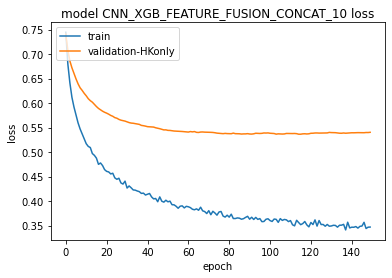

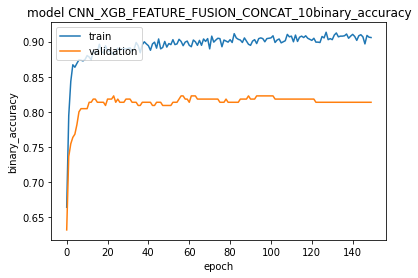

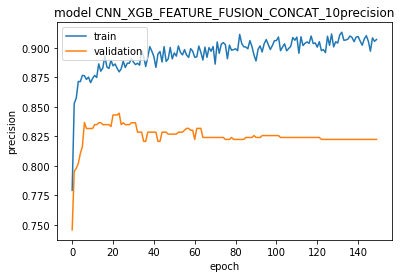

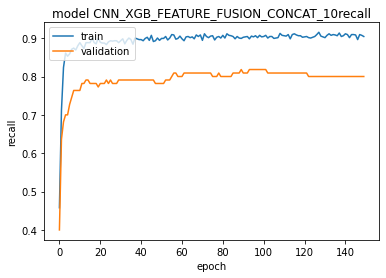

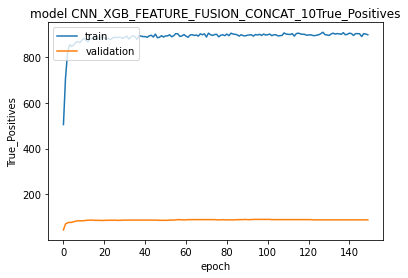

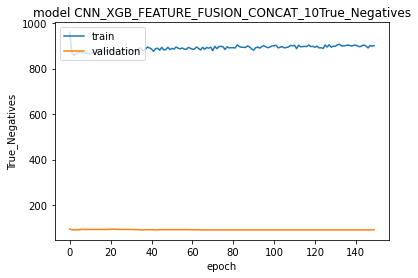

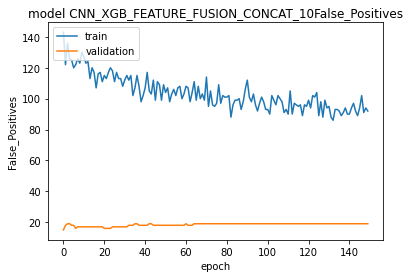

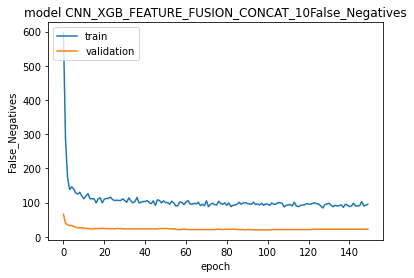

4/4 [==============================] - 3s 60ms/step - loss: 0.5731 - binary_accuracy: 0.8227 - precision: 0.8447 - recall: 0.7909 - True_Positives: 87.0000 - True_Negatives: 94.0000 - False_Positives: 16.0000 - False_Negatives: 23.0000


In [122]:
LO,AC,RC,PR,TP,TN,FP,FN,LOsk,ACsk,RCsk,PRsk,CMsk = executeFoldValidationOnModelXGB(Y_full,X_full_XGBOOST,Y_full_XGBOOST,'CNN_XGB_FEATURE_FUSION_CONCAT',epochs=150)

In [123]:
print('Evaluation of the model in 10 fold cross validation: ')
print('loss:')
print('Keras:    '+str(LO)+'   SKlearn:    '+str(LOsk))
print('accuracy:')
print('Keras:    '+str(AC)+'   SKlearn:    '+str(ACsk))
print('recall:')
print('Keras:    '+str(RC)+'   SKlearn:    '+str(RCsk))
print('precision:')
print('Keras:    '+str(PR)+'   SKlearn:    '+str(PRsk))
print('true positives:')
print(TP)
print('true negatives:')
print(TN)
print('false positives:')
print(FP)
print('false negatives:')
print(FN)
print('CONFUSION MATRIX:')
print(CMsk)

Evaluation of the model in 10 fold cross validation: 
loss:
Keras:    [0.6352746486663818, 0.5649486184120178, 0.5922238230705261, 0.6827670931816101, 0.6827053427696228, 0.6227380037307739, 0.6578027009963989, 0.656805157661438, 0.659182071685791, 0.5730968713760376]   SKlearn:    [7.779090135512877, 6.8456529138898965, 5.912093231399228, 7.849838213015, 8.163848896535015, 7.53582752949499, 9.105837332689765, 8.477815965649741, 7.2217877697047905, 6.5938609005428805]
accuracy:
Keras:    [0.7882882952690125, 0.8063063025474548, 0.8333333134651184, 0.7954545617103577, 0.7772727012634277, 0.7863636612892151, 0.7363636493682861, 0.7590909004211426, 0.8045454621315002, 0.8227272629737854]   SKlearn:    [0.7747747747747747, 0.8018018018018018, 0.8288288288288288, 0.7727272727272727, 0.7636363636363637, 0.7818181818181819, 0.7363636363636363, 0.7545454545454545, 0.7909090909090909, 0.8090909090909091]
recall:
Keras:    [0.8648648858070374, 0.8108108043670654, 0.8288288116455078, 0.7818182110

In [118]:
print('loss_mean:')
print('Keras:    '+str(mean(LO))+'   SKlearn:    '+str(mean(LOsk)))
print('accuracy_mean:')
print('Keras:    '+str(mean(AC))+'   SKlearn:    '+str(mean(ACsk)))
print('recall_mean:')
print('Keras:    '+str(mean(RC))+'   SKlearn:    '+str(mean(RCsk)))
print('precision_mean:')
print('Keras:    '+str(mean(PR))+'   SKlearn:    '+str(mean(PRsk)))
print('true positives_mean:')
print(mean(TP))
print('true negatives_mean:')
print(mean(TN))
print('false positives_mean:')
print(mean(FP))
print('false negatives_mean:')
print(mean(FN))

loss_mean:
Keras:    0.7059189260005951   SKlearn:    6.922263038211125
accuracy_mean:
Keras:    0.7995823085308075   SKlearn:    0.7995823095823096
recall_mean:
Keras:    0.7995823085308075   SKlearn:    0.806549197924315
precision_mean:
Keras:    0.7995823085308075   SKlearn:    0.8083445234768967
true positives_mean:
88.2
true negatives_mean:
88.2
false positives_mean:
22.1
false negatives_mean:
22.1


In [124]:
lines = ['XGB + CNN (FEATURE FUSION) with CONCATENATION','','Evaluation of the model in 10 fold cross validation: ','loss:',str(LO),'accuracy:',str(AC),'recall:',str(RC),'precision:',str(PR),'true positives:',str(TP),'true negatives:',str(TN),'false positives:',str(FP),'false negatives:',str(FN),
        '','MEANS: ','loss:',str(mean(LO)),'accuracy:',str(mean(AC)),'recall:',str(mean(RC)),'precision:',str(mean(PR)),'true positives:',str(mean(TP)),'true negatives:',str(mean(TN)),'false positives:',str(mean(FP)),'false negatives:',str(mean(FN)),        '','SKLEARN:','','loss:',str(LOsk),'accuracy:',str(ACsk),'recall:',str(RCsk),'precision:',str(PRsk),'true positives:','confusion matrix',str(CMsk),
        '','SKLEARN:','loss:',str(LOsk),'accuracy:',str(ACsk),'recall:',str(RCsk),'precision:',str(PRsk),'confusion matrix: ',str(CMsk),
        '','MEANS: ','loss:',str(mean(LOsk)),'accuracy:',str(mean(ACsk)),'recall:',str(mean(RCsk)),'precision:',str(mean(PRsk)),
        ]

with open('Multilayer/KFoldVal-MLP-CNN/XGB_CNN_FEATURE_FUSION_CNN_CONCATENATION.txt', 'w') as f:
    for line in lines:
        f.write(line)
        f.write('\n')

In [ ]:
print(np.mean(VALIDATION_ACCURACY))
print(np.mean(VALIDATION_LOSS))
print(np.mean(VALIDATION_RECALL))
print(np.mean(VALIDATION_PRECISION))

In [ ]:
from statistics import mean

In [ ]:
lines = ['MULTI LAYER FUSION WITH CONCATENATION','','Evaluation of the model in 10 fold cross validation: ','loss:',str(VALIDATION_LOSS),'accuracy:',str(VALIDATION_ACCURACY),'recall:',str(VALIDATION_RECALL),'precision:',str(VALIDATION_PRECISION),
        '','MEANS: ','loss:',str(mean(VALIDATION_LOSS)),'accuracy:',str(mean(VALIDATION_ACCURACY)),'recall:',str(mean(VALIDATION_RECALL)),'precision:',str(mean(VALIDATION_PRECISION))]
with open('XGBclassifierEVALUATION.txt', 'w') as f:
    for line in lines:
        f.write(line)
        f.write('\n')

In [109]:
def executeFoldValidationOnModelMLP_crossMLP(X,Y,architectureName='kFoldVal',pathForKfold=Path('Multilayer/KFoldVal-MLP-CNN'),kfold = 10, epochs = 300, mlpEpochs = 300, optim = tf.keras.optimizers.Adam(), mlpOptim= tf.keras.optimizers.Adam()):
	#kf definition
	kf = KFold(n_splits = kfold)

	VAL_ACCURACY = []
	VAL_RECALL = []
	VAL_PRECISION = []
	VAL_FP = []
	VAL_TP = []
	VAL_TN = []
	VAL_FN = []
	VAL_LOSS = []

	VAL_ACCURACY_MLP = []
	VAL_RECALL_MLP = []
	VAL_PRECISION_MLP = []
	VAL_FP_MLP = []
	VAL_TP_MLP = []
	VAL_TN_MLP = []
	VAL_FN_MLP = []
	VAL_LOSS_MLP = []
	
	VAL_ACCURACY_SK = []
	VAL_RECALL_SK = []
	VAL_PRECISION_SK = []
	VAL_CM_SK = []
	VAL_LOSS_SK = []

	save_dir = pathForKfold
	fold_var = 1

	for train_index, val_index in kf.split(X,Y):
		training_data_X = X.iloc[train_index]
		training_data_Y = Y.iloc[train_index]
		validation_data_X = X.iloc[val_index]
		validation_data_Y = Y.iloc[val_index]
		
		### MLP CLASSIFICATION AND CROSSVAL

		# search all feature that are numeric
		nameColsNumber = list(X.select_dtypes(exclude=['string','object','bool','datetime']).columns)

		# Generates the mean of the column and change NAN values with the mean of the column
		training_data_X = meanOfCol(training_data_X,nameColsNumber)
		validation_data_X = meanOfCol(validation_data_X,nameColsNumber)
		
		# if Image paths are still used there can not be a normalization so drop the path col and add it later
		X_tr_dr_Im = training_data_X['ImageFile']
		X_vl_dr_Im = validation_data_X['ImageFile']
		training_data_X = training_data_X.drop('ImageFile', axis='columns')
		validation_data_X = validation_data_X.drop('ImageFile', axis='columns')
		
		scaler = MinMaxScaler()
		training_data_X = pd.DataFrame(scaler.fit_transform(training_data_X), columns=training_data_X.columns,index=training_data_X.index)
		validation_data_X = pd.DataFrame(scaler.transform(validation_data_X), columns=validation_data_X.columns,index=validation_data_X.index)

		training_data_X['ImageFile'] = X_tr_dr_Im
		validation_data_X['ImageFile'] = X_vl_dr_Im

		# CREATE MLP
		MLP = create_mlp(training_data_X.drop('ImageFile', axis='columns').shape[1], regression=True)

		#TRAIN MLP

		MLP.compile(
		        optimizer=mlpOptim,
		        loss="binary_crossentropy",
		        metrics=METRICS,
		)

		checkpoint = tf.keras.callbacks.ModelCheckpoint(
								str(save_dir / Path('MLP_ONLY'))  +'_'+ str(fold_var), 
								monitor='val_binary_accuracy', verbose=1, 
								save_best_only=True, mode='max')

		callbacks_list = [checkpoint]

		history = MLP.fit(
		        x = training_data_X.drop(['ImageFile'],axis='columns'),
		        y = training_data_Y,
		        epochs = mlpEpochs,
		        validation_data = [validation_data_X.drop(['ImageFile'],axis='columns'),validation_data_Y],
		        callbacks = callbacks_list,
		)

		printAndSaveGraphs(save_dir,'MLP_ONLY'+'_'+str(fold_var),history=history, Metrics=METRICS)


		# LOAD BEST MODEL to evaluate the performance of the model
		MLP = tf.keras.models.load_model(str(save_dir / Path('MLP_ONLY'))  +'_'+ str(fold_var))
		
		results_MLP = MLP.evaluate(x=validation_data_X.drop('ImageFile', axis='columns'),y=validation_data_Y)

		# SAVE MLP DATA
		results_MLP = dict(zip(MLP.metrics_names,results_MLP))
		VAL_ACCURACY_MLP.append(results_MLP['binary_accuracy'])
		VAL_RECALL_MLP.append(results_MLP['recall'])
		VAL_PRECISION_MLP.append(results_MLP['precision'])
		VAL_FP_MLP.append(results_MLP['False_Positives'])
		VAL_TP_MLP.append(results_MLP['True_Positives'])
		VAL_TN_MLP.append(results_MLP['True_Negatives'])
		VAL_FN_MLP.append(results_MLP['False_Negatives'])
		VAL_LOSS_MLP.append(results_MLP['loss'])



		
		p = MLP.predict(validation_data_X.drop('ImageFile', axis='columns'))
		
		ypreds = np.argmax(p, axis=1)
		yground = np.argmax(validation_data_Y.to_numpy(), axis=1)
		loss = log_loss(yground, ypreds)
        # print('log_loss: ', loss)
		accuracy = accuracy_score(yground, ypreds)
        # print('accuracy: ', accuracy)
		precision = precision_score(yground, ypreds)
        # print('precision: ', precision)
		recall = recall_score(yground, ypreds)
        # print('recall: ', recall)
		cmatrix = confusion_matrix(yground, ypreds)
        # print(cmatrix)
		VAL_ACCURACY_SK.append(accuracy)
		VAL_RECALL_SK.append(recall)
		VAL_PRECISION_SK.append(precision)
		VAL_CM_SK.append(cmatrix)
		VAL_LOSS_SK.append(loss)  

		# make MLP not trainable
		MLP.trainable = False

		# # LOAD CNN and Images

		# X_trainIMG = loadPNGtoArray(training_data_X['ImageFile'],basePath=databasePathIMAGES)
		# X_valIMG = loadPNGtoArray(validation_data_X['ImageFile'],basePath=databasePathIMAGES)

		# cnnPath = str(Path('Multilayer/KFoldVal/OLD_DS') / Path('DSmultilayerFusion'))  +'_'+ str(fold_var)
		# cnnModel = tf.keras.models.load_model(cnnPath)
		# cnnModel = changeModelLayers(cnnModel,'cnn')
		# cnnModel.trainable = False

		# print(cnnModel.evaluate(X_valIMG,validation_data_Y))

		# fused = createModelMLPoutPCNNDS(cnnModel,MLP)
		# # fused = createModelMLPoutPCNNCONC(cnnModel,MLP)

		# fused.compile(
	    # 		optimizer=optim,
	    # 		# optimizer=tf.keras.optimizers.Adam(learning_rate=1e-05),
	    # 		loss="binary_crossentropy",
	    # 		metrics=METRICS,
		# 		)
		# checkpoint = tf.keras.callbacks.ModelCheckpoint(
		# 						str(save_dir / architectureName)  +'_'+ str(fold_var), 
		# 						monitor='val_binary_accuracy', verbose=1, 
		# 						save_best_only=True, mode='max')
		# callbacks_list = [checkpoint]
		# history = fused.fit(
		#         x = [X_trainIMG,training_data_X.drop('ImageFile', axis='columns')],
		#         y = training_data_Y,
		#         epochs = epochs,
		#         validation_data = [[X_valIMG,validation_data_X.drop('ImageFile', axis='columns')],validation_data_Y],
		#         callbacks = callbacks_list,    #some problems with DS layers and callbacks
		# 		)
		
		# printAndSaveGraphs(save_dir,architectureName+'_'+str(fold_var),history=history, Metrics=METRICS)
		
		
		# # LOAD BEST MODEL to evaluate the performance of the model
		# fused = tf.keras.models.load_model(str(save_dir / architectureName)  +'_'+ str(fold_var))
		
		# results = fused.evaluate(x=[X_valIMG,validation_data_X.drop('ImageFile', axis='columns')],y=validation_data_Y)

		# results = dict(zip(fused.metrics_names,results))
		# VAL_ACCURACY.append(results['binary_accuracy'])
		# VAL_RECALL.append(results['recall'])
		# VAL_PRECISION.append(results['precision'])
		# VAL_FP.append(results['False_Positives'])
		# VAL_TP.append(results['True_Positives'])
		# VAL_TN.append(results['True_Negatives'])
		# VAL_FN.append(results['False_Negatives'])
		# VAL_LOSS.append(results['loss'])


		tf.keras.backend.clear_session
		
		fold_var = fold_var + 1

	return VAL_LOSS,VAL_ACCURACY,VAL_RECALL,VAL_PRECISION,VAL_TP,VAL_TN,VAL_FP,VAL_FN,VAL_LOSS_MLP,VAL_ACCURACY_MLP,VAL_RECALL_MLP,VAL_PRECISION_MLP,VAL_TP_MLP,VAL_TN_MLP,VAL_FP_MLP,VAL_FN_MLP,VAL_LOSS_SK, VAL_ACCURACY_SK,VAL_RECALL_SK,VAL_PRECISION_SK,VAL_CM_SK

In [ ]:
LO,AC,RC,PR,TP,TN,FP,FN,LO_MLP,AC_MLP,RC_MLP,PR_MLP,TP_MLP,TN_MLP,FP_MLP,FN_MLP,LOsk,ACsk,RCsk,PRsk,CMsk = executeFoldValidationOnModelMLP_crossMLP(X_full,Y_full,'CNN_MLP_DS_test2',epochs=150)

In [111]:
print('Evaluation of the model in 10 fold cross validation: ')
print('loss:')
print(LO)
print('accuracy:')
print(AC)
print('recall:')
print(RC)
print('precision:')
print(PR)
print('true positives:')
print(TP)
print('true negatives:')
print(TN)
print('false positives:')
print(FP)
print('false negatives:')
print(FN)

Evaluation of the model in 10 fold cross validation: 
loss:
[]
accuracy:
[]
recall:
[]
precision:
[]
true positives:
[]
true negatives:
[]
false positives:
[]
false negatives:
[]


In [ ]:
print('loss_mean:')
print(mean(LO))
print('accuracy_mean:')
print(mean(AC))
print('recall_mean:')
print(mean(RC))
print('precision_mean:')
print(mean(PR))
print('true positives_mean:')
print(mean(TP))
print('true negatives_mean:')
print(mean(TN))
print('false positives_mean:')
print(mean(FP))
print('false negatives_mean:')
print(mean(FN))

In [ ]:
lines = ['MLP + CNN DS','','Evaluation of the model in 10 fold cross validation: ','loss:',str(LO),'accuracy:',str(AC),'recall:',str(RC),'precision:',str(PR),'true positives:',str(TP),'true negatives:',str(TN),'false positives:',str(FP),'false negatives:',str(FN),
        '','MEANS: ','loss:',str(mean(LO)),'accuracy:',str(mean(AC)),'recall:',str(mean(RC)),'precision:',str(mean(PR)),'true positives:',str(mean(TP)),'true negatives:',str(mean(TN)),'false positives:',str(mean(FP)),'false negatives:',str(mean(FN))]
with open('Multilayer/KFoldVal-MLP-CNN/MLP_CNN_DS_2.txt', 'w') as f:
    for line in lines:
        f.write(line)
        f.write('\n')

In [112]:
print('Evaluation of the MLP in 10 fold cross validation: ')
print('loss:')
print(LO_MLP)
print('accuracy:')
print(AC_MLP)
print('recall:')
print(RC_MLP)
print('precision:')
print(PR_MLP)
print('true positives:')
print(TP_MLP)
print('true negatives:')
print(TN_MLP)
print('false positives:')
print(FP_MLP)
print('false negatives:')
print(FN_MLP)

Evaluation of the MLP in 10 fold cross validation: 
loss:
[0.5779839158058167, 0.5746120810508728, 0.5227593183517456, 0.5895407199859619, 0.9741495847702026, 0.8119078874588013, 0.6988555788993835, 0.35606661438941956, 0.5351097583770752, 0.8510188460350037]
accuracy:
[0.7657657861709595, 0.7342342138290405, 0.792792797088623, 0.7727272510528564, 0.7818182110786438, 0.7590909004211426, 0.4000000059604645, 0.8727272748947144, 0.8272727131843567, 0.8363636136054993]
recall:
[0.7657657861709595, 0.7387387156486511, 0.792792797088623, 0.7727272510528564, 0.7818182110786438, 0.7545454502105713, 0.4000000059604645, 0.8636363744735718, 0.8181818127632141, 0.8363636136054993]
precision:
[0.7657657861709595, 0.7321428656578064, 0.792792797088623, 0.7727272510528564, 0.7818182110786438, 0.7614678740501404, 0.4000000059604645, 0.8796296119689941, 0.8333333134651184, 0.8363636136054993]
true positives:
[85.0, 82.0, 88.0, 85.0, 86.0, 83.0, 44.0, 95.0, 90.0, 92.0]
true negatives:
[85.0, 81.0, 88.0,

In [113]:
print('loss_mean:')
print(mean(LO_MLP))
print('accuracy_mean:')
print(mean(AC_MLP))
print('recall_mean:')
print(mean(RC_MLP))
print('precision_mean:')
print(mean(PR_MLP))
print('true positives_mean:')
print(mean(TP_MLP))
print('true negatives_mean:')
print(mean(TN_MLP))
print('false positives_mean:')
print(mean(FP_MLP))
print('false negatives_mean:')
print(mean(FN_MLP))

loss_mean:
0.6492004305124283
accuracy_mean:
0.75427927672863
recall_mean:
0.7524570018053055
precision_mean:
0.7556041330099106
true positives_mean:
83.0
true negatives_mean:
83.4
false positives_mean:
26.9
false negatives_mean:
27.3


In [114]:
lines = ['MLP','','Evaluation of the model in 10 fold cross validation: ','loss:',str(LO_MLP),'accuracy:',str(AC_MLP),'recall:',str(RC_MLP),'precision:',str(PR_MLP),'true positives:',str(TP_MLP),'true negatives:',str(TN_MLP),'false positives:',str(FP_MLP),'false negatives:',str(FN_MLP),
        '','MEANS: ','loss:',str(mean(LO_MLP)),'accuracy:',str(mean(AC_MLP)),'recall:',str(mean(RC_MLP)),'precision:',str(mean(PR_MLP)),'true positives:',str(mean(TP_MLP)),'true negatives:',str(mean(TN_MLP)),'false positives:',str(mean(FP_MLP)),'false negatives:',str(mean(FN_MLP)),
        '','MEANS: ','loss:',str(mean(LOsk)),'accuracy:',str(mean(ACsk)),'recall:',str(mean(RCsk)),'precision:',str(mean(PRsk)),
        ]
with open('Multilayer/KFoldVal-MLP-CNN/MLP_ONLY.txt', 'w') as f:
    for line in lines:
        f.write(line)
        f.write('\n')